### Markdown to study a few of the weird tracks to try and understand whats happening to them

In [85]:
import sys,os,os.path
sys.path.append("../../") # if you move files around, you need to adjust this!
sys.path.append(os.path.expanduser('~/code/eol_hsrl_python'))
sys.path.append("/home/e78368jw/Documents/NEXT_CODE/next_misc/")
os.environ['ICTDIR']='/home/e78368jw/Documents/NEXT_CODE/IC'


import random
import tables as tb
import numpy  as np
import pandas as pd
import invisible_cities.io.mcinfo_io as mcio

from matplotlib.colors import LogNorm
import matplotlib.pyplot as plt

from invisible_cities.database.load_db  import DataPMT, DataSiPM, SiPMNoise


from matplotlib.lines import Line2D
from matplotlib.patches import FancyArrowPatch
from matplotlib.legend_handler import HandlerPatch

### List of events
Here is a list of the events we want to scrape, so lets just take a single file to look at.

In [25]:
data = pd.read_pickle('true_reco_v9.h5')
display(data)

# check if its doubled
print("If empty, everything is even")
display(data[data.event %2 != 0])

data_events = np.unique(data.event.to_numpy()) //2
display(data_events)

,event,true_tracks,reco_tracks,reco-true
0,16,1,1,0
1,176,1,1,0
2,198,2,2,0
3,272,3,3,0
4,418,2,2,0
...,...,...,...,...
1352,5960518,3,3,0
1353,5980056,3,3,0
1354,5980362,4,3,-1
1355,5980392,6,2,-4


If empty, everything is even


,event,true_tracks,reco_tracks,reco-true


array([      8,      88,      99, ..., 2990181, 2990196, 2990261])

In [116]:
# load in a particular MC file

path = 'sophronia_1_208Tl.h5'
path_beer = 'beersheba_1_208Tl.h5'

# hits
dfMC_5 = mcio.load_mchits_df(path).reset_index()
# particles
dfP_5 = mcio.load_mcparticles_dfnew(path).reset_index()
# events
eventsMC_5 = np.unique(dfMC_5.event_id.to_numpy())

display(dfMC_5)
display(dfP_5)
display(eventsMC_5)

# reco

reco_5 = pd.read_hdf(path, 'RECO/Events')
display(reco_5)
# even checker. this one is all even
display(reco_5[reco_5.event % 2 != 0])
display(reco_5[reco_5.event == 16])

print("====================================================================")
print("beersheba")
print("====================================================================")

deco_5 = pd.read_hdf(path_beer, 'DECO/Events')
display(deco_5)
# even checker. this one is all even
display(deco_5[deco_5.event % 2 != 0])
display(deco_5[deco_5.event == 16])

,event_id,particle_id,hit_id,x,y,z,time,energy,label
0,0,39,0,386.361053,-182.384506,781.322083,2.307219,0.000069,ACTIVE
1,0,39,1,261.051025,-37.941269,863.623169,3.568978,0.000011,ACTIVE
2,0,47,0,214.329819,210.628296,797.141357,4.448271,0.000221,ACTIVE
3,0,62,0,214.330002,210.628357,797.141479,4.448344,0.000023,ACTIVE
4,0,61,0,214.329865,210.628296,797.141418,4.448293,0.000045,ACTIVE
...,...,...,...,...,...,...,...,...,...
117403,324,46,7,131.310883,-206.131348,44.084183,2.968418,0.001434,ACTIVE
117404,324,46,8,131.303696,-206.124832,44.088520,2.968658,0.001053,ACTIVE
117405,324,46,9,131.300247,-206.122803,44.081619,2.968858,0.001334,ACTIVE
117406,324,46,10,131.297440,-206.118759,44.081928,2.969004,0.001585,ACTIVE


,event_id,particle_id,particle_name,primary,mother_id,initial_x,initial_y,initial_z,initial_t,final_x,...,initial_momentum_x,initial_momentum_y,initial_momentum_z,final_momentum_x,final_momentum_y,final_momentum_z,kin_energy,length,creator_proc,final_proc
0,0,1,Tl208,True,0,396.388367,398.010834,533.203125,0.000000,396.388367,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000e+00,none,RadioactiveDecay
1,0,4,e-,False,1,396.388367,398.010834,533.203125,0.000583,404.212830,...,-0.072312,0.033422,-0.422984,0.000000,-0.000000,-0.000000,0.157119,1.265030e+01,RadioactiveDecay,eIoni
2,0,3,anti_nu_e,False,1,396.388367,398.010834,533.203125,0.000583,12500.000000,...,1.222432,-0.579618,-0.193677,1.222432,-0.579618,-0.193677,1.366678,1.353182e+04,RadioactiveDecay,Transportation
3,0,2,Pb208[3475.078],False,1,396.388367,398.010834,533.203125,0.000583,396.388367,...,-1.150118,0.546194,0.616660,-0.000000,0.000000,0.000000,0.000005,0.000000e+00,RadioactiveDecay,RadioactiveDecay
4,0,17,e-,False,2,396.388367,398.010834,533.203125,0.000583,397.864929,...,-0.359917,0.219978,0.226836,0.000000,-0.000000,-0.000000,0.189361,1.330159e+01,RadioactiveDecay,eIoni
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26346,324,47,e-,False,37,133.683823,-206.695068,48.265804,2.991710,133.681870,...,-0.089950,0.041418,-0.084271,-0.000000,0.000000,0.000000,0.016285,4.409947e-01,eIoni,eIoni
26347,324,46,e-,False,37,131.365372,-206.173798,44.170681,2.963983,131.295929,...,0.044843,0.107502,-0.091281,-0.000000,-0.000000,-0.000000,0.020997,7.307036e-01,eIoni,eIoni
26348,324,36,e-,False,34,378.889191,354.257019,554.717102,0.162326,378.889191,...,-0.001129,-0.005436,0.000904,-0.000000,-0.000000,0.000000,0.000031,1.181998e-07,compt,msc
26349,324,35,e-,False,34,378.889191,354.257019,554.717102,0.162326,379.216949,...,-0.705551,-1.711546,1.483487,-0.000000,-0.000000,-0.000000,1.915737,1.277002e+00,compt,eIoni


array([  0,   1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,
        13,  14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,
        26,  27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,  38,
        39,  40,  41,  42,  43,  44,  45,  46,  47,  48,  49,  50,  51,
        52,  53,  54,  55,  56,  57,  58,  59,  60,  61,  62,  63,  64,
        65,  66,  67,  68,  69,  70,  71,  72,  73,  74,  75,  76,  77,
        78,  79,  80,  81,  82,  83,  84,  85,  86,  87,  88,  89,  90,
        91,  92,  93,  94,  95,  96,  97,  98,  99, 100, 101, 102, 103,
       104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116,
       117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129,
       130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142,
       143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155,
       156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168,
       169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 18

,event,time,npeak,Xpeak,Ypeak,nsipm,X,Y,Xrms,Yrms,Z,Q,E,Qc,Ec,track_id,Ep
0,0,1.373371e+06,0,368.346366,-174.196321,1,-474.275,-163.275,0.0,0.0,770.355835,1.855072,13.439999,-1.0,0.000049,-1,-1.0
1,0,1.373371e+06,0,368.346366,-174.196321,1,225.475,-163.275,0.0,0.0,770.355835,1.043478,7.560000,-1.0,0.000025,-1,-1.0
2,0,1.373371e+06,0,368.346366,-174.196321,1,365.425,-225.475,0.0,0.0,771.310791,1.043478,14.644068,-1.0,0.000054,-1,-1.0
3,0,1.373371e+06,0,368.346366,-174.196321,1,349.875,-147.725,0.0,0.0,771.310791,1.159420,16.271187,-1.0,0.000056,-1,-1.0
4,0,1.373371e+06,0,368.346366,-174.196321,1,396.525,-178.825,0.0,0.0,771.310791,1.217391,17.084745,-1.0,0.000062,-1,-1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
795542,648,6.488070e+08,2,104.680861,-60.381546,1,85.525,-54.425,0.0,0.0,724.972595,1.101449,66.500000,-1.0,0.000210,-1,-1.0
795543,648,6.488070e+08,2,104.680861,-60.381546,1,116.625,-69.975,0.0,0.0,724.972595,1.043478,63.000000,-1.0,0.000201,-1,-1.0
795544,648,6.488070e+08,2,104.680861,-60.381546,1,116.625,-54.425,0.0,0.0,724.972595,2.260870,136.500000,-1.0,0.000435,-1,-1.0
795545,648,6.488070e+08,2,104.680861,-60.381546,1,101.075,-38.875,0.0,0.0,725.990967,1.217391,111.611104,-1.0,0.000356,-1,-1.0


,event,time,npeak,Xpeak,Ypeak,nsipm,X,Y,Xrms,Yrms,Z,Q,E,Qc,Ec,track_id,Ep


,event,time,npeak,Xpeak,Ypeak,nsipm,X,Y,Xrms,Yrms,Z,Q,E,Qc,Ec,track_id,Ep
21587,16,1.719597e+07,0,294.950939,190.401386,1,-209.925,-272.125,0.0,0.0,723.161194,1.913043,0.523810,-1.0,1.763198e-06,-1,-1.0
21588,16,1.719597e+07,0,294.950939,190.401386,1,-163.275,147.725,0.0,0.0,723.161194,1.043478,0.285714,-1.0,9.231083e-07,-1,-1.0
21589,16,1.719597e+07,0,294.950939,190.401386,1,23.325,458.725,0.0,0.0,723.161194,1.681159,0.460317,-1.0,1.770492e-06,-1,-1.0
21590,16,1.719597e+07,0,294.950939,190.401386,1,272.125,194.375,0.0,0.0,723.161194,1.217391,0.333333,-1.0,1.125620e-06,-1,-1.0
21591,16,1.719597e+07,0,294.950939,190.401386,1,380.975,-163.275,0.0,0.0,723.161194,1.449275,0.396825,-1.0,1.442418e-06,-1,-1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
24444,16,1.719597e+07,0,294.950939,190.401386,1,443.175,132.175,0.0,0.0,797.349365,1.507246,6.500000,-1.0,2.777225e-05,-1,-1.0
24445,16,1.719597e+07,0,294.950939,190.401386,1,412.075,272.125,0.0,0.0,797.349365,1.623188,7.000000,-1.0,2.561835e-05,-1,-1.0
24446,16,1.719597e+07,0,294.950939,190.401386,1,163.275,241.025,0.0,0.0,798.482971,1.101449,2.435897,-1.0,8.156173e-06,-1,-1.0
24447,16,1.719597e+07,0,294.950939,190.401386,1,209.925,458.725,0.0,0.0,798.482971,1.797101,3.974360,-1.0,1.454707e-05,-1,-1.0


beersheba


,event,npeak,X,Y,Z,E,Xpeak,Ypeak,time,nsipm,Xrms,Yrms
0,0,0.0,365.875,-194.425,773.807738,0.000003,368.346366,-174.196321,1.373371e+06,0,0,0
1,0,0.0,365.875,-193.425,773.807738,0.000003,368.346366,-174.196321,1.373371e+06,0,0,0
2,0,0.0,366.875,-195.425,773.807738,0.000005,368.346366,-174.196321,1.373371e+06,0,0,0
3,0,0.0,366.875,-194.425,773.807738,0.000006,368.346366,-174.196321,1.373371e+06,0,0,0
4,0,0.0,366.875,-193.425,773.807738,0.000006,368.346366,-174.196321,1.373371e+06,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...
2865767,648,2.0,118.875,-51.425,724.623506,0.000015,104.680861,-60.381546,6.488070e+08,0,0,0
2865768,648,2.0,119.875,-55.425,724.623506,0.000017,104.680861,-60.381546,6.488070e+08,0,0,0
2865769,648,2.0,119.875,-54.425,724.623506,0.000021,104.680861,-60.381546,6.488070e+08,0,0,0
2865770,648,2.0,119.875,-53.425,724.623506,0.000020,104.680861,-60.381546,6.488070e+08,0,0,0


,event,npeak,X,Y,Z,E,Xpeak,Ypeak,time,nsipm,Xrms,Yrms


,event,npeak,X,Y,Z,E,Xpeak,Ypeak,time,nsipm,Xrms,Yrms
91501,16,0.0,308.875,201.575,730.640203,0.000020,294.950939,190.401386,1.719597e+07,0,0,0
91502,16,0.0,308.875,202.575,730.640203,0.000020,294.950939,190.401386,1.719597e+07,0,0,0
91503,16,0.0,308.875,203.575,730.640203,0.000017,294.950939,190.401386,1.719597e+07,0,0,0
91504,16,0.0,309.875,199.575,730.640203,0.000019,294.950939,190.401386,1.719597e+07,0,0,0
91505,16,0.0,309.875,200.575,730.640203,0.000027,294.950939,190.401386,1.719597e+07,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...
107542,16,0.0,299.875,182.575,792.818316,0.000039,294.950939,190.401386,1.719597e+07,0,0,0
107543,16,0.0,299.875,183.575,792.818316,0.000030,294.950939,190.401386,1.719597e+07,0,0,0
107544,16,0.0,300.875,178.575,792.818316,0.000027,294.950939,190.401386,1.719597e+07,0,0,0
107545,16,0.0,300.875,179.575,792.818316,0.000028,294.950939,190.401386,1.719597e+07,0,0,0


### find events in this file that are in our list (our list is not multiplied yet it seems)

In [138]:
dfMC_dodgy = dfMC_5[dfMC_5.event_id.isin(data_events)]
display(dfMC_dodgy)

dfP_dodgy = dfP_5[dfP_5.event_id.isin(data_events)]
display(dfP_dodgy)

,event_id,particle_id,hit_id,x,y,z,time,energy,label
3236,8,52,0,315.166870,208.526917,731.868896,1.128019,0.000005,ACTIVE
3237,8,51,0,315.680695,208.035660,732.565308,0.961651,0.001719,ACTIVE
3238,8,51,1,316.120941,207.520065,733.248108,0.965438,0.001694,ACTIVE
3239,8,51,2,316.652252,206.863007,733.708008,0.969227,0.000674,ACTIVE
3240,8,51,3,316.177185,206.028381,733.763306,0.973017,0.004037,ACTIVE
...,...,...,...,...,...,...,...,...,...
74262,209,36,63,147.302322,324.211670,556.076538,1.059757,0.001676,ACTIVE
74263,209,36,64,147.300552,324.203674,556.069885,1.059996,0.000495,ACTIVE
74264,209,36,65,147.303848,324.210114,556.064087,1.060216,0.002614,ACTIVE
74265,209,36,66,147.303818,324.213470,556.064819,1.060332,0.001116,ACTIVE


,event_id,particle_id,particle_name,primary,mother_id,initial_x,initial_y,initial_z,initial_t,final_x,...,initial_momentum_x,initial_momentum_y,initial_momentum_z,final_momentum_x,final_momentum_y,final_momentum_z,kin_energy,length,creator_proc,final_proc
669,8,1,Tl208,True,0,397.326721,393.926666,531.145325,0.000000,397.326721,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,none,RadioactiveDecay
670,8,4,e-,False,1,397.326721,393.926666,531.145325,0.005979,392.497559,...,-0.274970,0.148090,-0.038526,-0.000000,-0.000000,0.000000,0.089120,5.964329,RadioactiveDecay,eIoni
671,8,3,anti_nu_e,False,1,397.326721,393.926666,531.145325,0.005979,10972.416992,...,0.633006,-0.727434,0.716435,0.633006,-0.727434,0.716435,1.201306,20069.183594,RadioactiveDecay,Transportation
672,8,2,Pb208[3708.451],False,1,397.326721,393.926666,531.145325,0.005979,397.326721,...,-0.358036,0.579344,-0.677908,-0.000000,0.000000,-0.000000,0.000002,0.000000,RadioactiveDecay,RadioactiveDecay
673,8,6,gamma,False,2,397.326721,393.926666,531.145325,0.005979,437.047546,...,0.292769,0.390412,-0.150731,0.000000,0.000000,-0.000000,0.510739,64.715263,RadioactiveDecay,phot
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16983,209,41,e-,False,37,110.651939,210.811798,498.103455,2.077075,110.533409,...,-0.033921,0.072033,-0.102354,-0.000000,-0.000000,0.000000,0.016197,0.547623,eIoni,eIoni
16984,209,40,e-,False,37,59.210793,239.751175,542.767334,1.475363,59.619061,...,-0.006962,-0.111102,0.176237,0.000000,-0.000000,0.000000,0.040881,2.898309,eIoni,eIoni
16985,209,39,e-,False,37,85.293869,305.242035,537.959106,1.138916,85.212181,...,-0.086008,0.103245,-0.083032,0.000000,0.000000,0.000000,0.023857,0.957441,eIoni,eIoni
16986,209,36,e-,False,35,156.370453,333.546295,559.978638,0.845491,147.303162,...,-0.440747,-0.161845,0.318401,-0.000000,-0.000000,-0.000000,0.252513,51.187717,conv,eIoni


### using the magic `plot_nexus` 

but we lightly modify it to allow for specific events to be passed in instead

In [177]:
def plot_nexus(mchits,
               mcparts,
               event, 
               toggle_arrows = True,
               toggle_mother = True, 
               xyzlims = [(0,0,0), (0,0,0)], 
               plot_only = None):
    '''
    xyzlims is [(xmin, ymin, zmin), (xmax, ymax, zmax)]

    this one takes the true event name.
    '''
    # flags to add
    # - remove annoying electrons

    # collect relevant information (hits and particle info)
    dfMC = mchits
    dfP = mcparts
    eventsMC = np.unique(dfMC.event_id.to_numpy())

    # event of interest
    evt = event

    print(f"Event: {evt}")

    # select xyz hits
    hits_xyz = dfMC.groupby("event_id").get_group(evt)[["x", "y", "z"]].values
    hits_particle_id = dfMC.groupby("event_id").get_group(evt)["particle_id"].values
    
    # select particles in event
    event_particles = dfP.groupby("event_id").get_group(evt)
    unique_particles = event_particles["particle_name"].unique()

    print(f"Unique particles: {unique_particles}")
    
    colors = dict(zip(unique_particles, plt.cm.tab20.colors))

    # get primary particle positional information and name
    primary_xyz = event_particles.loc[event_particles["primary"] == True][
        ["initial_x", "initial_y", "initial_z"]
    ].values

    primary_name = event_particles.loc[event_particles["primary"] == True][
        "particle_name"
    ].values[0]

    primary_color = colors[primary_name]

    # Scatter plot the sipm positions with the PE values
    fig = plt.figure(figsize=(10, 10))
    ax = fig.add_subplot(111, projection="3d")

    # Plot MC hits
    hits_colors = [colors[event_particles.loc[event_particles["particle_id"] == pid]["particle_name"].values[0]] for pid in hits_particle_id]
    ax.scatter(hits_xyz[:, 0], hits_xyz[:, 1], hits_xyz[:, 2], c=hits_colors, s=5, alpha = 1, label="MC hits", marker = "D")

    if xyzlims == 'hits':
        # get current axis limits to ensure hits are in frame
        x_min, x_max = ax.get_xlim()
        y_min, y_max = ax.get_ylim()
        z_min, z_max = ax.get_zlim()
        ax.set_xlim(x_min, x_max)
        ax.set_ylim(y_min, y_max)
        ax.set_zlim(z_min, z_max)
        
    # Plot the primary particle
    ax.scatter(
        primary_xyz[0][0],
        primary_xyz[0][1],
        primary_xyz[0][2],
        c="k",
        s=100,
        marker="x",
        label="Primary particle",
    )

    if xyzlims == 'primary':
        # get current axis limits to ensure primary particle is in frame
        x_min, x_max = ax.get_xlim()
        y_min, y_max = ax.get_ylim()
        z_min, z_max = ax.get_zlim()
    

    # Plot all the particles
    # Add a legend item for each unique particle
    for particle_name, color in colors.items():
        ax.scatter([], [], c=[color], label=particle_name)

    legend1 = ax.legend(loc = "upper left")

    event_particles_grouped = event_particles.groupby("particle_id")
    for i, pid in enumerate(event_particles["particle_id"].unique()):
        length = event_particles_grouped.get_group(pid)["length"].values[0]
        init_xyz = event_particles_grouped.get_group(pid)[["initial_x", "initial_y", "initial_z"]].values[0]
        final_xyz = event_particles_grouped.get_group(pid)[["final_x", "final_y", "final_z"]].values[0]
        initial_momentum_xyz = event_particles_grouped.get_group(pid)[["initial_momentum_x", "initial_momentum_y", "initial_momentum_z"]].values[0]
        final_momentum_xyz = event_particles_grouped.get_group(pid)[["final_momentum_x", "final_momentum_y", "final_momentum_z"]].values[0]
        # normalize momenta
        initial_momentum_xyz = initial_momentum_xyz / np.linalg.norm(initial_momentum_xyz)
        final_momentum_xyz = final_momentum_xyz / np.linalg.norm(final_momentum_xyz)
        pname = event_particles_grouped.get_group(pid)["particle_name"].values[0]

        # check if you want to plot the particle
        if plot_only != None:
            if pname not in plot_only:
                continue
            
        # If the length is smaller than 1 mm, we make a scatter plot of the initial position.
        if length < 1.0:
            ax.scatter(init_xyz[0], init_xyz[1], init_xyz[2], color=colors[pname], s=10)
        else:
            ax.plot(
                [init_xyz[0], final_xyz[0]],
                [init_xyz[1], final_xyz[1]],
                [init_xyz[2], final_xyz[2]],
                c=colors[pname],
            )


        # plot a thin dashed line from the mother particle to the current particle
        if toggle_mother == True:
            mother_id = event_particles_grouped.get_group(pid)["mother_id"].values[0]
            if mother_id != 0:
                mother_xyz = event_particles_grouped.get_group(mother_id)[["final_x", "final_y", "final_z"]].values[0]
                mother_name = event_particles_grouped.get_group(mother_id)["particle_name"].values[0]
                ax.plot(
                    [mother_xyz[0], init_xyz[0]],
                    [mother_xyz[1], init_xyz[1]],
                    [mother_xyz[2], init_xyz[2]],
                    c=colors[mother_name],
                    linestyle="--",    
                )

        if toggle_arrows == True:
            # Add small arrows to indicate the direction of the particle at the start and end
            ax.quiver(
                init_xyz[0],
                init_xyz[1],
                init_xyz[2],
                initial_momentum_xyz[0],
                initial_momentum_xyz[1],
                initial_momentum_xyz[2],
                color=colors[pname],
                length=40,
            )
            ax.quiver(
                final_xyz[0],
                final_xyz[1],
                final_xyz[2],
                final_momentum_xyz[0],
                final_momentum_xyz[1],
                final_momentum_xyz[2],
                color=colors[pname],
                length=40,
            )

    ax.set_xlabel("X (mm)")
    ax.set_ylabel("Y (mm)")
    ax.set_zlabel("Z (mm)")
    if xyzlims[0] == 'self-set':
        ax.set_xlim(xyzlims[1][0], xyzlims[2][0])
        ax.set_ylim(xyzlims[1][1], xyzlims[2][1])
        ax.set_zlim(xyzlims[1][2], xyzlims[2][2])
    

    # Add custom legend entries for the second legend
    arrow_line = Line2D([0], [0], color="blue", linestyle="-", marker=">", markersize=10)
    line = Line2D([0], [0], color="black", linestyle="--", lw=2)
    straight_line = Line2D([0], [0], color = "red")

    # Add the custom legend
    legend2 = ax.legend(
        [arrow_line, line, straight_line],  # Custom handles
        ["direction of travel", "mother to daughter", "initial to final"],  # Labels
        loc="lower right"  # Position
    )

    # Add both legends to the plot
    ax.add_artist(legend1)
    ax.add_artist(legend2)

    fig.suptitle(f'LPR event {evt} - arrows: {toggle_arrows} mother: {toggle_mother}', fontsize = 20)
    plt.show()


In [187]:
def plot_hits(mchits,
              mcparts,
              event,
              sophronia = False,
              sophronia_data = None,
              pitch = 15.55,
              plot_fig = True):
    


    # force figure
    fig = plt.figure(figsize = (8,8))
    ax = fig.add_subplot(111, projection='3d')



    ###################################################

    evt = event

    true_part = mcparts[mcparts.event_id == evt]
    
    def return_id(number):
        return str(true_part[true_part.particle_id == number].particle_name.values).strip("'[]'")
    
    # 0th event
    true = mchits[mchits.event_id == evt]
    # select event
    true['particle_name'] = true['particle_id'].apply(return_id)
    
    
    
    for pid, df in true.groupby('particle_name'):
    
        xt = df.x
        yt = df.y
        zt = df.z
        et = df.energy*1000
    
    
        #if (pid == 'gamma') or (pid == 'Xe131') or (pid == 'Xe129'):
        #    q = ax.scatter3D(xt, yt, zt, alpha = 1, zorder = 0, label = str(pid), s = 10)
        #else:
        r = ax.scatter3D(xt, yt, zt, alpha = 1, zorder = 0, label = str(pid), s = 10)
    
    
    ax.set_xlabel('X (mm)')
    ax.set_ylabel('Y (mm)')
    ax.set_zlabel('Z (mm)')
    
    # Retrieve legend handles and labels
    handles, labels = plt.gca().get_legend_handles_labels()
    
    # Create a single legend for all subplots
    legend = ax.legend(handles, labels, fontsize=15)
    for handle in legend.legendHandles:
        handle.set_alpha(1.0)
    
    plt.title('True Hits_YZ_' + str(evt), fontsize=30)



    #### shoehorning sophronia in here
    if sophronia == True:
        try:
            detector = "next100"

            data = sophronia_data[sophronia_data.event == event*2]
            
            x = data.X
            y = data.Y
            z = data.Z
            e = data.E
            q = data.E


            


            xx = np.arange(x.min(), x.max() + pitch, pitch)
            yy = np.arange(y.min(), y.max() + pitch, pitch)
            zz = z.unique()

            
            xflat = np.full_like(x, min(ax.get_xlim()))
            yflat = np.full_like(y, max(ax.get_ylim()))
            zflat = np.full_like(z, min(ax.get_zlim()))

            #ax.scatter(xflat, y, z, alpha = 0.005)
            ax.scatter(x, yflat, z, alpha = 0.005)
            ax.scatter(x, y, zflat, alpha = 0.005)

            #ax.hist2D(x, y, bins=[xx, yy], weights=q, cmin=0.0001)
        except Exception as e:
            print(e)


    if plot_fig == True:
        #
        # plt.savefig(f'plots/{evt}.png')
        plt.show()

    # will output the spacial values so you can use these with looking at the sophronia data
    x_min, x_max = ax.get_xlim()
    y_min, y_max = ax.get_ylim()
    z_min, z_max = ax.get_zlim()
    return ((x_min, x_max), (y_min, y_max), (z_min, z_max))

In [188]:
def plot_sophronia_hits(reco, evt, xyzlims = None, pitch = 15.55):
    '''
    two plots, 2d then 3d
    '''
    
    # collect the relevant event

    data = reco[reco.event == evt]
    
    x = data.X
    y = data.Y
    z = data.Z
    e = data.Ec
    q = data.Q
    

    fig, axes = plt.subplots(1, 3, figsize=(18, 4))


    xx = np.arange(x.min(), x.max() + pitch, pitch)
    yy = np.arange(y.min(), y.max() + pitch, pitch)
    zz = z.unique()

    axes[0].hist2d(x, y, bins=[xx, yy], weights=q, cmin=0.0001);
    axes[0].set_xlabel('X (mm)');
    axes[0].set_ylabel('Y (mm)');

    axes[1].hist2d(x, z, bins=[xx, zz], weights=q, cmin=0.0001);
    axes[1].set_xlabel('X (mm)');
    axes[1].set_ylabel('Z (mm)');

    axes[2].hist2d(y, z, bins=[yy, zz], weights=q, cmin=0.0001);
    axes[2].set_xlabel('Y (mm)');
    axes[2].set_ylabel('Z (mm)');

    plt.title(f'LPR event {evt} - sophronia output')
    plt.show()

    fig = plt.figure(figsize = (8,8))
    ax = fig.add_subplot(111, projection='3d')
    
    
    q = ax.scatter(x, y, z, c = e , alpha = 0.5, cmap = 'viridis')

    cb = fig.colorbar(q, ax=ax)
    cb.set_label("Energy (keV)")
    ax.set_xlabel('x (mm)')
    ax.set_ylabel('y (mm)')
    ax.set_zlabel('z (mm)')
    plt.title(f'LPR event {evt} - sophronia output')

    # you're setting them yourself from the true MC hits
    if xyzlims != None:
        ax.set_xlim(xyzlims[0])
        ax.set_ylim(xyzlims[1])
        ax.set_zlim(xyzlims[2])


    plt.show()

    

Event: 8
Unique particles: ['Tl208' 'e-' 'anti_nu_e' 'Pb208[3708.451]' 'gamma' 'Pb208[3197.711]'
 'Pb208[2614.522]' 'Xe132' 'e+' 'Pb208']


/tmp/ipykernel_25758/1644647825.py:99: RuntimeWarning: invalid value encountered in true_divide
  initial_momentum_xyz = initial_momentum_xyz / np.linalg.norm(initial_momentum_xyz)
/tmp/ipykernel_25758/1644647825.py:100: RuntimeWarning: invalid value encountered in true_divide
  final_momentum_xyz = final_momentum_xyz / np.linalg.norm(final_momentum_xyz)


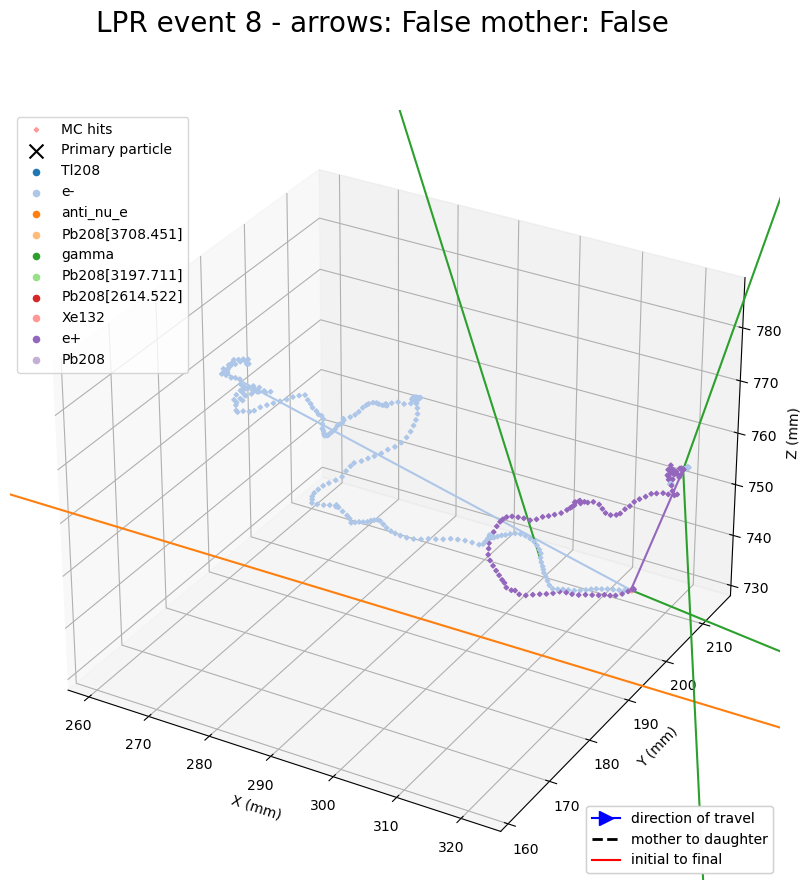

In [189]:
plot_nexus(dfMC_dodgy, dfP_dodgy, data_events[0], xyzlims = 'hits', toggle_arrows = False, toggle_mother = False)

### a slightly less messy way to look at all the hits

/tmp/ipykernel_25758/2154395128.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  true['particle_name'] = true['particle_id'].apply(return_id)


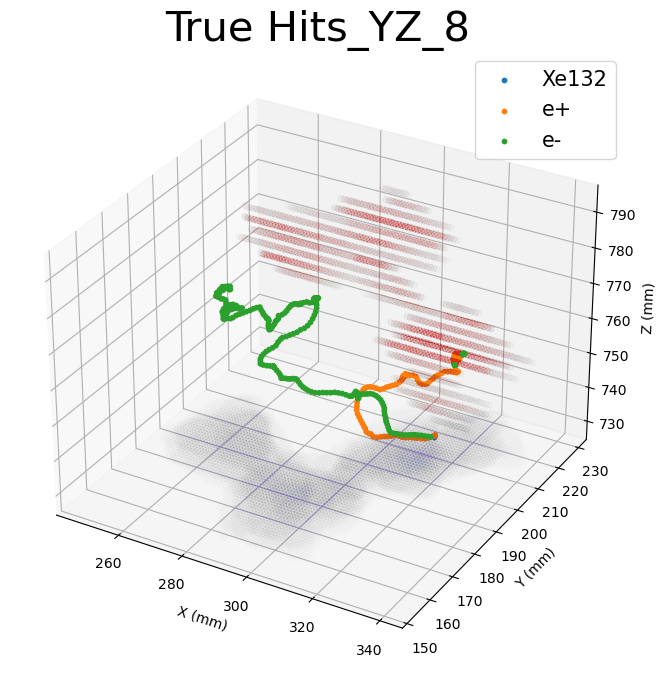

((242.225, 344.525), (149.825, 232.325), (726.0086957299804, 795.9997260961915))


In [190]:
xyzlims = plot_hits(dfMC_dodgy, dfP_dodgy, data_events[0], sophronia = True, sophronia_data = deco_5)
print(xyzlims)

### then plot the sophronia output

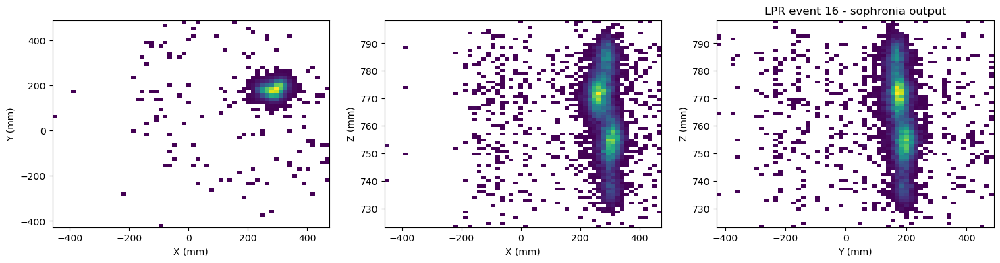

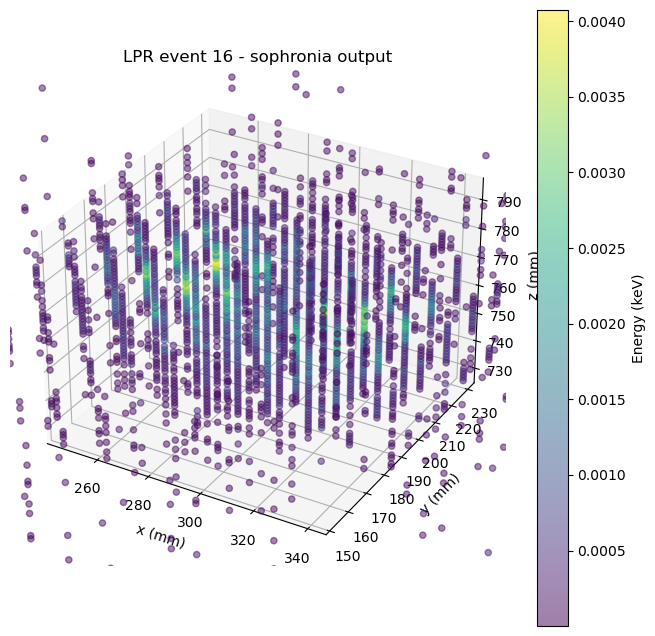

In [191]:
plot_sophronia_hits(reco_5, data_events[0]*2, xyzlims = xyzlims)

yikes, useless?

In [192]:
def plot_all_info(dfMC, dfP, r_t, event, deco):

    # plot wiht all the bells and whistles
    plot_nexus(dfMC, dfP, event, xyzlims = 'hits', toggle_arrows = False, toggle_mother = True)
    
    # plot just the hits for clarity
    x = plot_hits(dfMC, dfP, event, sophronia = True, sophronia_data = deco, plot_fig = False)

    # save it and show it after you implement box with true and reco track info
    rt_data = r_t[r_t.event == event*2]
    s = f"True tracks: {rt_data.true_tracks}\n Reco tracks: {rt_data.reco_tracks}"
    

    
    plt.savefig(f'plots/{event}.png')

    # print the reco - true track info. needs to be doubled because of MC/hits mismatch
    print("Track knowledge")
    display(r_t[r_t.event == event*2])

Event: 8
Unique particles: ['Tl208' 'e-' 'anti_nu_e' 'Pb208[3708.451]' 'gamma' 'Pb208[3197.711]'
 'Pb208[2614.522]' 'Xe132' 'e+' 'Pb208']


/tmp/ipykernel_25758/1644647825.py:99: RuntimeWarning: invalid value encountered in true_divide
  initial_momentum_xyz = initial_momentum_xyz / np.linalg.norm(initial_momentum_xyz)
/tmp/ipykernel_25758/1644647825.py:100: RuntimeWarning: invalid value encountered in true_divide
  final_momentum_xyz = final_momentum_xyz / np.linalg.norm(final_momentum_xyz)


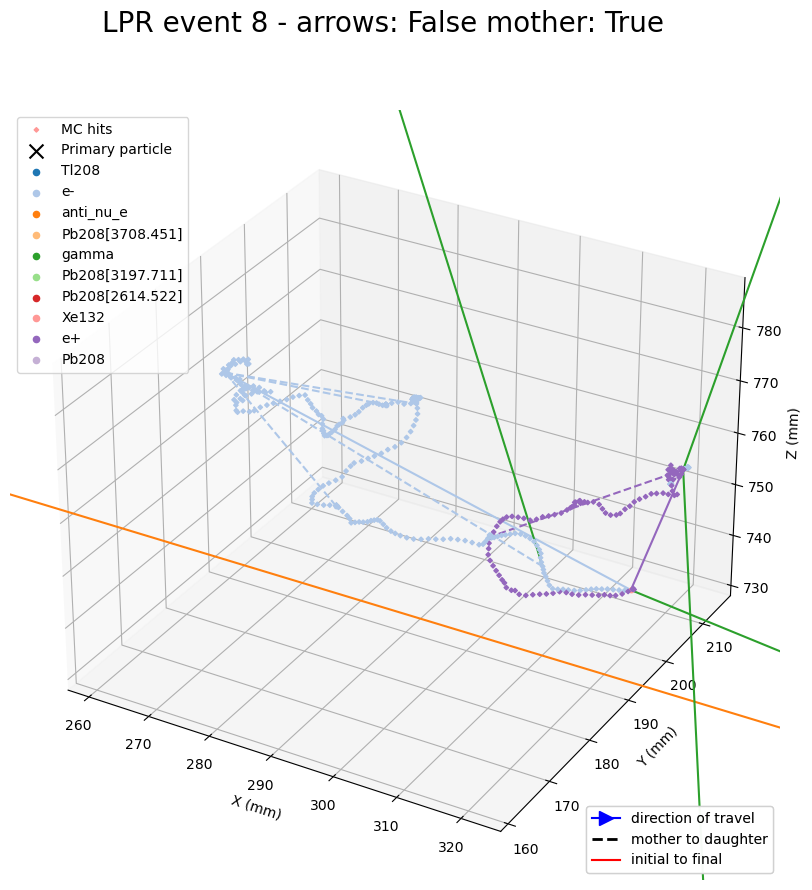

/tmp/ipykernel_25758/2154395128.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  true['particle_name'] = true['particle_id'].apply(return_id)


Track knowledge


,event,true_tracks,reco_tracks,reco-true
0,16,1,1,0


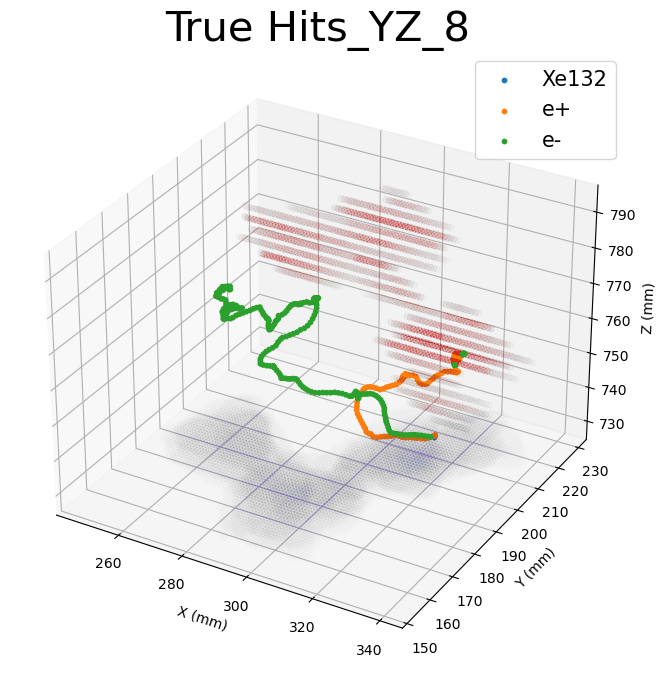

In [193]:
plot_all_info(dfMC_dodgy, dfP_dodgy, data, data_events[0], deco_5)

### load in lots of data at once and merge them into dataframes

array([      8,      88,      99, ..., 2990181, 2990196, 2990261])

Event: 2040017
Unique particles: ['Tl208' 'e-' 'anti_nu_e' 'Pb208[3475.078]' 'gamma' 'Pb208[3197.711]'
 'Pb208[2614.522]' 'Xe129' 'e+' 'Pb208']


/tmp/ipykernel_25758/1644647825.py:99: RuntimeWarning: invalid value encountered in true_divide
  initial_momentum_xyz = initial_momentum_xyz / np.linalg.norm(initial_momentum_xyz)
/tmp/ipykernel_25758/1644647825.py:100: RuntimeWarning: invalid value encountered in true_divide
  final_momentum_xyz = final_momentum_xyz / np.linalg.norm(final_momentum_xyz)


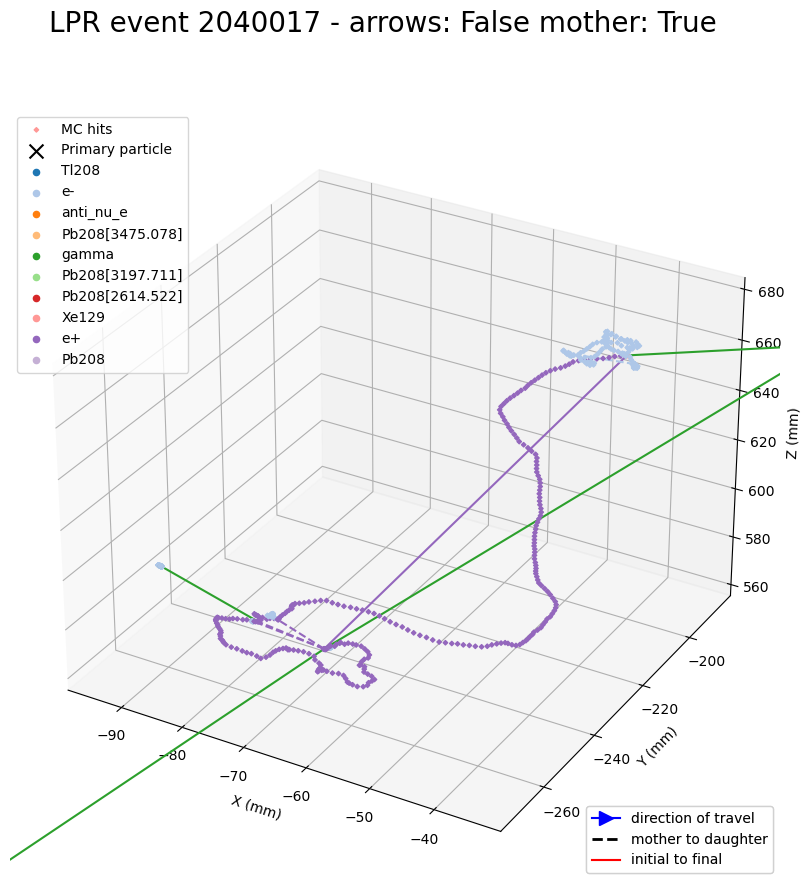

/tmp/ipykernel_25758/2268694555.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  true['particle_name'] = true['particle_id'].apply(return_id)


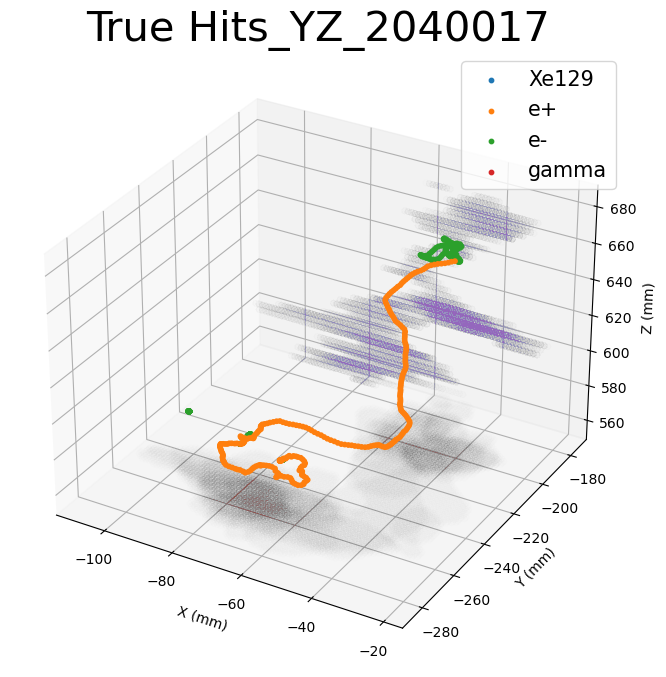

Track knowledge


,event,true_tracks,reco_tracks,reco-true
940,4080034,1,2,1


Event: 2040074
Unique particles: ['Tl208' 'e-' 'anti_nu_e' 'Pb208[3197.711]' 'gamma' 'Pb208[2614.522]'
 'Xe136' 'e+' 'Pb208']


/tmp/ipykernel_25758/1644647825.py:99: RuntimeWarning: invalid value encountered in true_divide
  initial_momentum_xyz = initial_momentum_xyz / np.linalg.norm(initial_momentum_xyz)
/tmp/ipykernel_25758/1644647825.py:100: RuntimeWarning: invalid value encountered in true_divide
  final_momentum_xyz = final_momentum_xyz / np.linalg.norm(final_momentum_xyz)


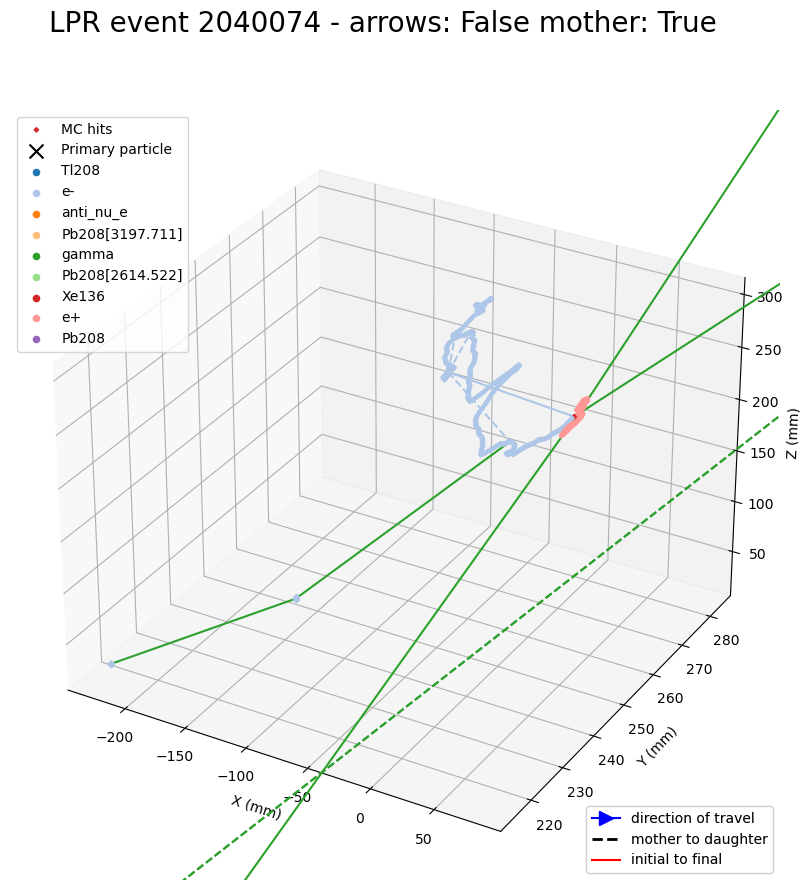

/tmp/ipykernel_25758/2268694555.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  true['particle_name'] = true['particle_id'].apply(return_id)


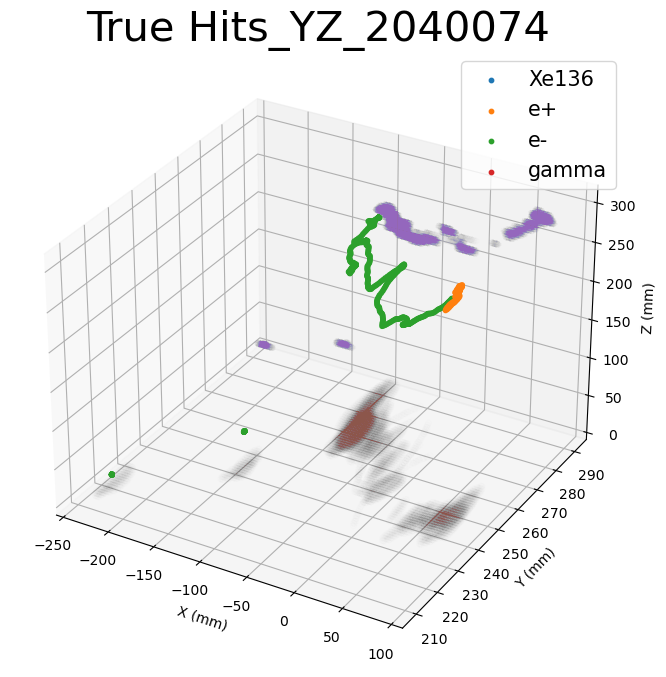

Track knowledge


,event,true_tracks,reco_tracks,reco-true
941,4080148,3,5,2


Event: 2040165
Unique particles: ['Tl208' 'e-' 'anti_nu_e' 'Pb208[3197.711]' 'gamma' 'Pb208[2614.522]'
 'Xe134' 'e+' 'Pb208']


/tmp/ipykernel_25758/1644647825.py:99: RuntimeWarning: invalid value encountered in true_divide
  initial_momentum_xyz = initial_momentum_xyz / np.linalg.norm(initial_momentum_xyz)
/tmp/ipykernel_25758/1644647825.py:100: RuntimeWarning: invalid value encountered in true_divide
  final_momentum_xyz = final_momentum_xyz / np.linalg.norm(final_momentum_xyz)


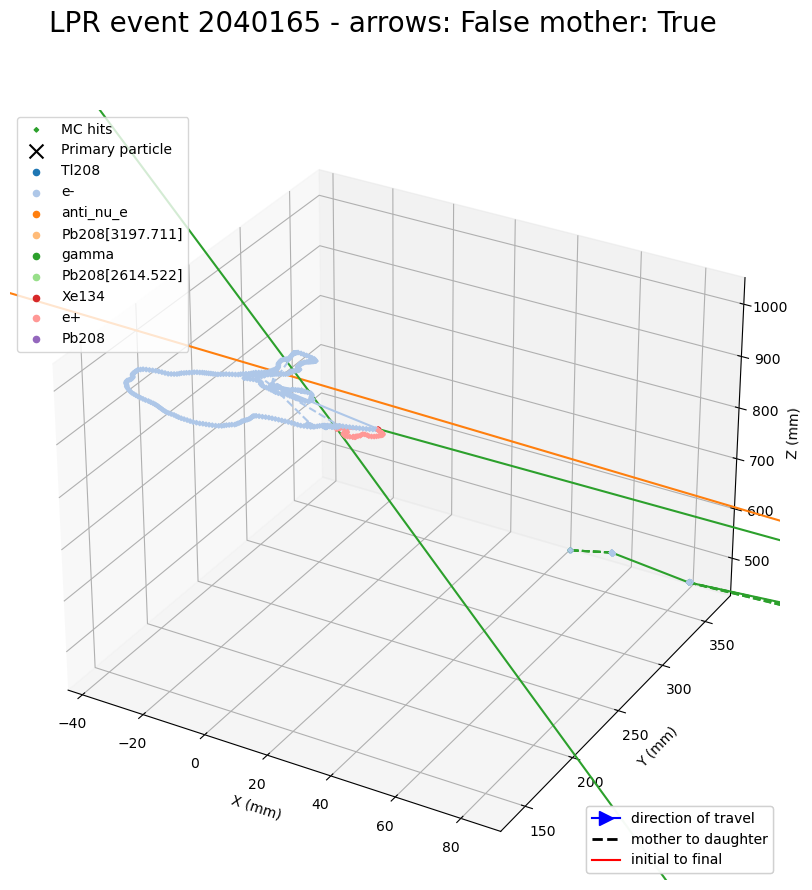

/tmp/ipykernel_25758/2268694555.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  true['particle_name'] = true['particle_id'].apply(return_id)


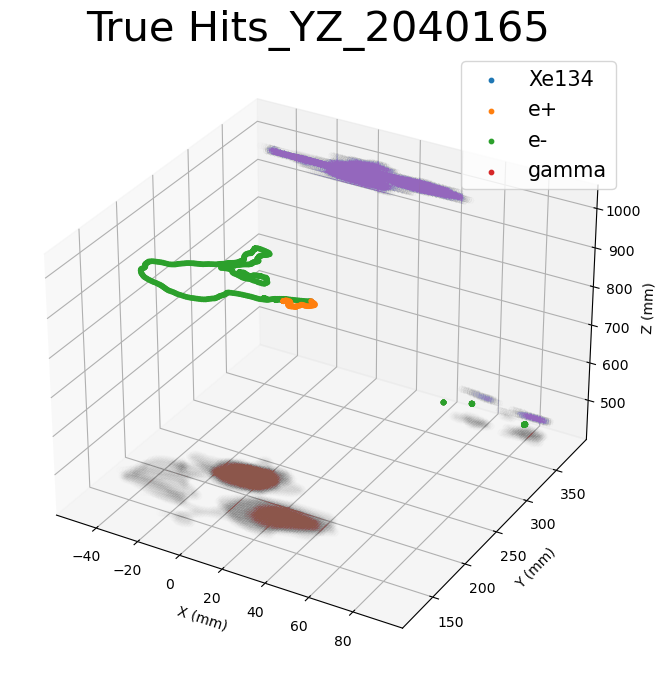

Track knowledge


,event,true_tracks,reco_tracks,reco-true
942,4080330,4,2,-2


Event: 2040213
Unique particles: ['Tl208' 'e-' 'anti_nu_e' 'Pb208[3475.078]' 'gamma' 'Pb208[3197.711]'
 'Pb208[2614.522]' 'Xe134' 'e+' 'Pb208']


/tmp/ipykernel_25758/1644647825.py:99: RuntimeWarning: invalid value encountered in true_divide
  initial_momentum_xyz = initial_momentum_xyz / np.linalg.norm(initial_momentum_xyz)
/tmp/ipykernel_25758/1644647825.py:100: RuntimeWarning: invalid value encountered in true_divide
  final_momentum_xyz = final_momentum_xyz / np.linalg.norm(final_momentum_xyz)


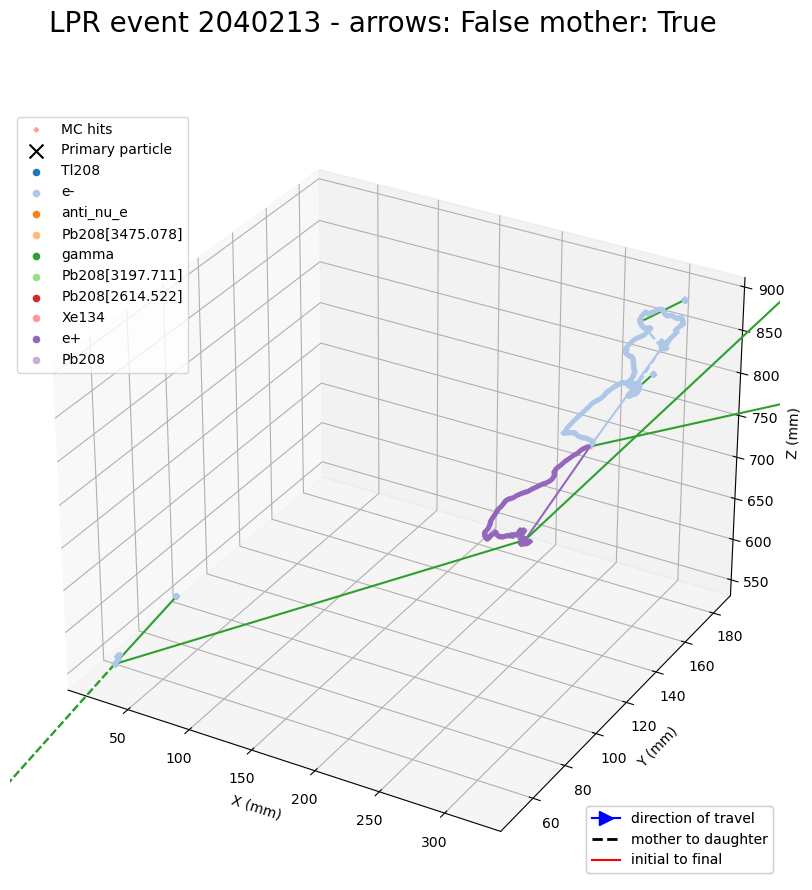

/tmp/ipykernel_25758/2268694555.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  true['particle_name'] = true['particle_id'].apply(return_id)


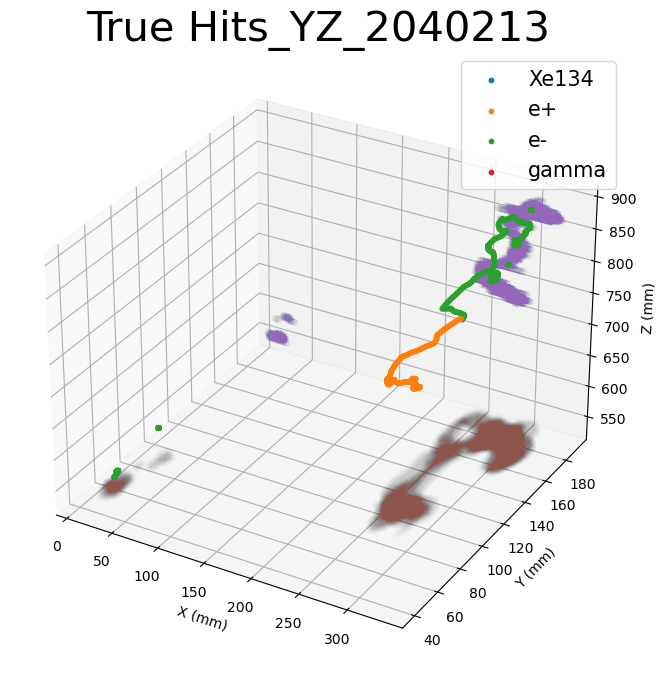

Track knowledge


,event,true_tracks,reco_tracks,reco-true
943,4080426,3,3,0


Event: 2040255
Unique particles: ['Tl208' 'e-' 'anti_nu_e' 'Pb208[3197.711]' 'gamma' 'Pb208[2614.522]'
 'Xe132' 'e+' 'Pb208']


/tmp/ipykernel_25758/1644647825.py:99: RuntimeWarning: invalid value encountered in true_divide
  initial_momentum_xyz = initial_momentum_xyz / np.linalg.norm(initial_momentum_xyz)
/tmp/ipykernel_25758/1644647825.py:100: RuntimeWarning: invalid value encountered in true_divide
  final_momentum_xyz = final_momentum_xyz / np.linalg.norm(final_momentum_xyz)


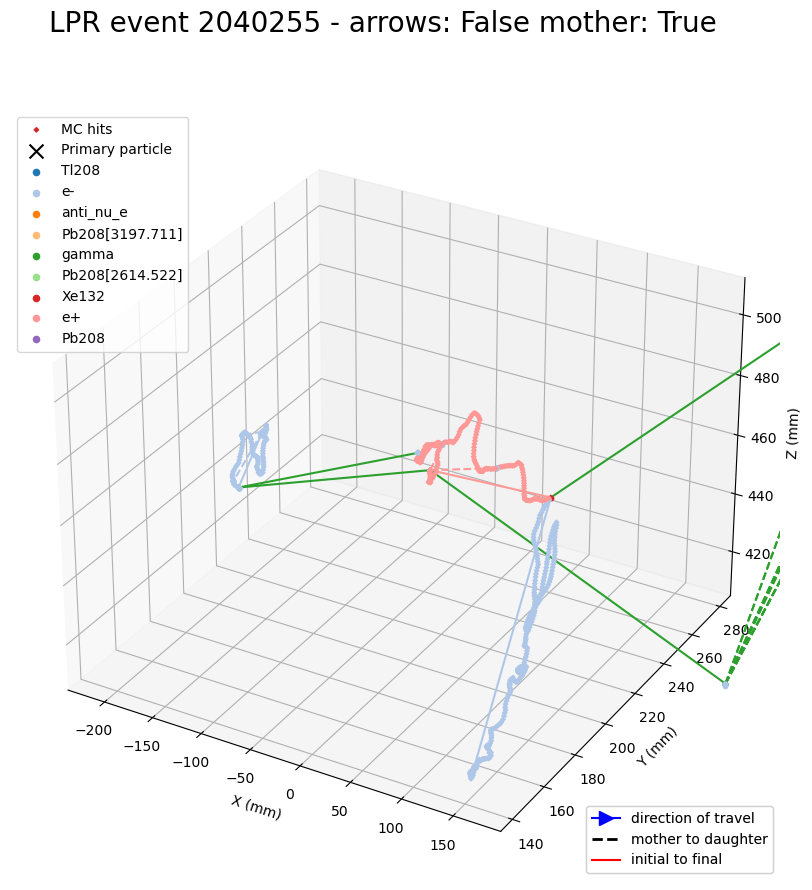

/tmp/ipykernel_25758/2268694555.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  true['particle_name'] = true['particle_id'].apply(return_id)


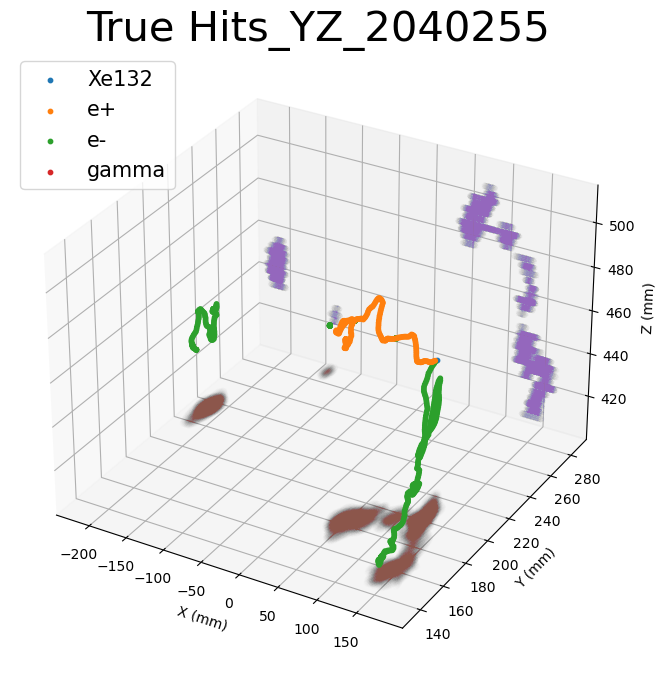

Track knowledge


,event,true_tracks,reco_tracks,reco-true
944,4080510,3,3,0


Event: 2040316
Unique particles: ['Tl208' 'e-' 'anti_nu_e' 'Pb208[3197.711]' 'gamma' 'Pb208[2614.522]'
 'Xe129' 'e+' 'Pb208']


/tmp/ipykernel_25758/1644647825.py:99: RuntimeWarning: invalid value encountered in true_divide
  initial_momentum_xyz = initial_momentum_xyz / np.linalg.norm(initial_momentum_xyz)
/tmp/ipykernel_25758/1644647825.py:100: RuntimeWarning: invalid value encountered in true_divide
  final_momentum_xyz = final_momentum_xyz / np.linalg.norm(final_momentum_xyz)


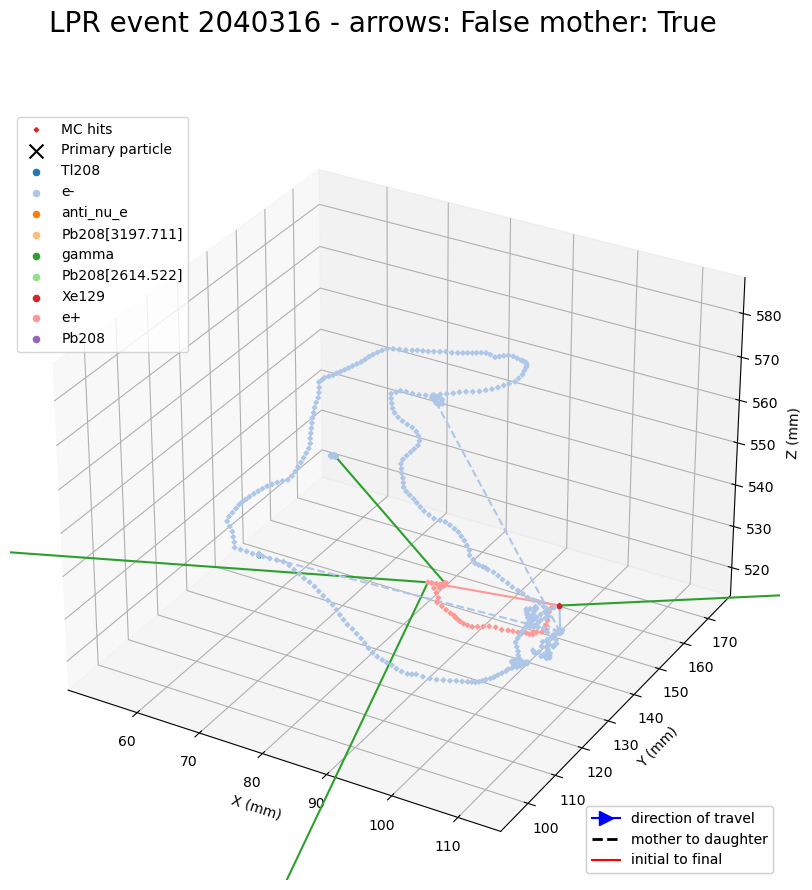

/tmp/ipykernel_25758/2268694555.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  true['particle_name'] = true['particle_id'].apply(return_id)


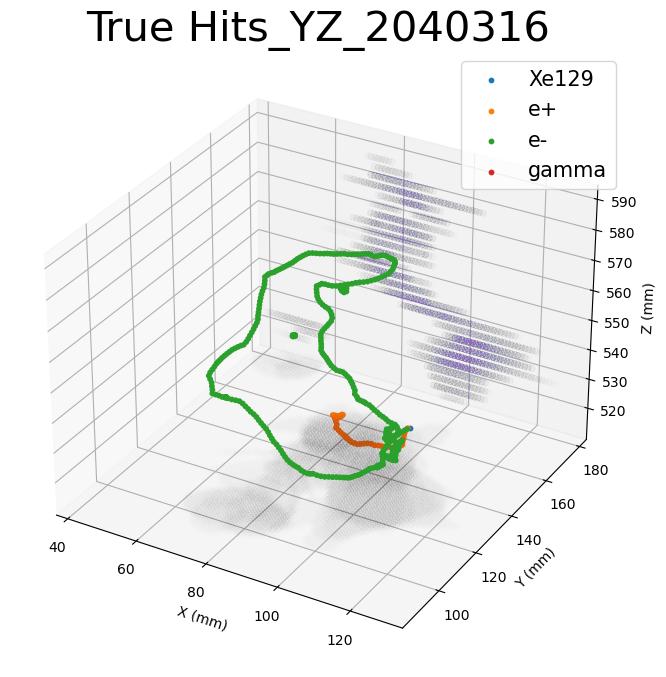

Track knowledge


,event,true_tracks,reco_tracks,reco-true
945,4080632,2,2,0


Event: 2040351
Unique particles: ['Tl208' 'e-' 'anti_nu_e' 'Pb208[3197.711]' 'gamma' 'Pb208[2614.522]'
 'Xe129' 'e+' 'Pb208']


/tmp/ipykernel_25758/1644647825.py:99: RuntimeWarning: invalid value encountered in true_divide
  initial_momentum_xyz = initial_momentum_xyz / np.linalg.norm(initial_momentum_xyz)
/tmp/ipykernel_25758/1644647825.py:100: RuntimeWarning: invalid value encountered in true_divide
  final_momentum_xyz = final_momentum_xyz / np.linalg.norm(final_momentum_xyz)


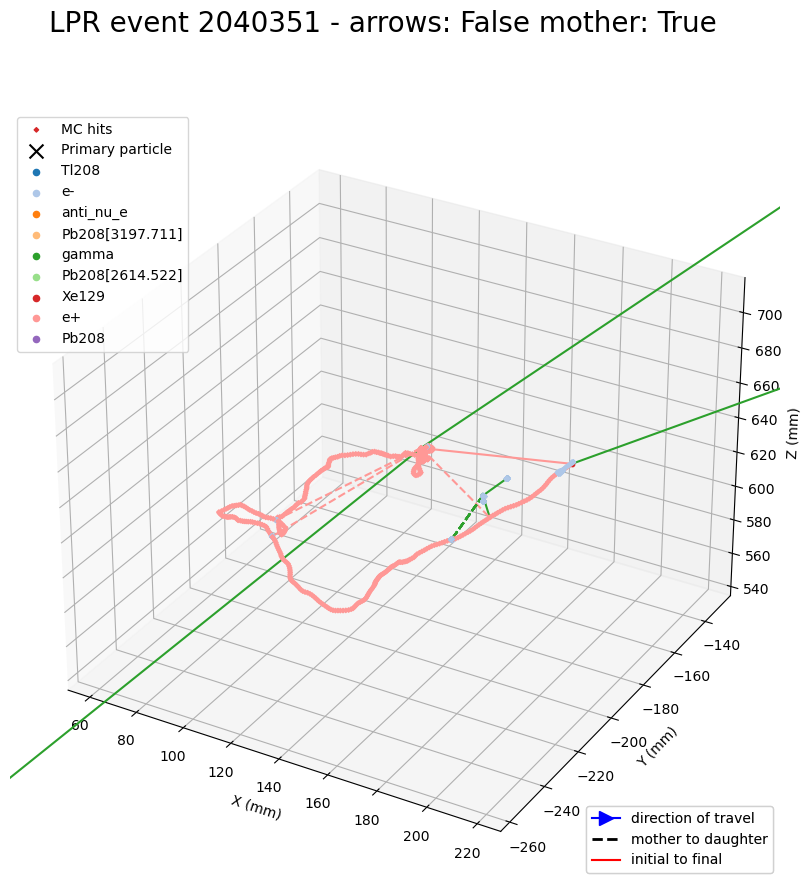

/tmp/ipykernel_25758/2268694555.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  true['particle_name'] = true['particle_id'].apply(return_id)


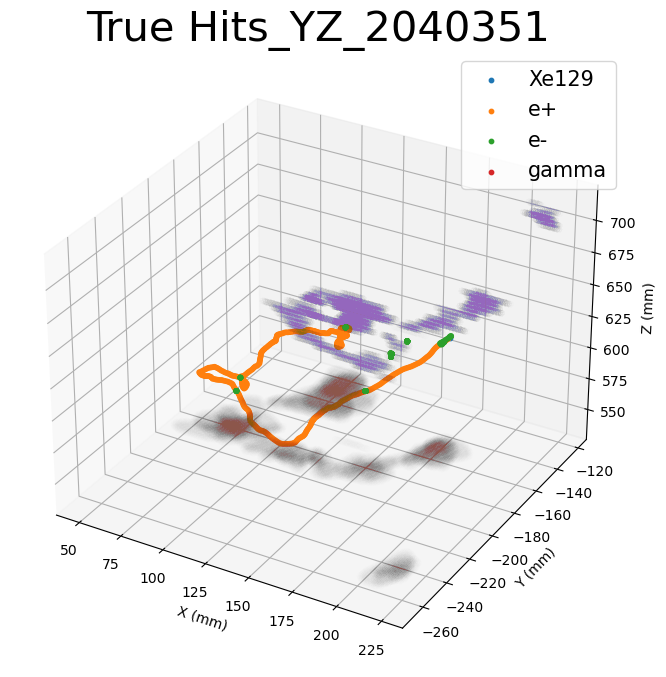

Track knowledge


,event,true_tracks,reco_tracks,reco-true
946,4080702,2,2,0


Event: 1950055
Unique particles: ['Tl208' 'e-' 'anti_nu_e' 'Pb208[3475.078]' 'gamma' 'Pb208[3197.711]'
 'Pb208[2614.522]' 'Xe131' 'e+' 'Pb208']


/tmp/ipykernel_25758/1644647825.py:99: RuntimeWarning: invalid value encountered in true_divide
  initial_momentum_xyz = initial_momentum_xyz / np.linalg.norm(initial_momentum_xyz)
/tmp/ipykernel_25758/1644647825.py:100: RuntimeWarning: invalid value encountered in true_divide
  final_momentum_xyz = final_momentum_xyz / np.linalg.norm(final_momentum_xyz)


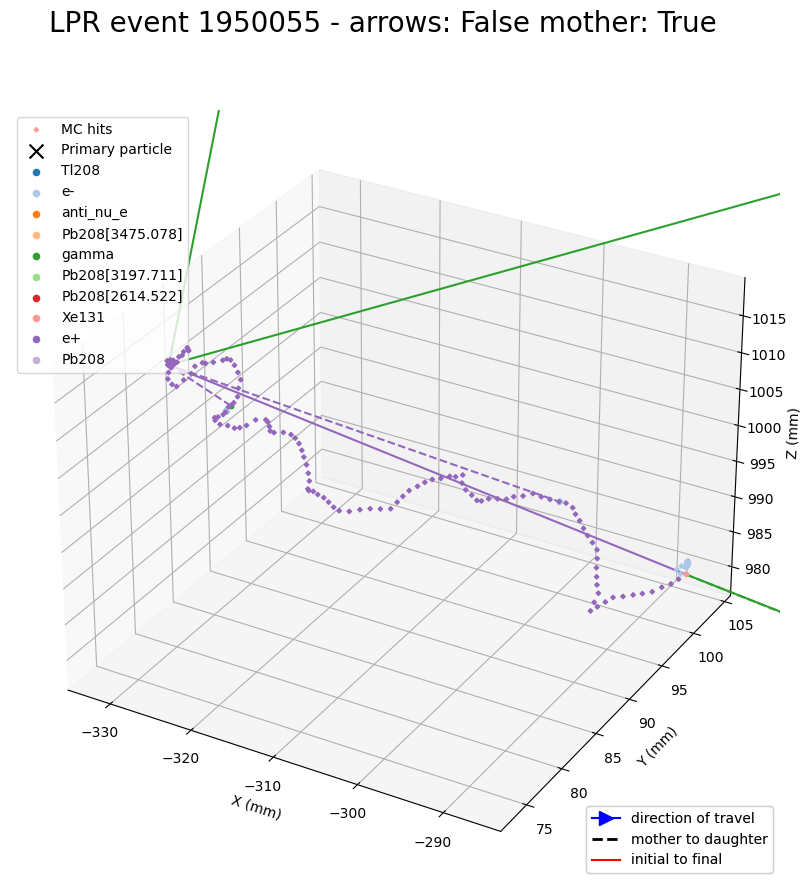

/tmp/ipykernel_25758/2268694555.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  true['particle_name'] = true['particle_id'].apply(return_id)


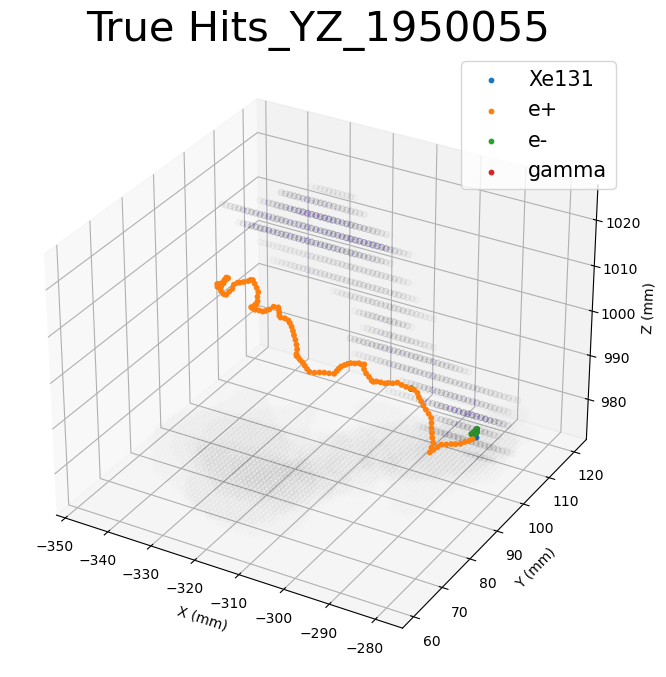

Track knowledge


,event,true_tracks,reco_tracks,reco-true
898,3900110,1,1,0


Event: 1950145
Unique particles: ['Tl208' 'e-' 'anti_nu_e' 'Pb208[3197.711]' 'gamma' 'Pb208[2614.522]'
 'Xe132' 'e+' 'Pb208']


/tmp/ipykernel_25758/1644647825.py:99: RuntimeWarning: invalid value encountered in true_divide
  initial_momentum_xyz = initial_momentum_xyz / np.linalg.norm(initial_momentum_xyz)
/tmp/ipykernel_25758/1644647825.py:100: RuntimeWarning: invalid value encountered in true_divide
  final_momentum_xyz = final_momentum_xyz / np.linalg.norm(final_momentum_xyz)


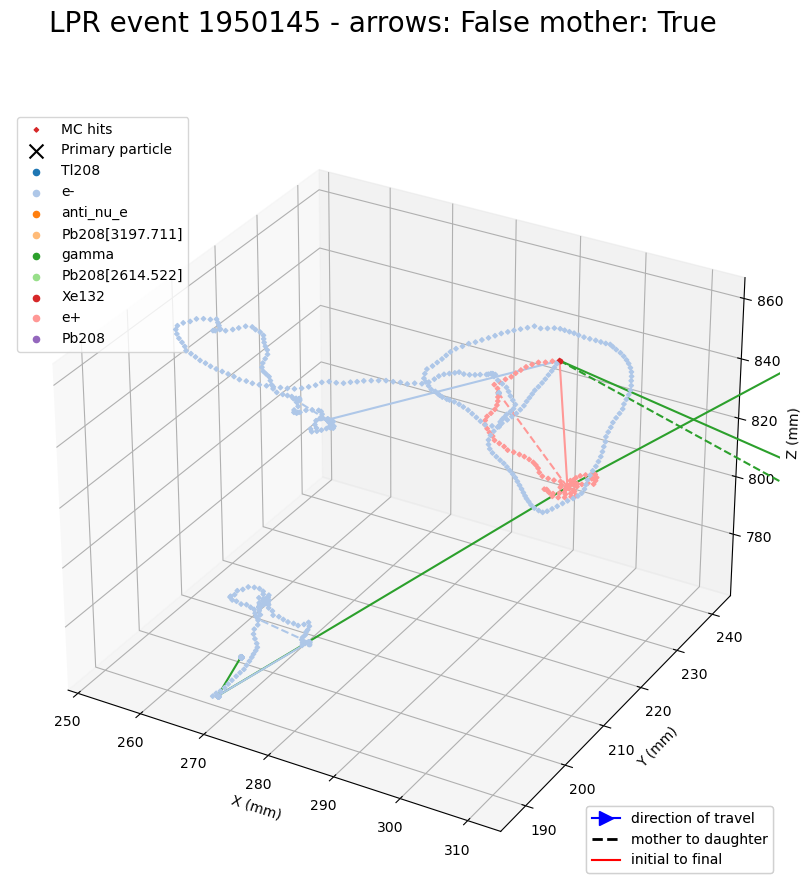

/tmp/ipykernel_25758/2268694555.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  true['particle_name'] = true['particle_id'].apply(return_id)


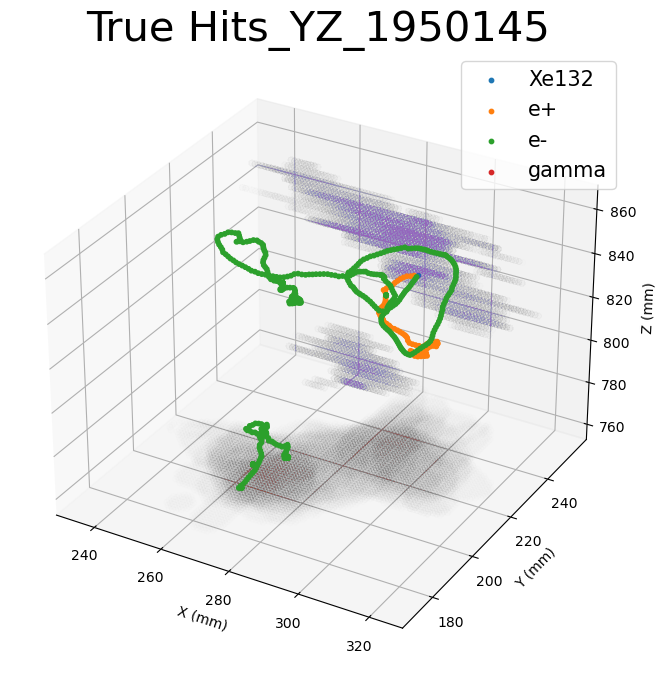

Track knowledge


,event,true_tracks,reco_tracks,reco-true
899,3900290,2,2,0


Event: 1950179
Unique particles: ['Tl208' 'e-' 'anti_nu_e' 'Pb208[3197.711]' 'gamma' 'Pb208[2614.522]'
 'Xe132' 'e+' 'Pb208']


/tmp/ipykernel_25758/1644647825.py:99: RuntimeWarning: invalid value encountered in true_divide
  initial_momentum_xyz = initial_momentum_xyz / np.linalg.norm(initial_momentum_xyz)
/tmp/ipykernel_25758/1644647825.py:100: RuntimeWarning: invalid value encountered in true_divide
  final_momentum_xyz = final_momentum_xyz / np.linalg.norm(final_momentum_xyz)


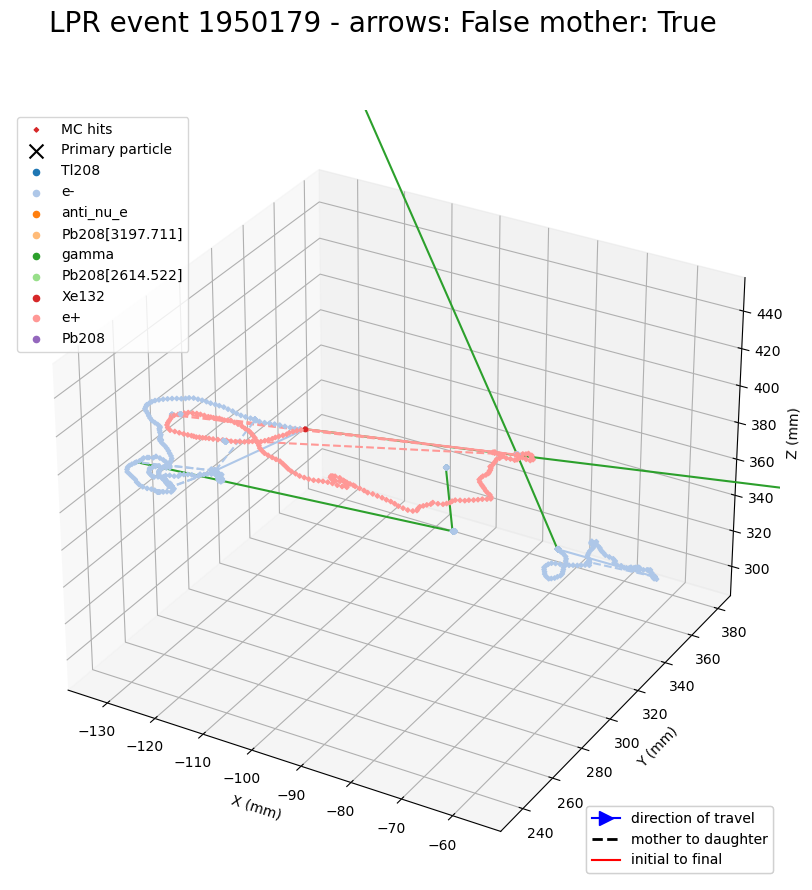

/tmp/ipykernel_25758/2268694555.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  true['particle_name'] = true['particle_id'].apply(return_id)


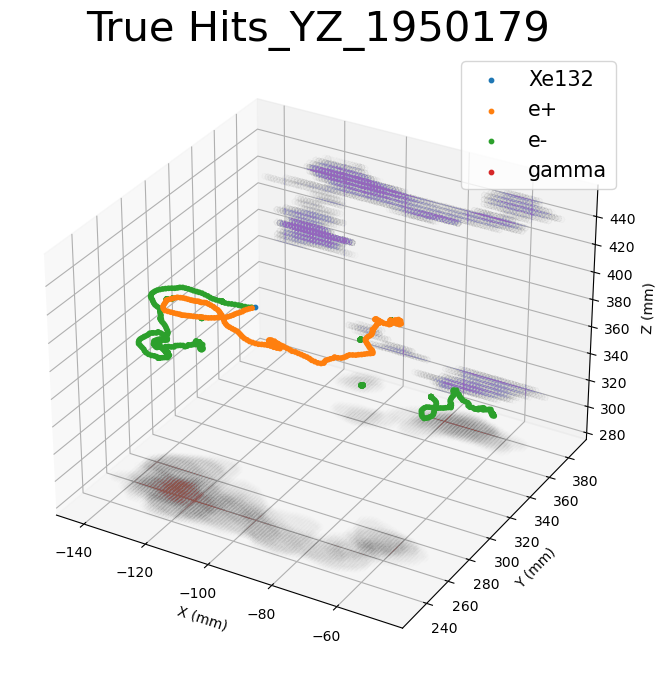

Track knowledge


,event,true_tracks,reco_tracks,reco-true
900,3900358,4,3,-1


Event: 1950290
Unique particles: ['Tl208' 'e-' 'anti_nu_e' 'Pb208[3197.711]' 'gamma' 'Pb208[2614.522]'
 'Xe129' 'e+' 'Pb208']


/tmp/ipykernel_25758/1644647825.py:99: RuntimeWarning: invalid value encountered in true_divide
  initial_momentum_xyz = initial_momentum_xyz / np.linalg.norm(initial_momentum_xyz)
/tmp/ipykernel_25758/1644647825.py:100: RuntimeWarning: invalid value encountered in true_divide
  final_momentum_xyz = final_momentum_xyz / np.linalg.norm(final_momentum_xyz)


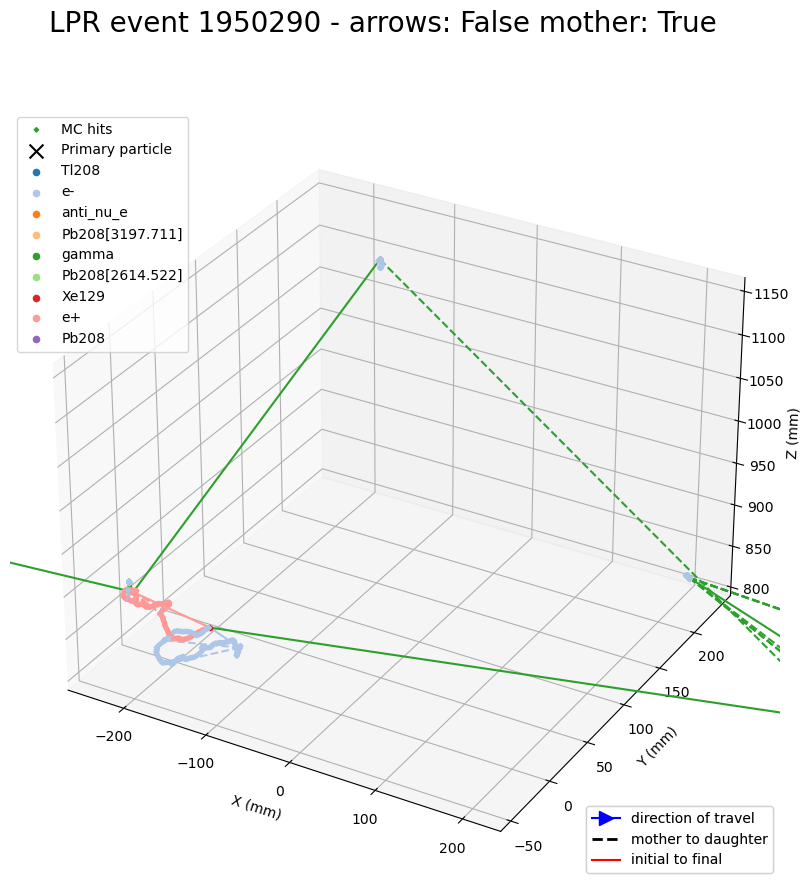

/tmp/ipykernel_25758/2268694555.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  true['particle_name'] = true['particle_id'].apply(return_id)


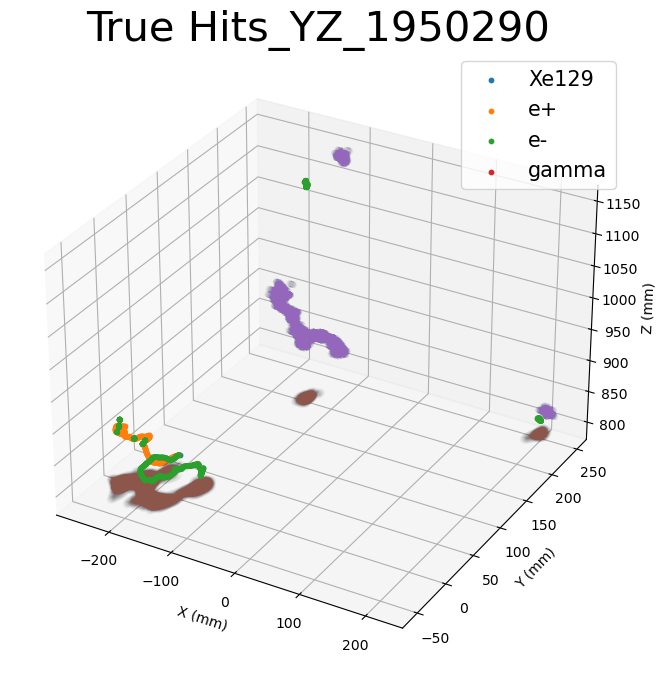

Track knowledge


,event,true_tracks,reco_tracks,reco-true
901,3900580,3,3,0


Event: 1950324
Unique particles: ['Tl208' 'e-' 'anti_nu_e' 'Pb208[3197.711]' 'gamma' 'Pb208[2614.522]'
 'Xe129' 'e+' 'Pb208']


/tmp/ipykernel_25758/1644647825.py:99: RuntimeWarning: invalid value encountered in true_divide
  initial_momentum_xyz = initial_momentum_xyz / np.linalg.norm(initial_momentum_xyz)
/tmp/ipykernel_25758/1644647825.py:100: RuntimeWarning: invalid value encountered in true_divide
  final_momentum_xyz = final_momentum_xyz / np.linalg.norm(final_momentum_xyz)


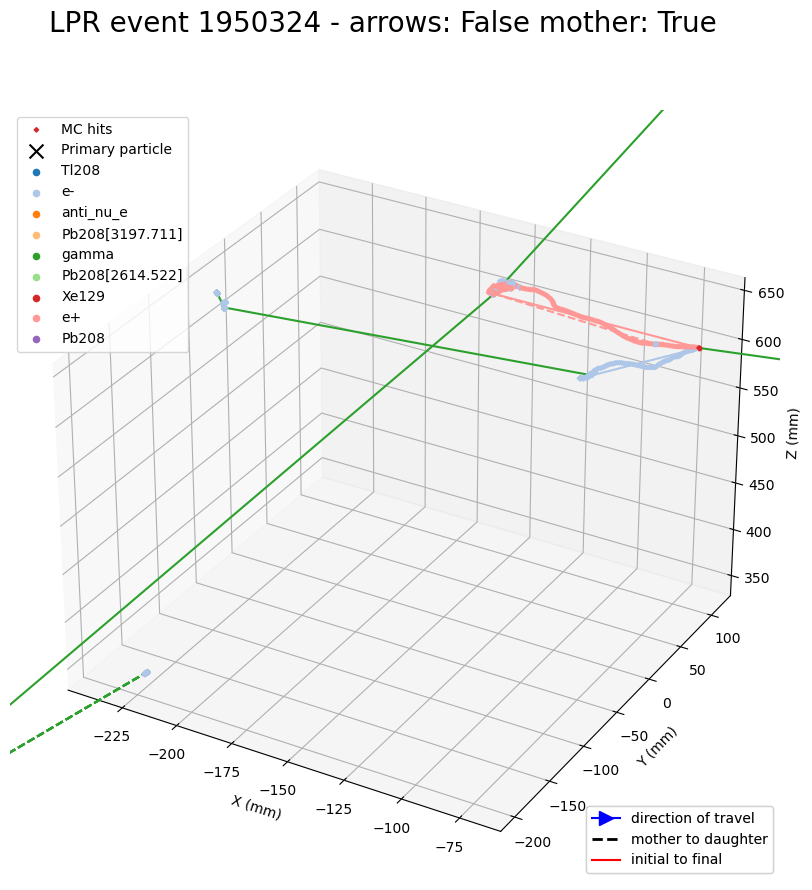

/tmp/ipykernel_25758/2268694555.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  true['particle_name'] = true['particle_id'].apply(return_id)


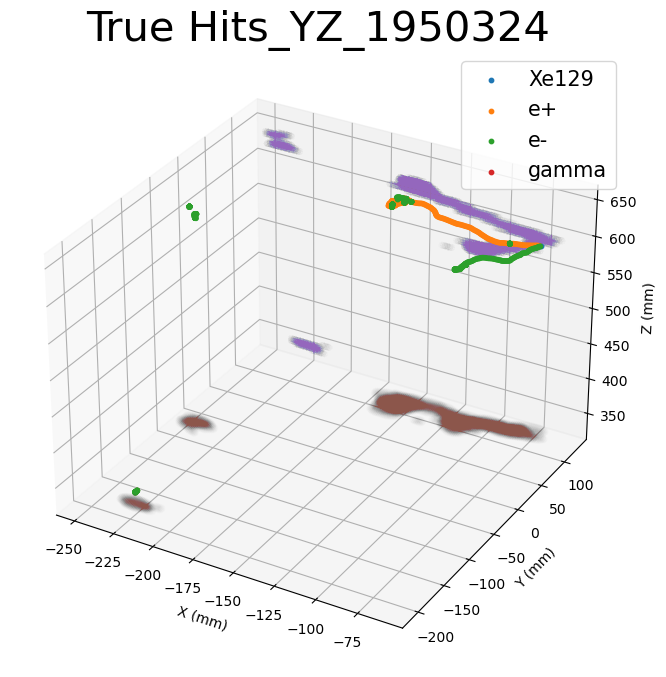

Track knowledge


,event,true_tracks,reco_tracks,reco-true
902,3900648,3,3,0


Event: 1950325
Unique particles: ['Tl208' 'e-' 'anti_nu_e' 'Pb208[3197.711]' 'gamma' 'Pb208[2614.522]'
 'Xe131' 'e+' 'Pb208']


/tmp/ipykernel_25758/1644647825.py:99: RuntimeWarning: invalid value encountered in true_divide
  initial_momentum_xyz = initial_momentum_xyz / np.linalg.norm(initial_momentum_xyz)
/tmp/ipykernel_25758/1644647825.py:100: RuntimeWarning: invalid value encountered in true_divide
  final_momentum_xyz = final_momentum_xyz / np.linalg.norm(final_momentum_xyz)


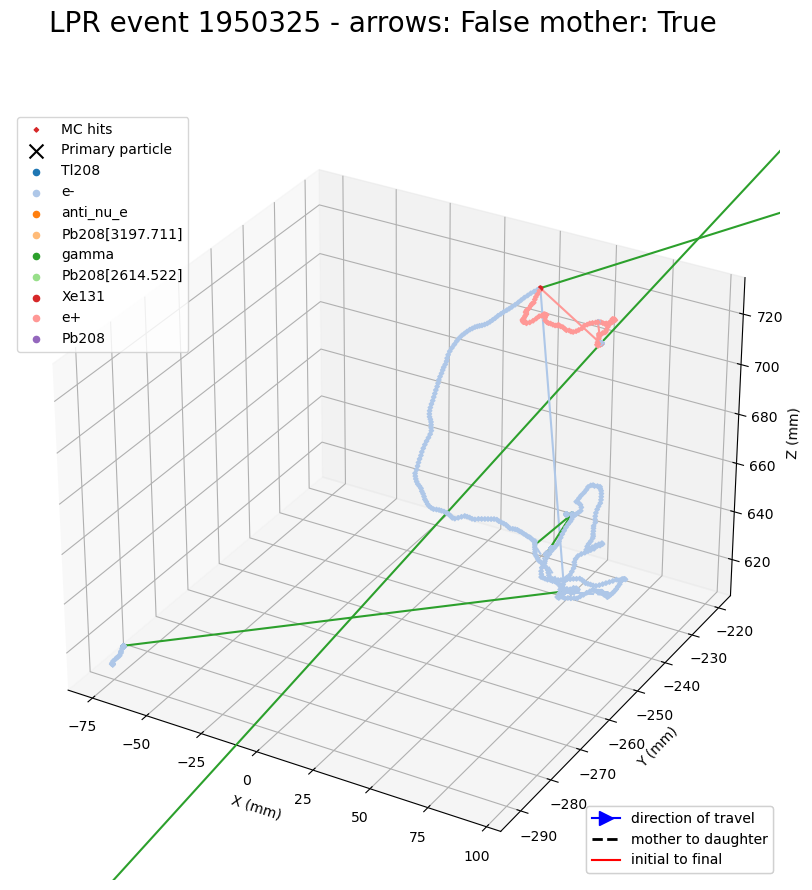

/tmp/ipykernel_25758/2268694555.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  true['particle_name'] = true['particle_id'].apply(return_id)


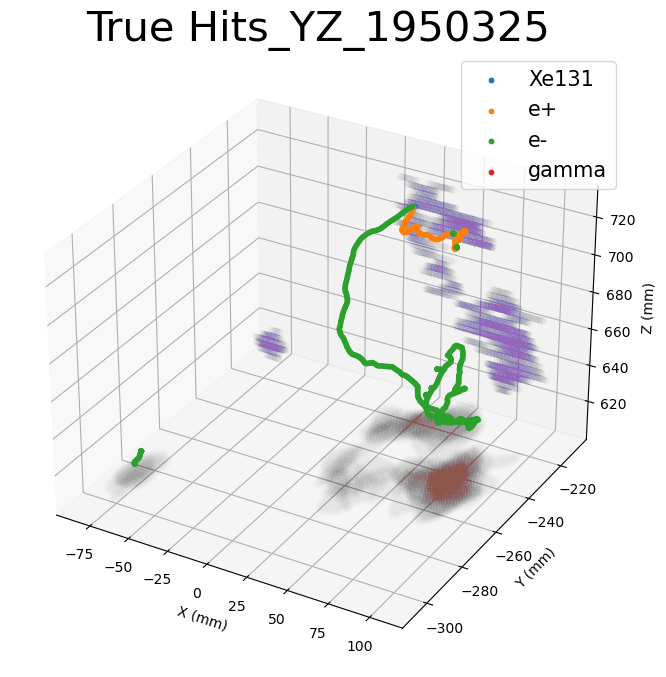

Track knowledge


,event,true_tracks,reco_tracks,reco-true
903,3900650,2,2,0


Event: 2010057
Unique particles: ['Tl208' 'e-' 'anti_nu_e' 'Pb208[3197.711]' 'gamma' 'Pb208[2614.522]'
 'Xe132' 'e+' 'Pb208']


/tmp/ipykernel_25758/1644647825.py:99: RuntimeWarning: invalid value encountered in true_divide
  initial_momentum_xyz = initial_momentum_xyz / np.linalg.norm(initial_momentum_xyz)
/tmp/ipykernel_25758/1644647825.py:100: RuntimeWarning: invalid value encountered in true_divide
  final_momentum_xyz = final_momentum_xyz / np.linalg.norm(final_momentum_xyz)


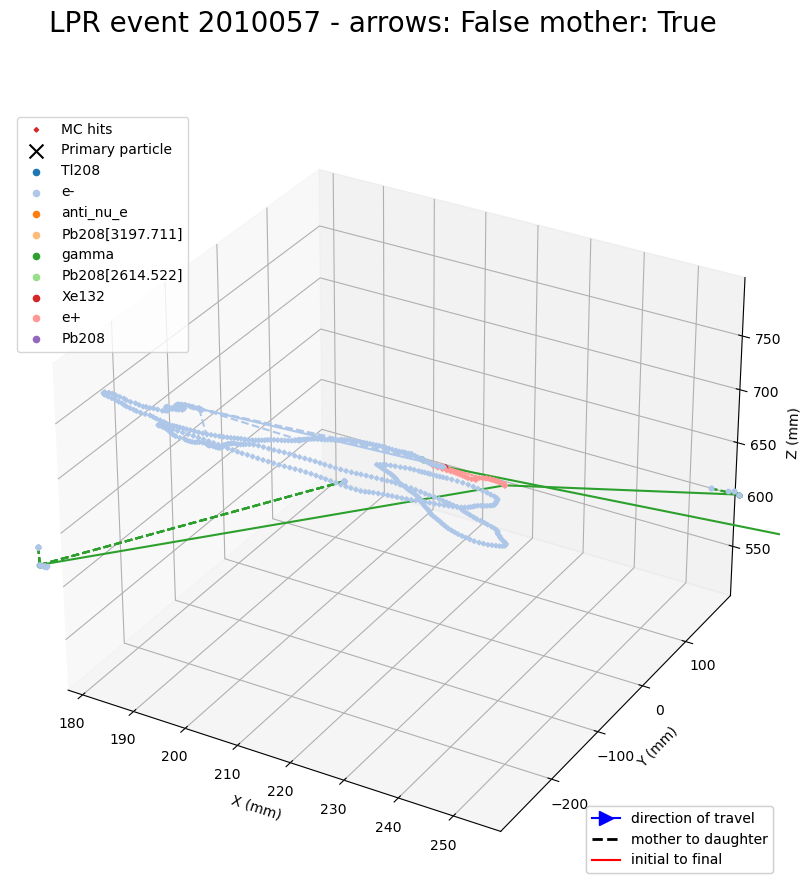

/tmp/ipykernel_25758/2268694555.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  true['particle_name'] = true['particle_id'].apply(return_id)


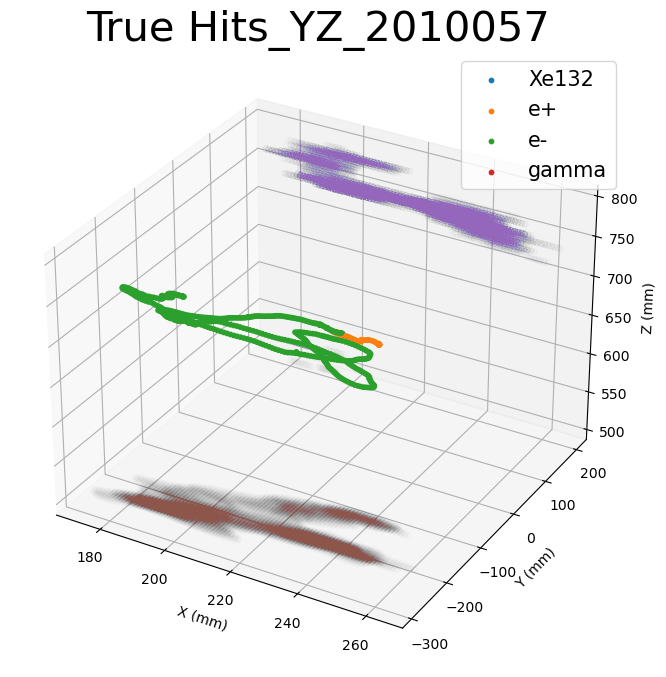

Track knowledge


,event,true_tracks,reco_tracks,reco-true
928,4020114,2,2,0


Event: 2010081
Unique particles: ['Tl208' 'e-' 'anti_nu_e' 'Pb208[3197.711]' 'gamma' 'Pb208[2614.522]'
 'Xe131' 'e+' 'Pb208']


/tmp/ipykernel_25758/1644647825.py:99: RuntimeWarning: invalid value encountered in true_divide
  initial_momentum_xyz = initial_momentum_xyz / np.linalg.norm(initial_momentum_xyz)
/tmp/ipykernel_25758/1644647825.py:100: RuntimeWarning: invalid value encountered in true_divide
  final_momentum_xyz = final_momentum_xyz / np.linalg.norm(final_momentum_xyz)


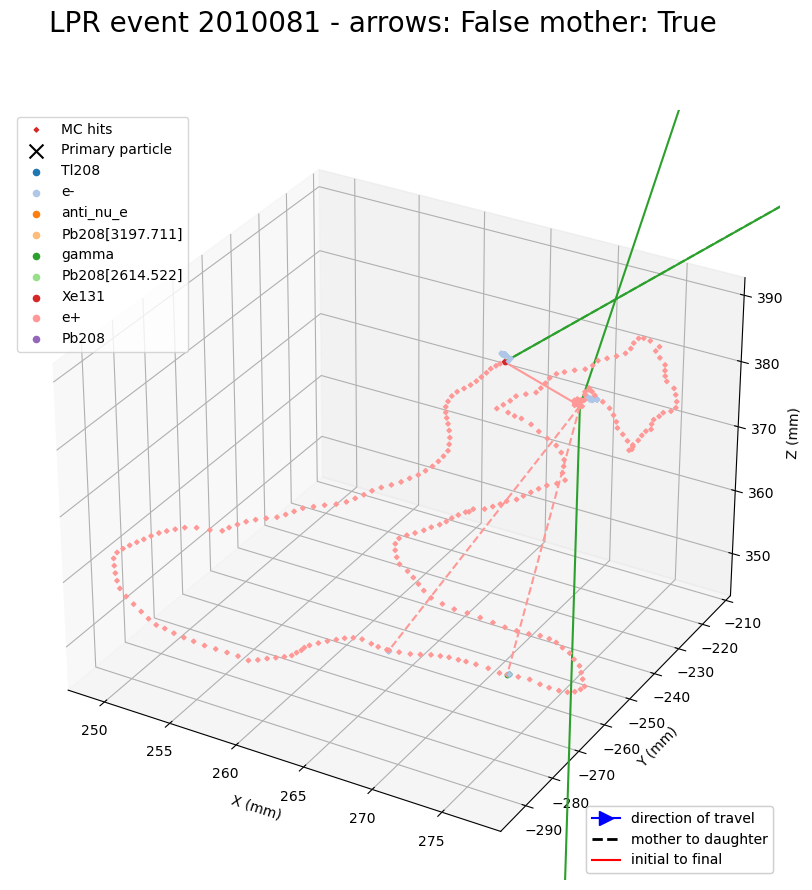

/tmp/ipykernel_25758/2268694555.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  true['particle_name'] = true['particle_id'].apply(return_id)


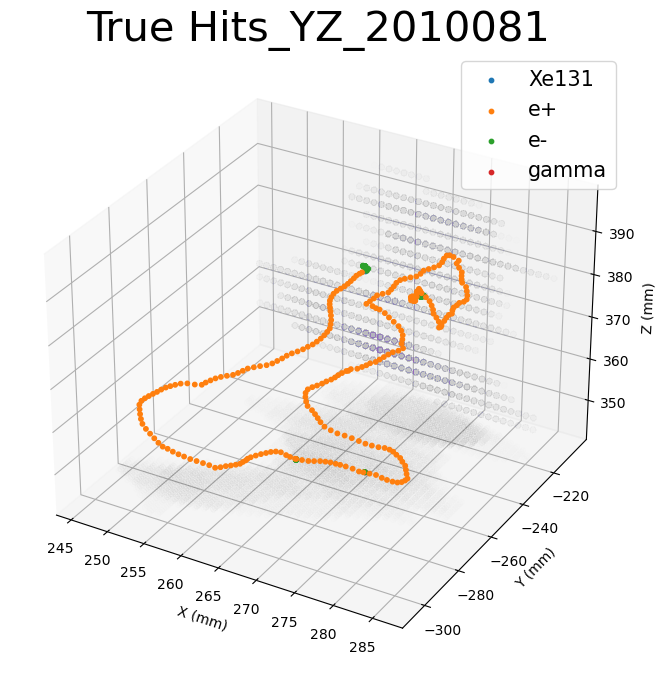

Track knowledge


,event,true_tracks,reco_tracks,reco-true
929,4020162,1,1,0


Event: 2010103
Unique particles: ['Tl208' 'e-' 'anti_nu_e' 'Pb208[3197.711]' 'gamma' 'Pb208[2614.522]'
 'Xe132' 'e+' 'Pb208']


/tmp/ipykernel_25758/1644647825.py:99: RuntimeWarning: invalid value encountered in true_divide
  initial_momentum_xyz = initial_momentum_xyz / np.linalg.norm(initial_momentum_xyz)
/tmp/ipykernel_25758/1644647825.py:100: RuntimeWarning: invalid value encountered in true_divide
  final_momentum_xyz = final_momentum_xyz / np.linalg.norm(final_momentum_xyz)


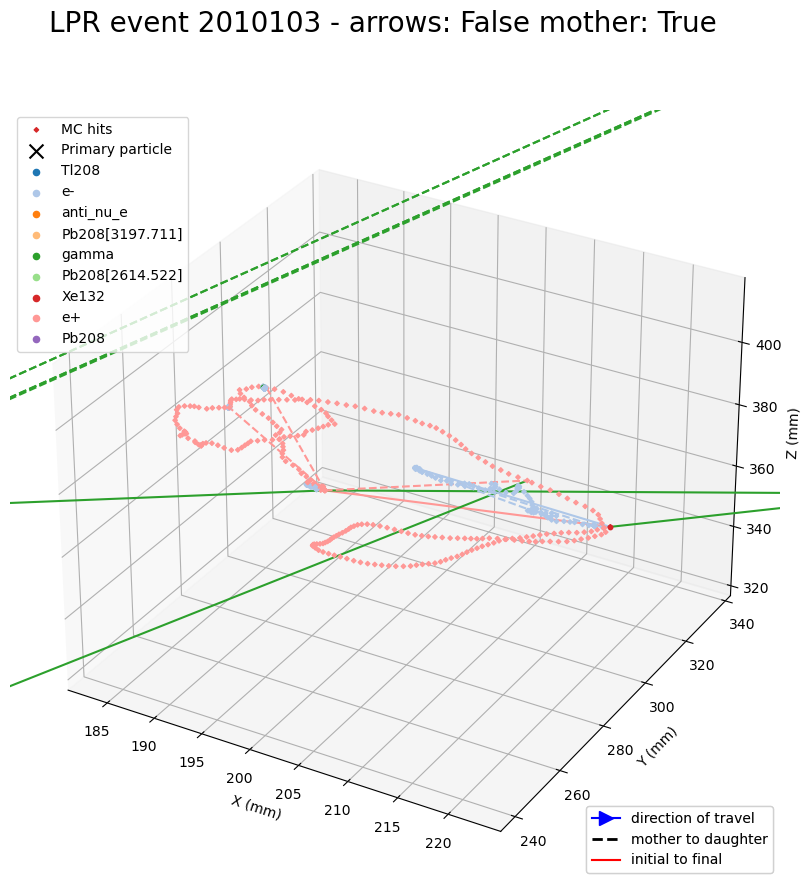

/tmp/ipykernel_25758/2268694555.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  true['particle_name'] = true['particle_id'].apply(return_id)


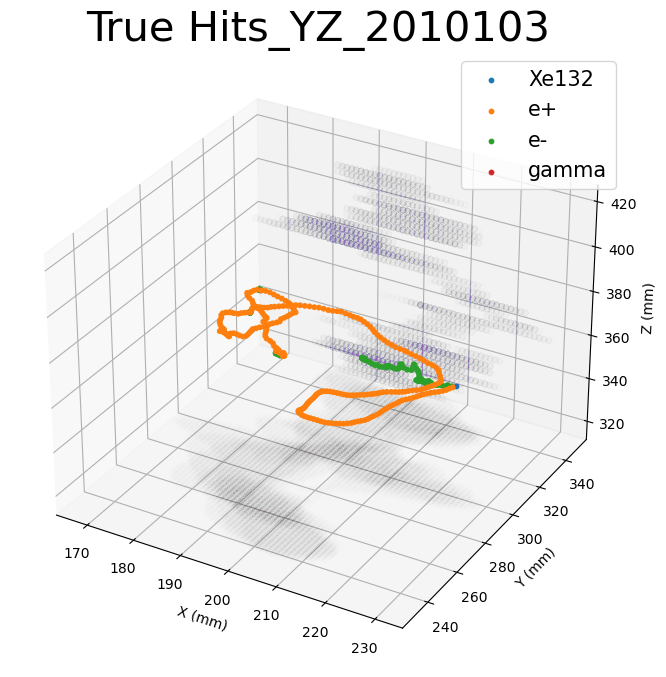

Track knowledge


,event,true_tracks,reco_tracks,reco-true
930,4020206,1,1,0


Event: 2010106
Unique particles: ['Tl208' 'e-' 'anti_nu_e' 'Pb208[3708.451]' 'gamma' 'Pb208[3197.711]'
 'Pb208[2614.522]' 'Xe131' 'e+' 'Pb208']


/tmp/ipykernel_25758/1644647825.py:99: RuntimeWarning: invalid value encountered in true_divide
  initial_momentum_xyz = initial_momentum_xyz / np.linalg.norm(initial_momentum_xyz)
/tmp/ipykernel_25758/1644647825.py:100: RuntimeWarning: invalid value encountered in true_divide
  final_momentum_xyz = final_momentum_xyz / np.linalg.norm(final_momentum_xyz)


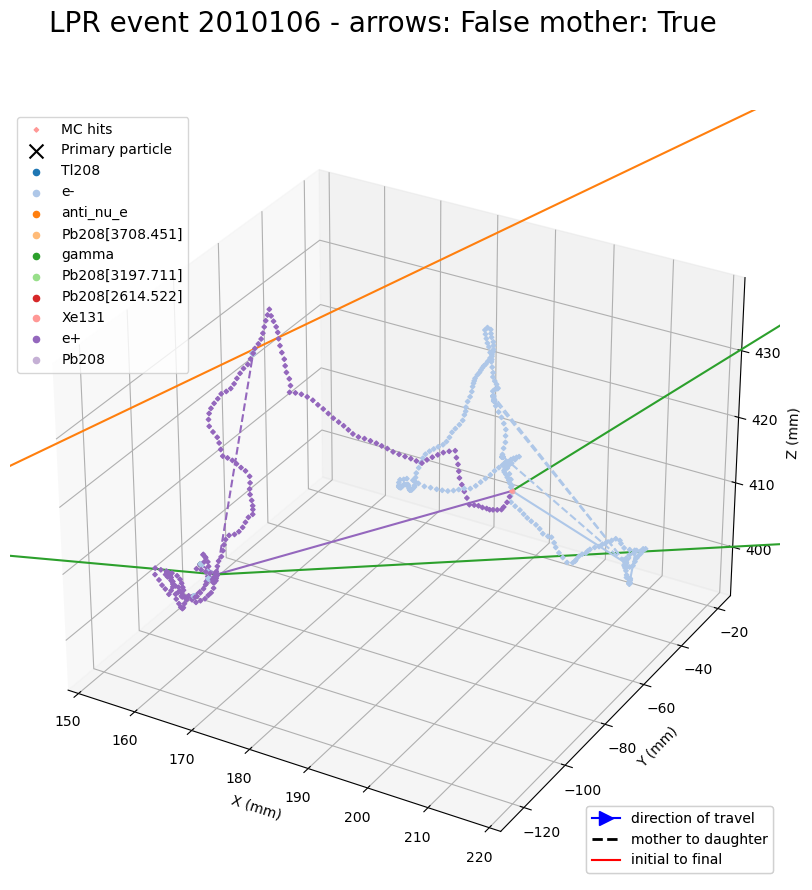

/tmp/ipykernel_25758/2268694555.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  true['particle_name'] = true['particle_id'].apply(return_id)


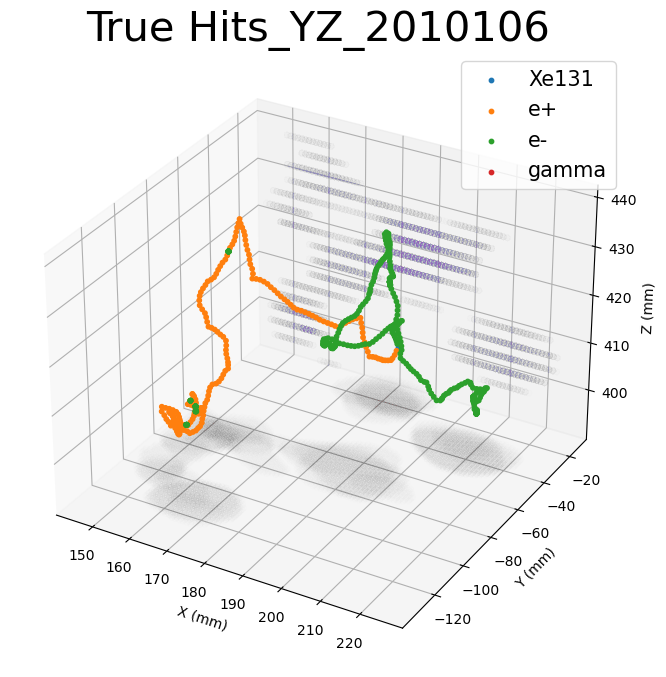

Track knowledge


,event,true_tracks,reco_tracks,reco-true
931,4020212,1,2,1


Event: 2010119
Unique particles: ['Tl208' 'e-' 'gamma' 'anti_nu_e' 'Pb208[3197.711]' 'Pb208[2614.522]'
 'Xe132' 'e+' 'Pb208']


/tmp/ipykernel_25758/1644647825.py:99: RuntimeWarning: invalid value encountered in true_divide
  initial_momentum_xyz = initial_momentum_xyz / np.linalg.norm(initial_momentum_xyz)
/tmp/ipykernel_25758/1644647825.py:100: RuntimeWarning: invalid value encountered in true_divide
  final_momentum_xyz = final_momentum_xyz / np.linalg.norm(final_momentum_xyz)


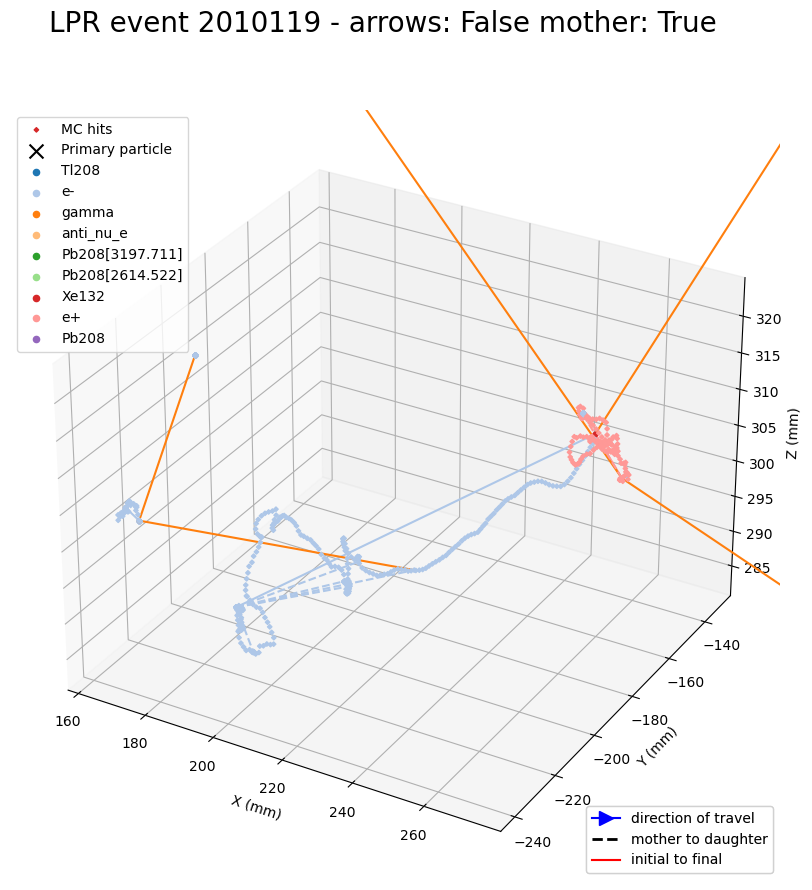

/tmp/ipykernel_25758/2268694555.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  true['particle_name'] = true['particle_id'].apply(return_id)


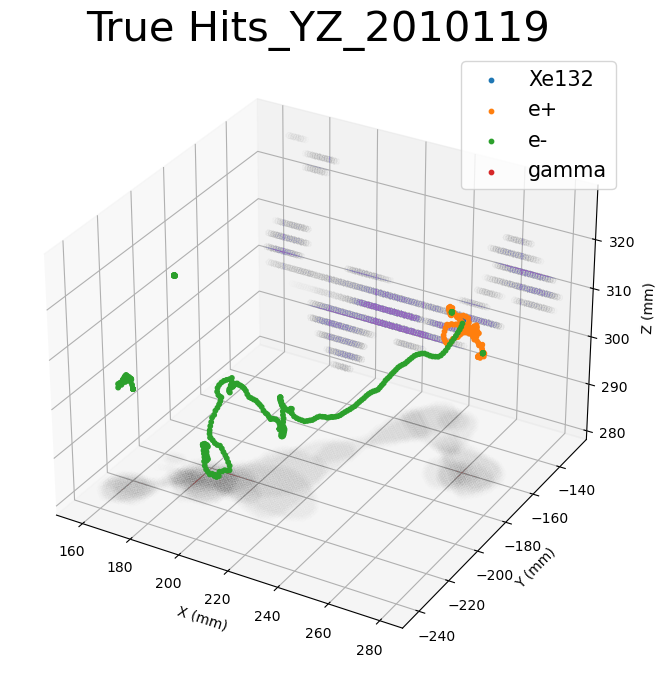

Track knowledge


,event,true_tracks,reco_tracks,reco-true
932,4020238,3,2,-1


Event: 2010165
Unique particles: ['Tl208' 'e-' 'anti_nu_e' 'Pb208[3475.078]' 'gamma' 'Pb208[3197.711]'
 'Pb208[2614.522]' 'Xe131' 'e+' 'Pb208']


/tmp/ipykernel_25758/1644647825.py:99: RuntimeWarning: invalid value encountered in true_divide
  initial_momentum_xyz = initial_momentum_xyz / np.linalg.norm(initial_momentum_xyz)
/tmp/ipykernel_25758/1644647825.py:100: RuntimeWarning: invalid value encountered in true_divide
  final_momentum_xyz = final_momentum_xyz / np.linalg.norm(final_momentum_xyz)


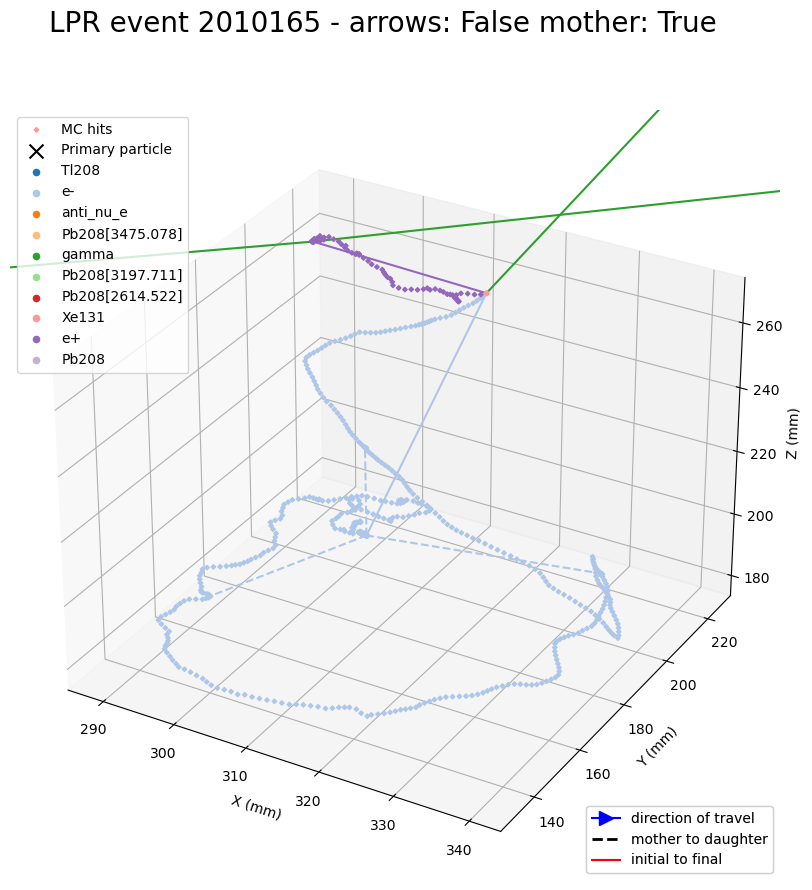

/tmp/ipykernel_25758/2268694555.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  true['particle_name'] = true['particle_id'].apply(return_id)


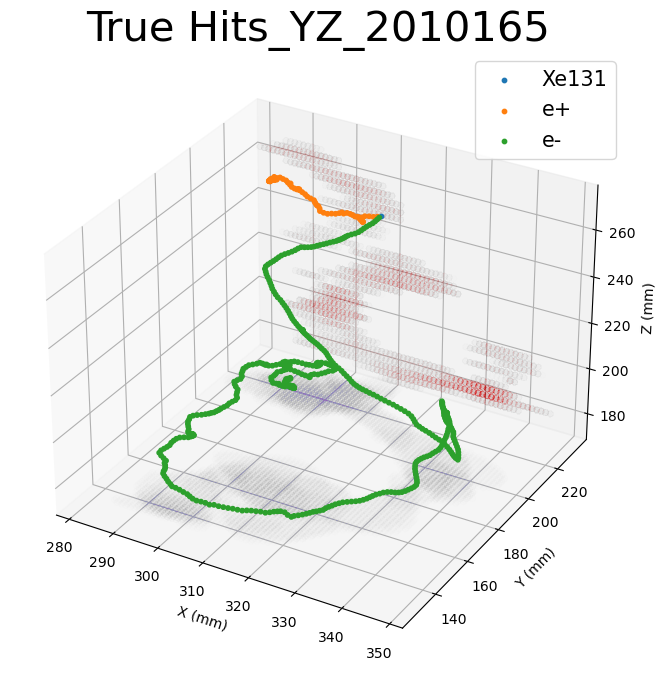

Track knowledge


,event,true_tracks,reco_tracks,reco-true
933,4020330,1,2,1


Event: 2010245
Unique particles: ['Tl208' 'e-' 'anti_nu_e' 'Pb208[3475.078]' 'Pb208[3197.711]' 'gamma'
 'Pb208[2614.522]' 'Xe129' 'e+' 'Pb208']


/tmp/ipykernel_25758/1644647825.py:99: RuntimeWarning: invalid value encountered in true_divide
  initial_momentum_xyz = initial_momentum_xyz / np.linalg.norm(initial_momentum_xyz)
/tmp/ipykernel_25758/1644647825.py:100: RuntimeWarning: invalid value encountered in true_divide
  final_momentum_xyz = final_momentum_xyz / np.linalg.norm(final_momentum_xyz)


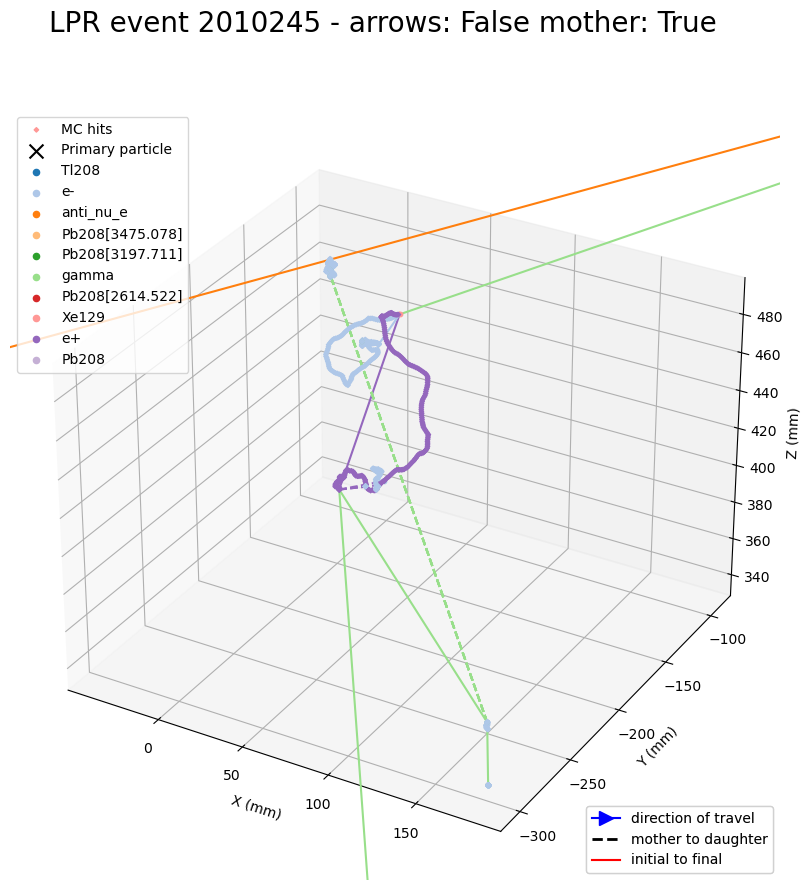

/tmp/ipykernel_25758/2268694555.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  true['particle_name'] = true['particle_id'].apply(return_id)


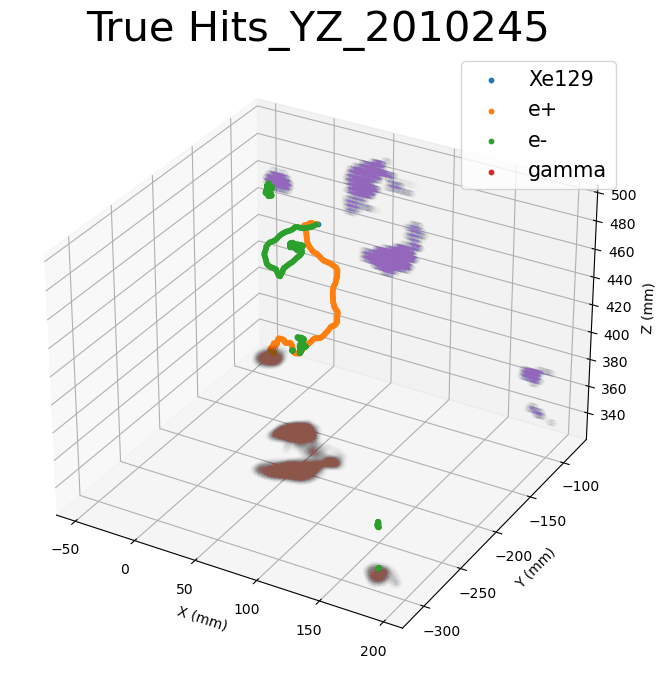

Track knowledge


,event,true_tracks,reco_tracks,reco-true
934,4020490,4,5,1


Event: 2170002
Unique particles: ['Tl208' 'e-' 'anti_nu_e' 'Pb208[3919.966]' 'gamma' 'Pb208[3708.451]'
 'Pb208[3197.711]' 'Pb208[2614.522]' 'Xe131' 'e+' 'Pb208']


/tmp/ipykernel_25758/1644647825.py:99: RuntimeWarning: invalid value encountered in true_divide
  initial_momentum_xyz = initial_momentum_xyz / np.linalg.norm(initial_momentum_xyz)
/tmp/ipykernel_25758/1644647825.py:100: RuntimeWarning: invalid value encountered in true_divide
  final_momentum_xyz = final_momentum_xyz / np.linalg.norm(final_momentum_xyz)


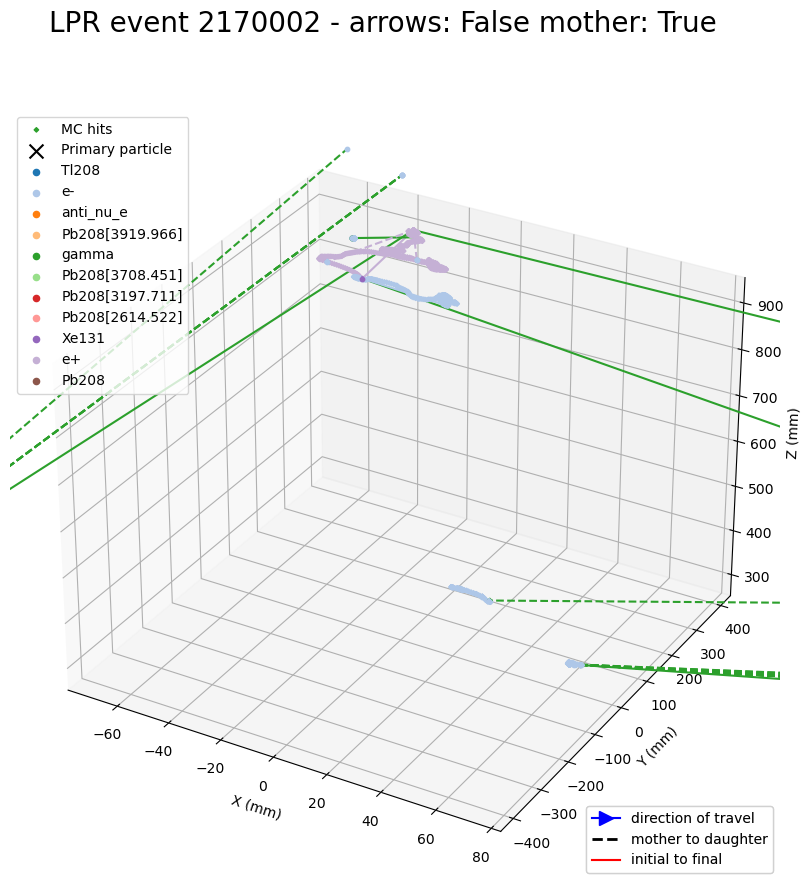

/tmp/ipykernel_25758/2268694555.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  true['particle_name'] = true['particle_id'].apply(return_id)


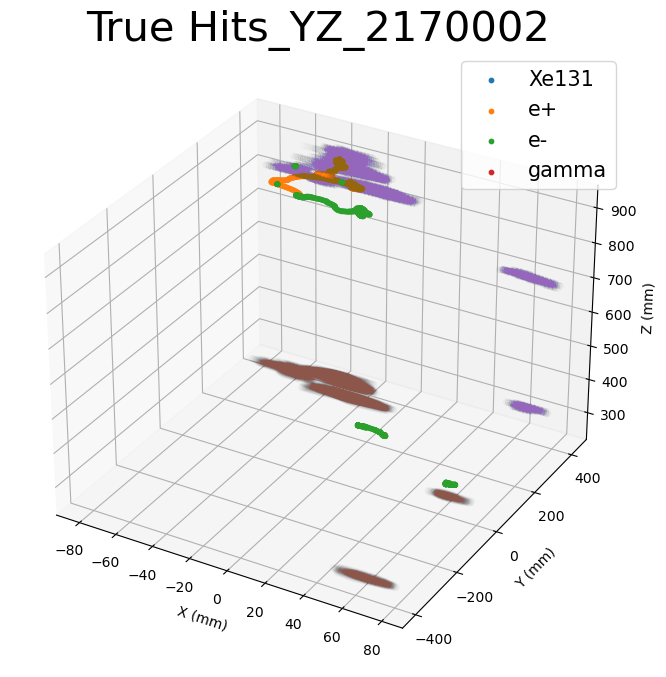

Track knowledge


,event,true_tracks,reco_tracks,reco-true
995,4340004,4,4,0


Event: 2170141
Unique particles: ['Tl208' 'e-' 'anti_nu_e' 'Pb208[3197.711]' 'gamma' 'Pb208[2614.522]'
 'Xe131' 'e+' 'Pb208']


/tmp/ipykernel_25758/1644647825.py:99: RuntimeWarning: invalid value encountered in true_divide
  initial_momentum_xyz = initial_momentum_xyz / np.linalg.norm(initial_momentum_xyz)
/tmp/ipykernel_25758/1644647825.py:100: RuntimeWarning: invalid value encountered in true_divide
  final_momentum_xyz = final_momentum_xyz / np.linalg.norm(final_momentum_xyz)


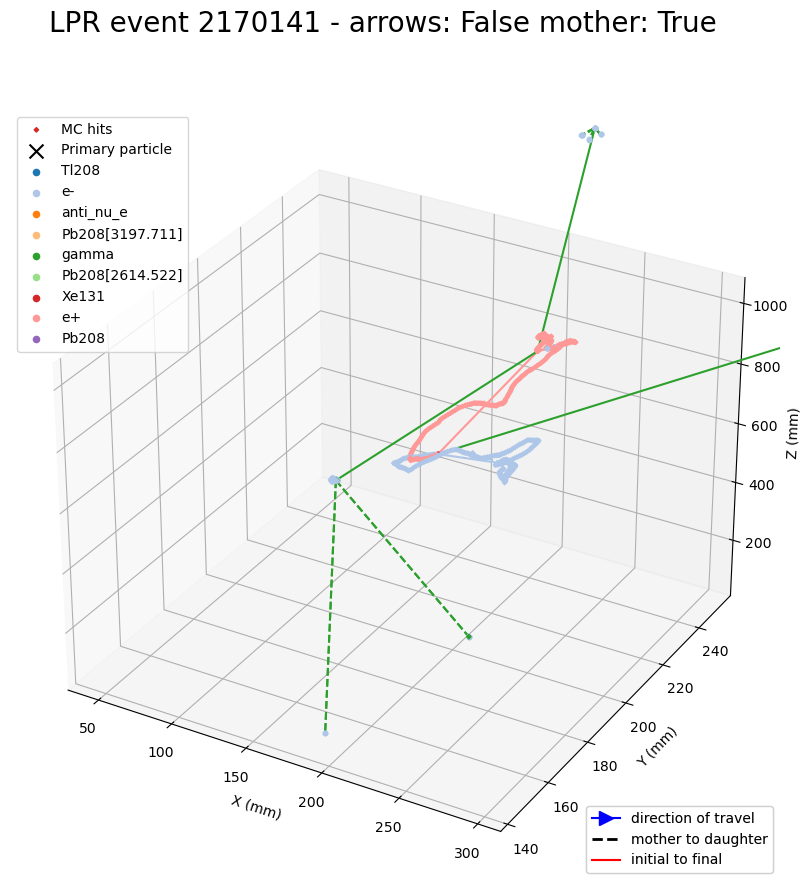

/tmp/ipykernel_25758/2268694555.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  true['particle_name'] = true['particle_id'].apply(return_id)


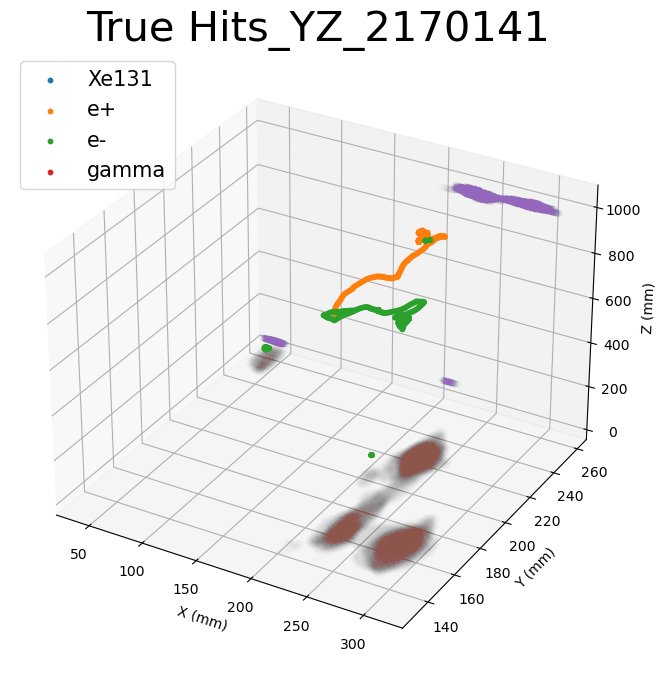

Track knowledge


,event,true_tracks,reco_tracks,reco-true
996,4340282,3,3,0


Event: 2170221
Unique particles: ['Tl208' 'e-' 'anti_nu_e' 'Pb208[3197.711]' 'gamma' 'Pb208[2614.522]'
 'Xe129' 'e+' 'Pb208']


/tmp/ipykernel_25758/1644647825.py:99: RuntimeWarning: invalid value encountered in true_divide
  initial_momentum_xyz = initial_momentum_xyz / np.linalg.norm(initial_momentum_xyz)
/tmp/ipykernel_25758/1644647825.py:100: RuntimeWarning: invalid value encountered in true_divide
  final_momentum_xyz = final_momentum_xyz / np.linalg.norm(final_momentum_xyz)


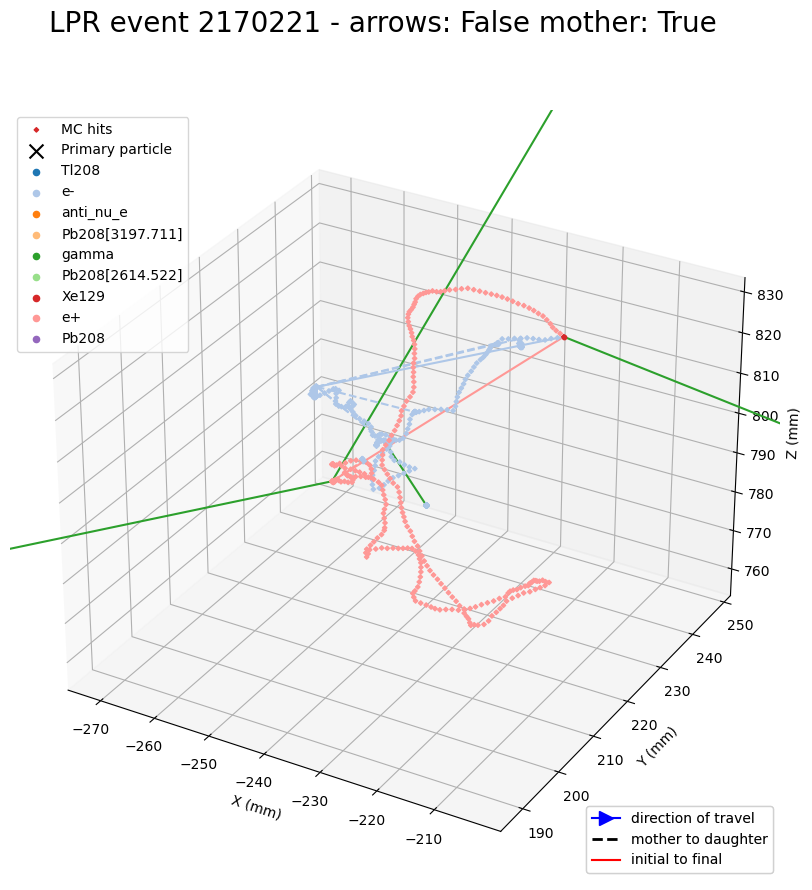

/tmp/ipykernel_25758/2268694555.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  true['particle_name'] = true['particle_id'].apply(return_id)


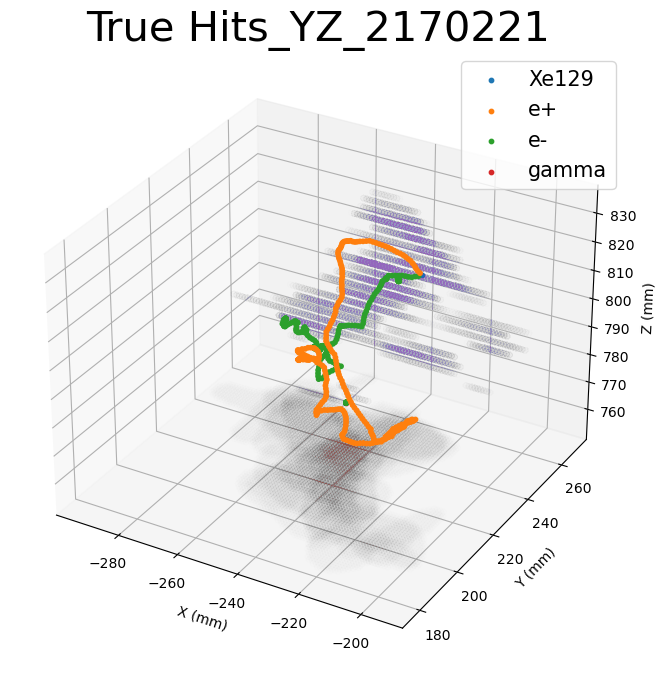

Track knowledge


,event,true_tracks,reco_tracks,reco-true
997,4340442,2,2,0


Event: 2170231
Unique particles: ['Tl208' 'e-' 'anti_nu_e' 'Pb208[3708.451]' 'gamma' 'Pb208[3197.711]'
 'Pb208[2614.522]' 'Xe131' 'e+' 'Pb208']


/tmp/ipykernel_25758/1644647825.py:99: RuntimeWarning: invalid value encountered in true_divide
  initial_momentum_xyz = initial_momentum_xyz / np.linalg.norm(initial_momentum_xyz)
/tmp/ipykernel_25758/1644647825.py:100: RuntimeWarning: invalid value encountered in true_divide
  final_momentum_xyz = final_momentum_xyz / np.linalg.norm(final_momentum_xyz)


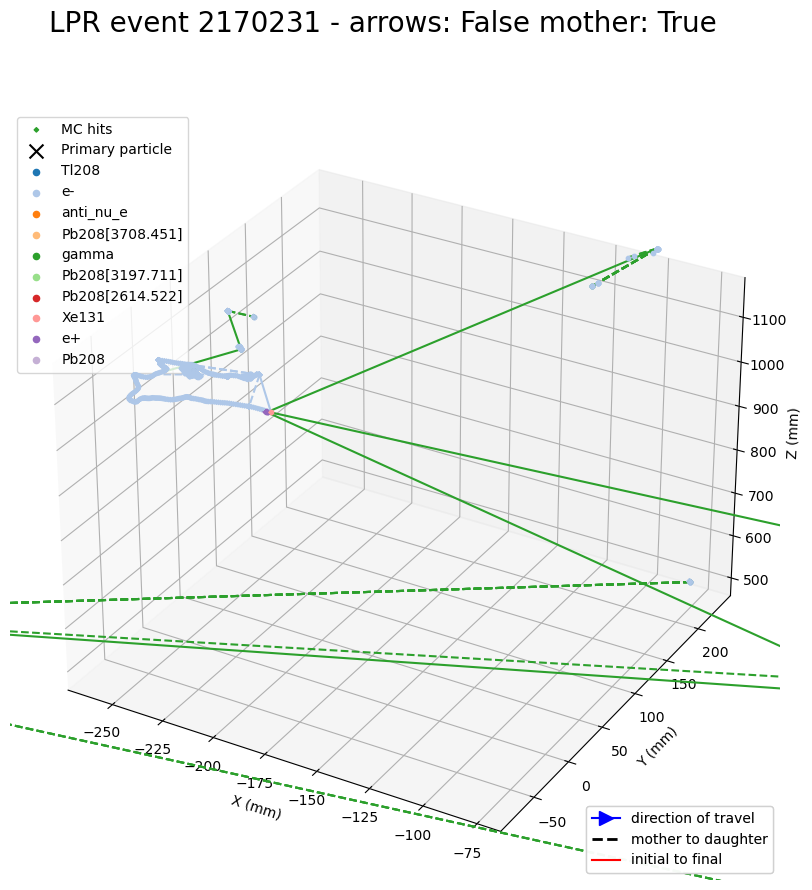

/tmp/ipykernel_25758/2268694555.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  true['particle_name'] = true['particle_id'].apply(return_id)


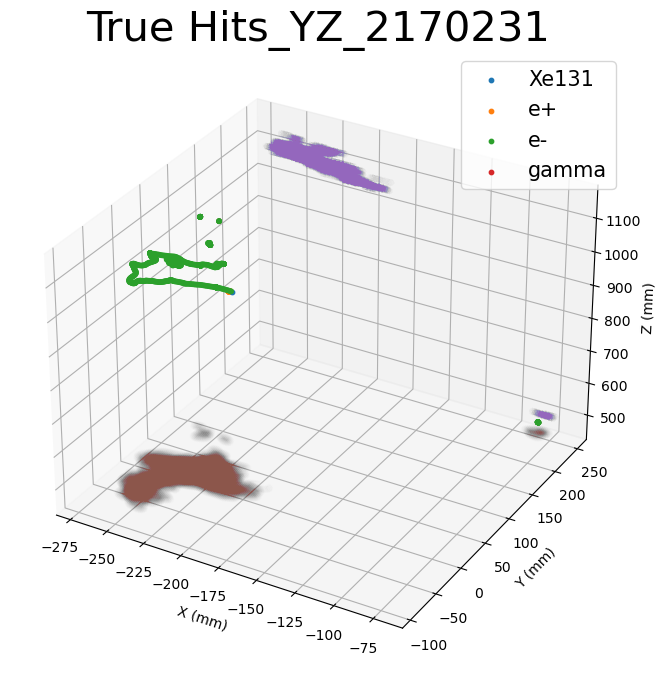

Track knowledge


,event,true_tracks,reco_tracks,reco-true
998,4340462,4,3,-1


Event: 1740216
Unique particles: ['Tl208' 'e-' 'anti_nu_e' 'Pb208[3475.078]' 'gamma' 'Pb208[2614.522]'
 'Xe132' 'e+' 'Pb208']


/tmp/ipykernel_25758/1644647825.py:99: RuntimeWarning: invalid value encountered in true_divide
  initial_momentum_xyz = initial_momentum_xyz / np.linalg.norm(initial_momentum_xyz)
/tmp/ipykernel_25758/1644647825.py:100: RuntimeWarning: invalid value encountered in true_divide
  final_momentum_xyz = final_momentum_xyz / np.linalg.norm(final_momentum_xyz)


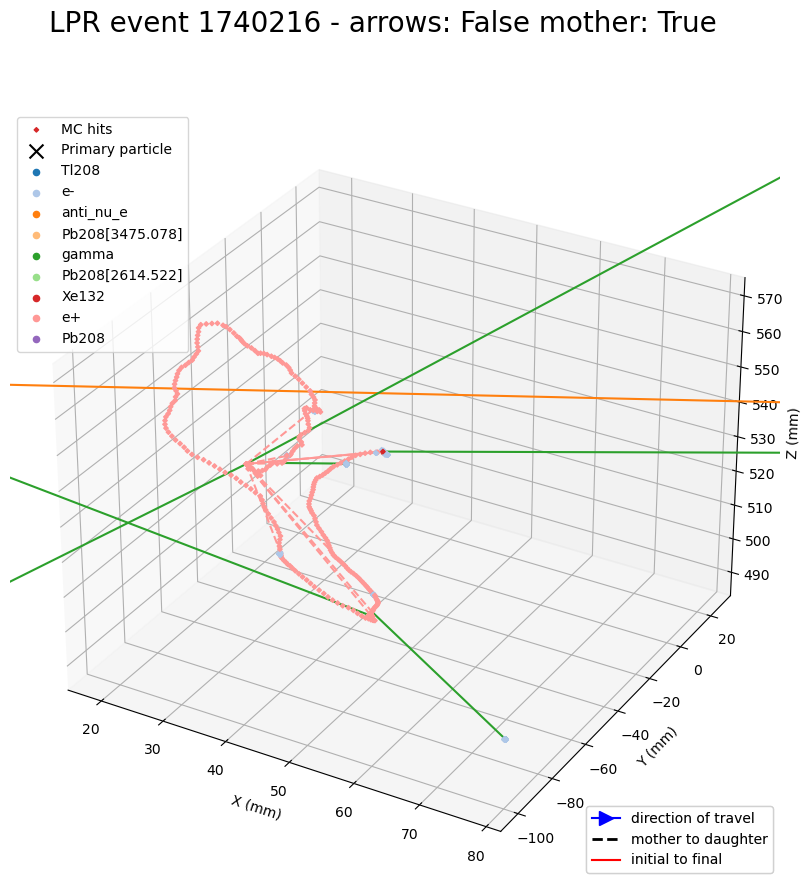

/tmp/ipykernel_25758/2268694555.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  true['particle_name'] = true['particle_id'].apply(return_id)


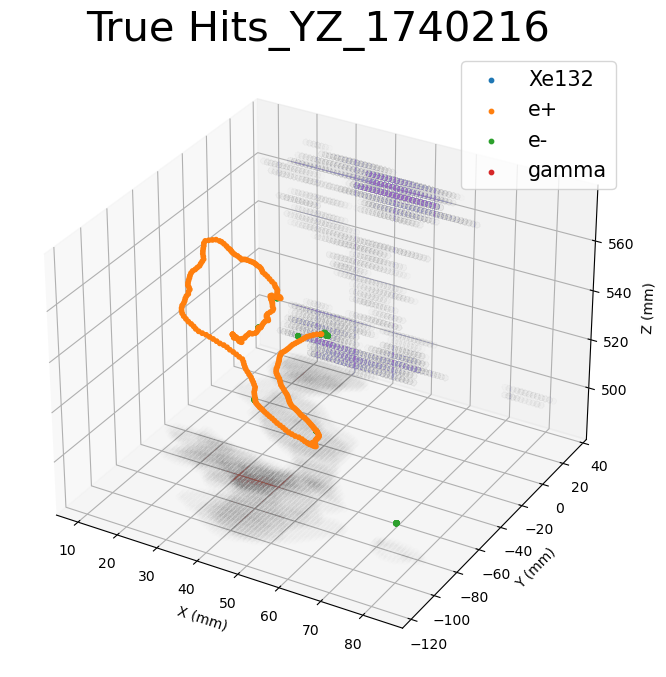

Track knowledge


,event,true_tracks,reco_tracks,reco-true
810,3480432,3,2,-1


Event: 1740221
Unique particles: ['Tl208' 'e-' 'anti_nu_e' 'Pb208[3708.451]' 'gamma' 'Pb208[3197.711]'
 'Pb208[2614.522]' 'Xe129' 'e+' 'Pb208']


/tmp/ipykernel_25758/1644647825.py:99: RuntimeWarning: invalid value encountered in true_divide
  initial_momentum_xyz = initial_momentum_xyz / np.linalg.norm(initial_momentum_xyz)
/tmp/ipykernel_25758/1644647825.py:100: RuntimeWarning: invalid value encountered in true_divide
  final_momentum_xyz = final_momentum_xyz / np.linalg.norm(final_momentum_xyz)


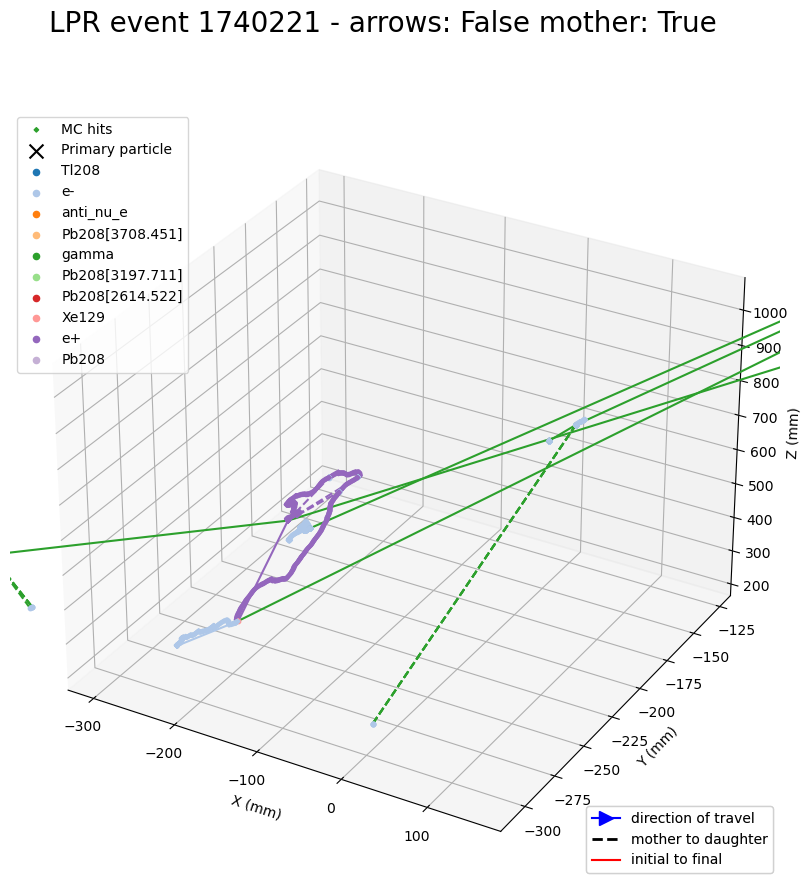

/tmp/ipykernel_25758/2268694555.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  true['particle_name'] = true['particle_id'].apply(return_id)


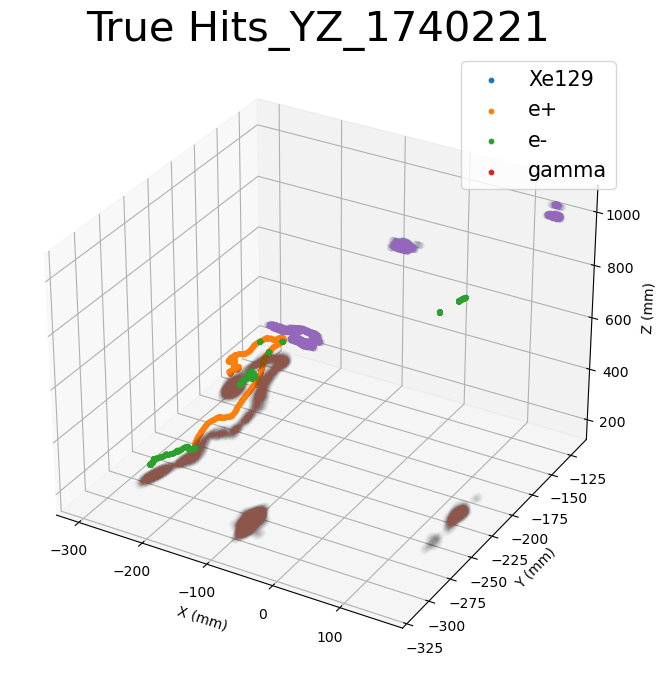

Track knowledge


,event,true_tracks,reco_tracks,reco-true
811,3480442,4,4,0


Event: 1740273
Unique particles: ['Tl208' 'e-' 'anti_nu_e' 'Pb208[3708.451]' 'gamma' 'Pb208[3197.711]'
 'Pb208[2614.522]' 'Xe129' 'e+' 'Pb208']


/tmp/ipykernel_25758/1644647825.py:99: RuntimeWarning: invalid value encountered in true_divide
  initial_momentum_xyz = initial_momentum_xyz / np.linalg.norm(initial_momentum_xyz)
/tmp/ipykernel_25758/1644647825.py:100: RuntimeWarning: invalid value encountered in true_divide
  final_momentum_xyz = final_momentum_xyz / np.linalg.norm(final_momentum_xyz)


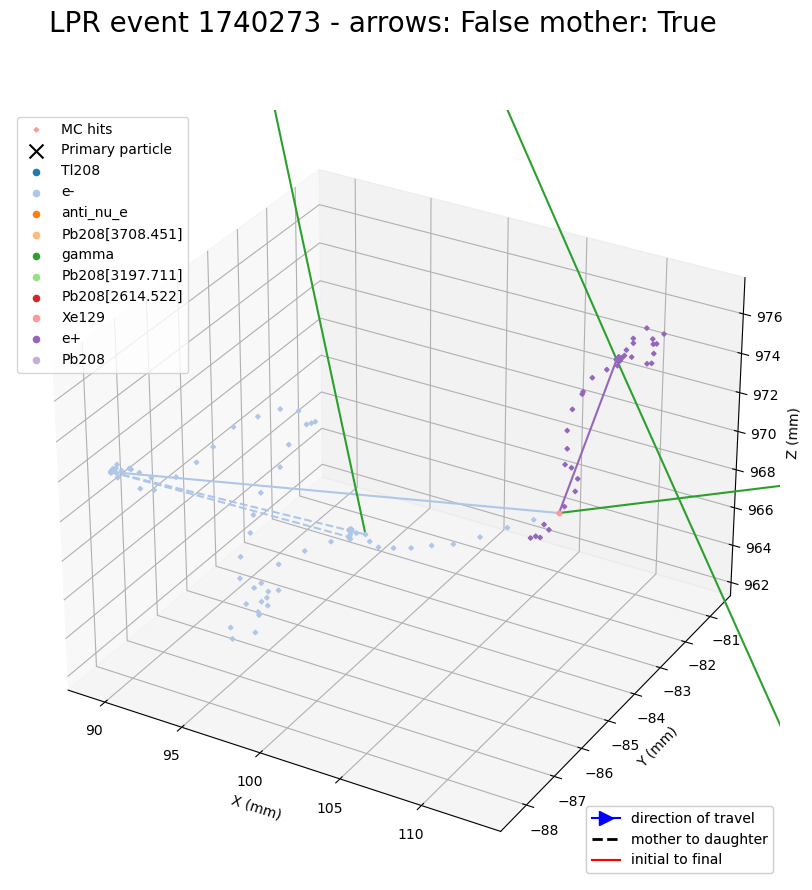

/tmp/ipykernel_25758/2268694555.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  true['particle_name'] = true['particle_id'].apply(return_id)


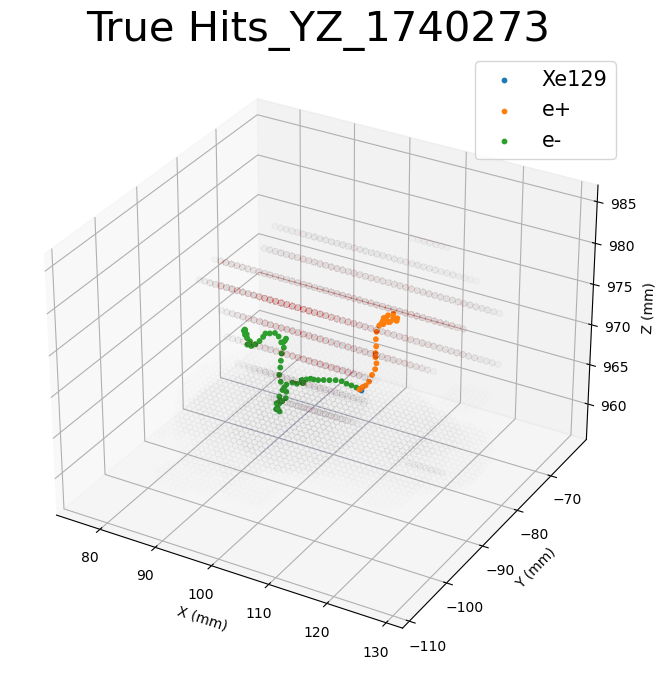

Track knowledge


,event,true_tracks,reco_tracks,reco-true
812,3480546,1,1,0


Event: 1740285
Unique particles: ['Tl208' 'e-' 'anti_nu_e' 'Pb208[3197.711]' 'gamma' 'Pb208[2614.522]'
 'Xe129' 'e+' 'Pb208']


/tmp/ipykernel_25758/1644647825.py:99: RuntimeWarning: invalid value encountered in true_divide
  initial_momentum_xyz = initial_momentum_xyz / np.linalg.norm(initial_momentum_xyz)
/tmp/ipykernel_25758/1644647825.py:100: RuntimeWarning: invalid value encountered in true_divide
  final_momentum_xyz = final_momentum_xyz / np.linalg.norm(final_momentum_xyz)


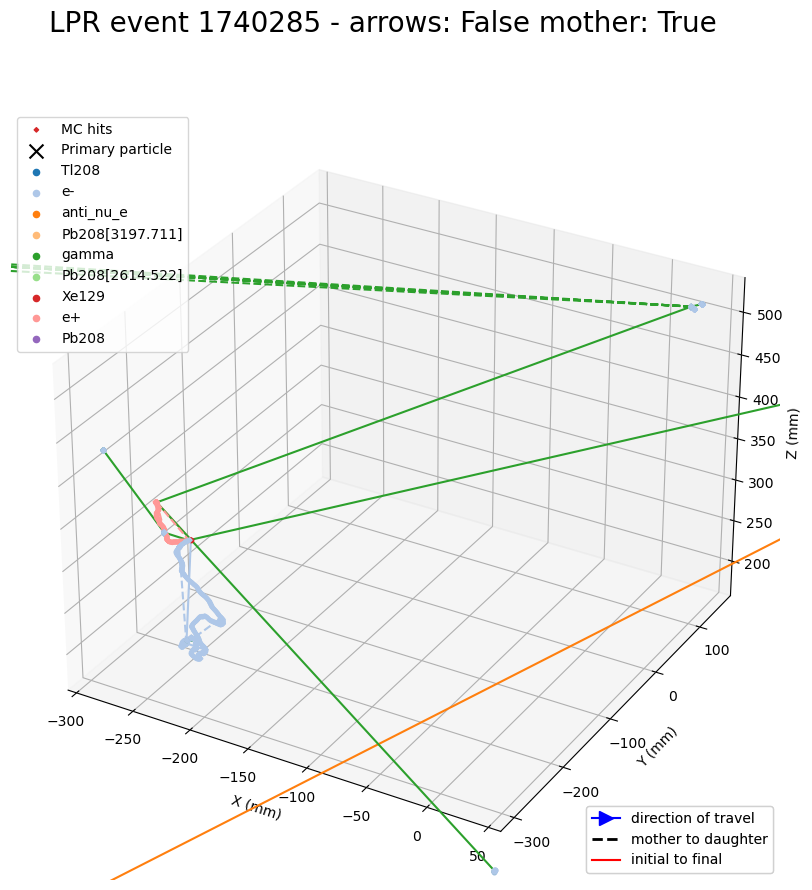

/tmp/ipykernel_25758/2268694555.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  true['particle_name'] = true['particle_id'].apply(return_id)


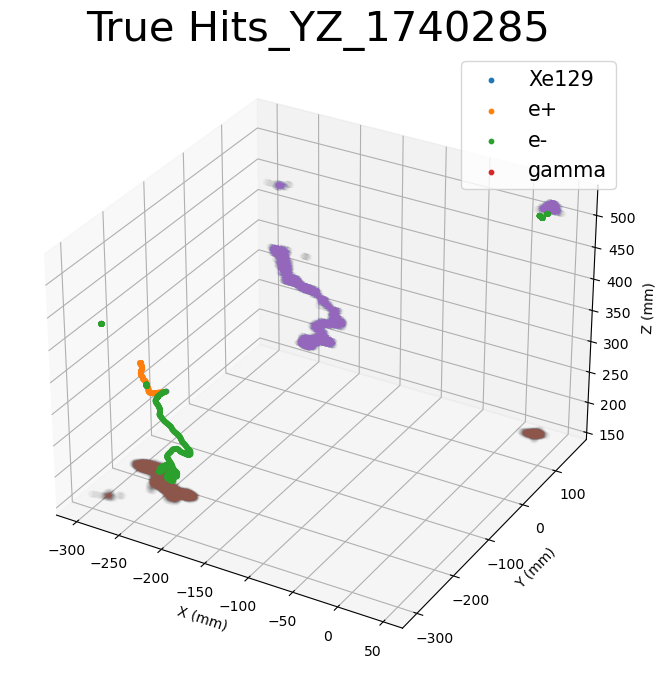

Track knowledge


,event,true_tracks,reco_tracks,reco-true
813,3480570,4,4,0


Event: 260012
Unique particles: ['Tl208' 'e-' 'anti_nu_e' 'Pb208[3475.078]' 'gamma' 'Pb208[2614.522]'
 'Xe132' 'e+' 'Pb208']


/tmp/ipykernel_25758/1644647825.py:99: RuntimeWarning: invalid value encountered in true_divide
  initial_momentum_xyz = initial_momentum_xyz / np.linalg.norm(initial_momentum_xyz)
/tmp/ipykernel_25758/1644647825.py:100: RuntimeWarning: invalid value encountered in true_divide
  final_momentum_xyz = final_momentum_xyz / np.linalg.norm(final_momentum_xyz)


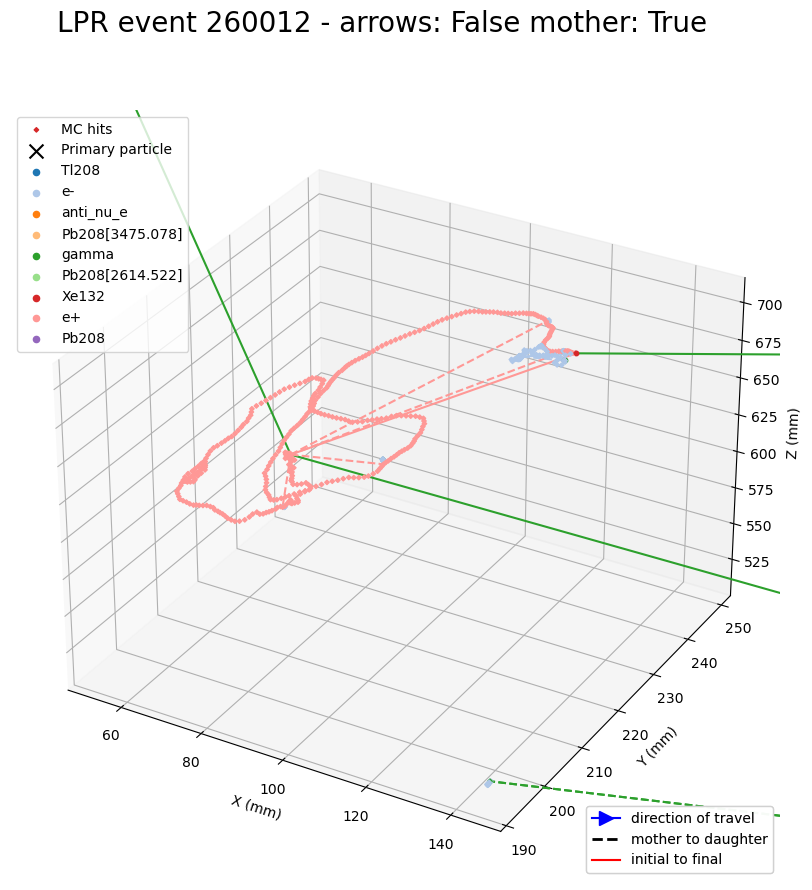

/tmp/ipykernel_25758/2268694555.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  true['particle_name'] = true['particle_id'].apply(return_id)


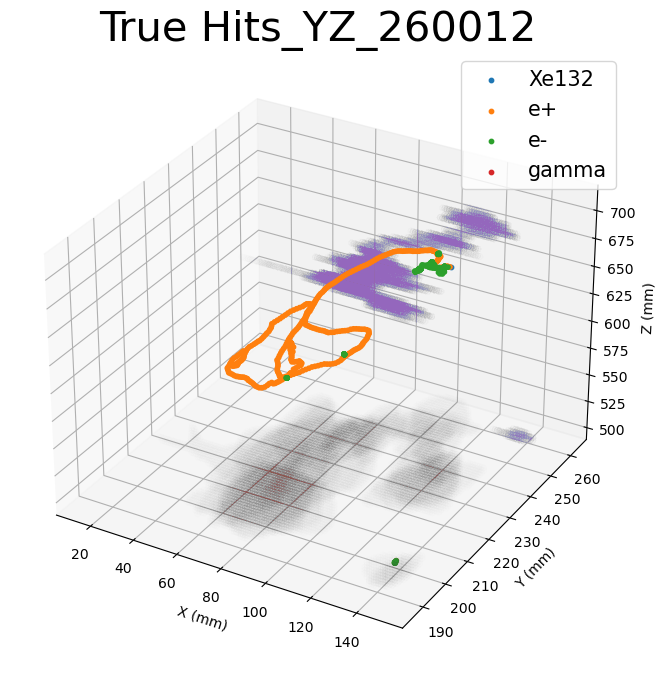

Track knowledge


,event,true_tracks,reco_tracks,reco-true
127,520024,2,2,0


Event: 260107
Unique particles: ['Tl208' 'e-' 'anti_nu_e' 'Pb208[3708.451]' 'gamma' 'Pb208[3197.711]'
 'Pb208[2614.522]' 'Xe132' 'e+' 'Pb208']


/tmp/ipykernel_25758/1644647825.py:99: RuntimeWarning: invalid value encountered in true_divide
  initial_momentum_xyz = initial_momentum_xyz / np.linalg.norm(initial_momentum_xyz)
/tmp/ipykernel_25758/1644647825.py:100: RuntimeWarning: invalid value encountered in true_divide
  final_momentum_xyz = final_momentum_xyz / np.linalg.norm(final_momentum_xyz)


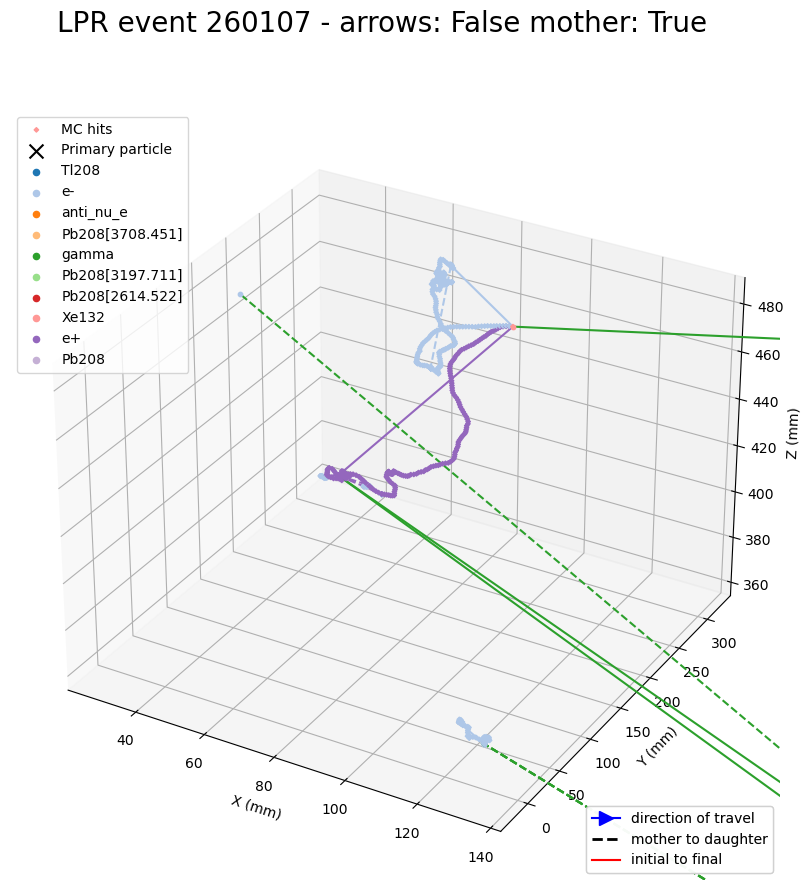

/tmp/ipykernel_25758/2268694555.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  true['particle_name'] = true['particle_id'].apply(return_id)


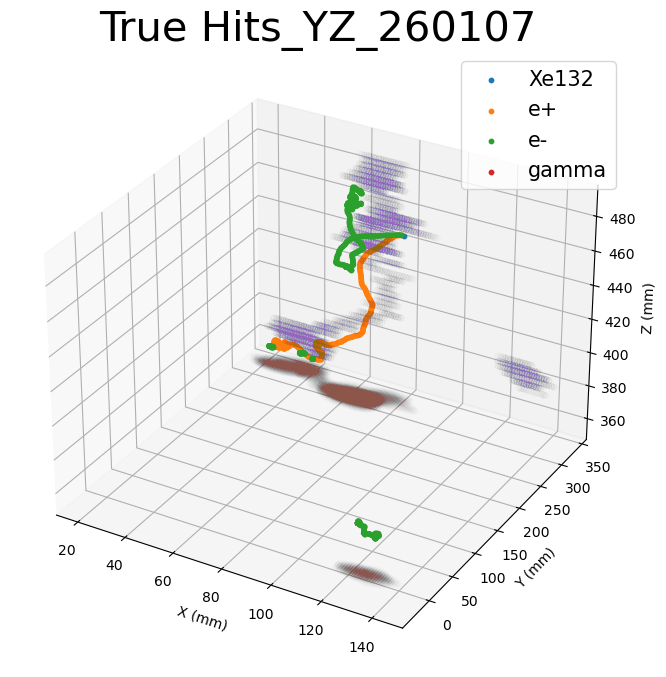

Track knowledge


,event,true_tracks,reco_tracks,reco-true
128,520214,2,2,0


Event: 260135
Unique particles: ['Tl208' 'e-' 'anti_nu_e' 'Pb208[3708.451]' 'gamma' 'Pb208[3197.711]'
 'Pb208[2614.522]' 'Xe131' 'e+' 'Pb208']


/tmp/ipykernel_25758/1644647825.py:99: RuntimeWarning: invalid value encountered in true_divide
  initial_momentum_xyz = initial_momentum_xyz / np.linalg.norm(initial_momentum_xyz)
/tmp/ipykernel_25758/1644647825.py:100: RuntimeWarning: invalid value encountered in true_divide
  final_momentum_xyz = final_momentum_xyz / np.linalg.norm(final_momentum_xyz)


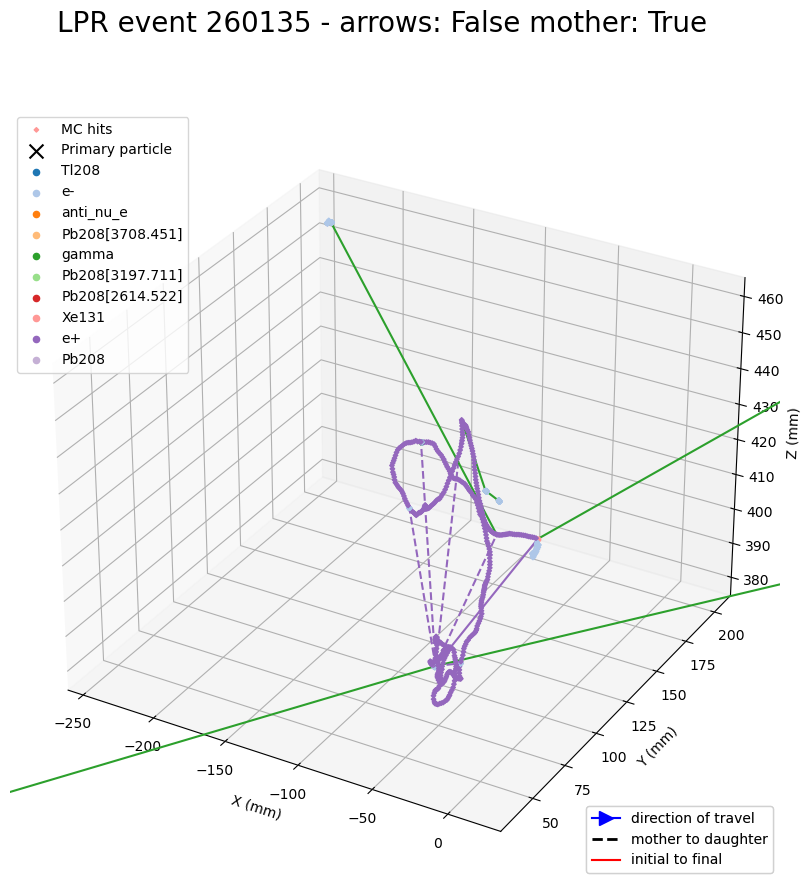

/tmp/ipykernel_25758/2268694555.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  true['particle_name'] = true['particle_id'].apply(return_id)


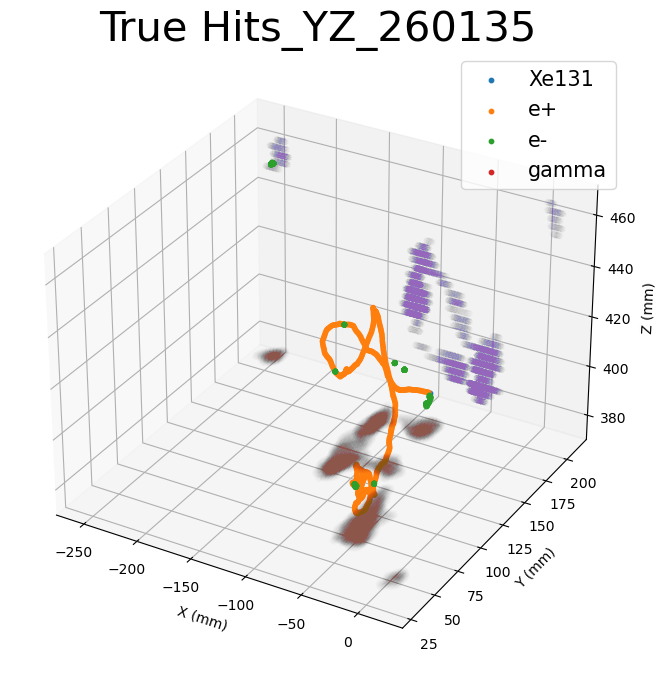

Track knowledge


,event,true_tracks,reco_tracks,reco-true
129,520270,3,3,0


Event: 260145
Unique particles: ['Tl208' 'e-' 'anti_nu_e' 'Pb208[3197.711]' 'gamma' 'Pb208[2614.522]'
 'Xe132' 'e+' 'Pb208']


/tmp/ipykernel_25758/1644647825.py:99: RuntimeWarning: invalid value encountered in true_divide
  initial_momentum_xyz = initial_momentum_xyz / np.linalg.norm(initial_momentum_xyz)
/tmp/ipykernel_25758/1644647825.py:100: RuntimeWarning: invalid value encountered in true_divide
  final_momentum_xyz = final_momentum_xyz / np.linalg.norm(final_momentum_xyz)


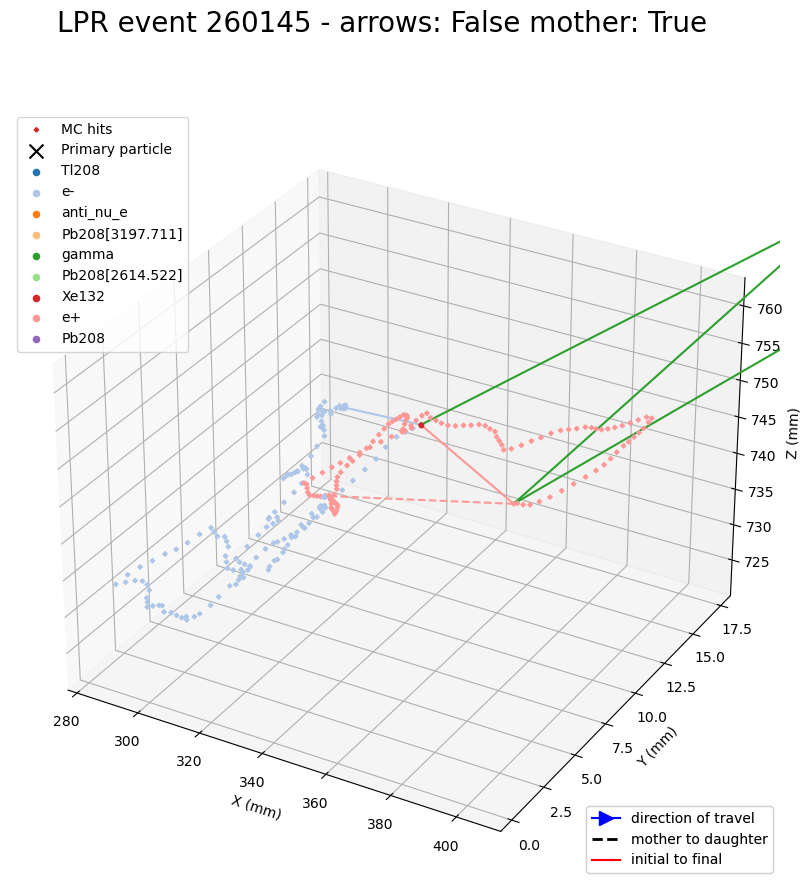

/tmp/ipykernel_25758/2268694555.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  true['particle_name'] = true['particle_id'].apply(return_id)


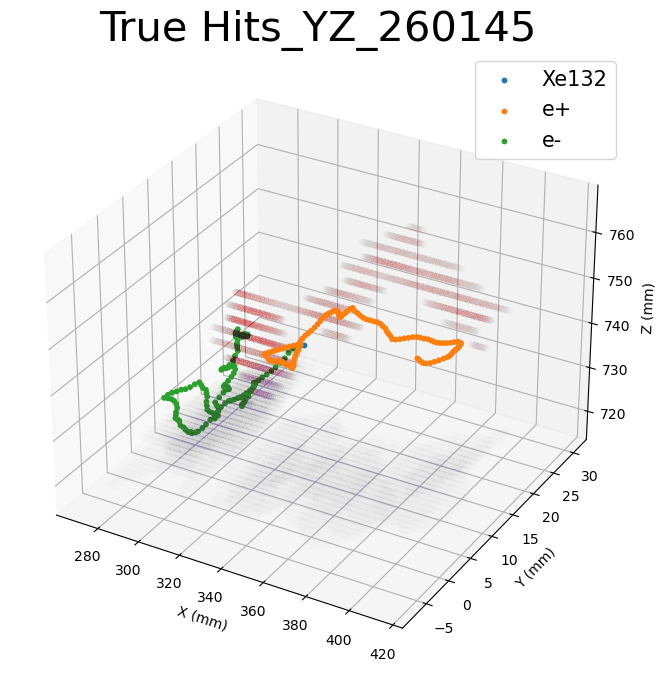

Track knowledge


,event,true_tracks,reco_tracks,reco-true
130,520290,1,1,0


Event: 260188
Unique particles: ['Tl208' 'e-' 'anti_nu_e' 'Pb208[3197.711]' 'gamma' 'Pb208[2614.522]'
 'Xe132' 'e+' 'Pb208']


/tmp/ipykernel_25758/1644647825.py:99: RuntimeWarning: invalid value encountered in true_divide
  initial_momentum_xyz = initial_momentum_xyz / np.linalg.norm(initial_momentum_xyz)
/tmp/ipykernel_25758/1644647825.py:100: RuntimeWarning: invalid value encountered in true_divide
  final_momentum_xyz = final_momentum_xyz / np.linalg.norm(final_momentum_xyz)


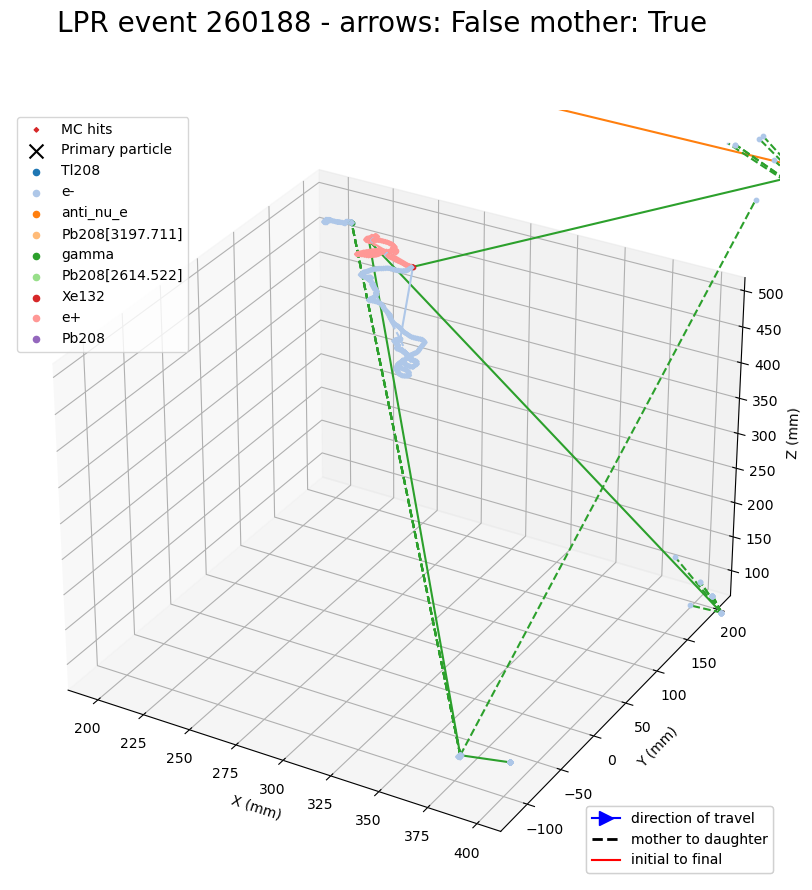

/tmp/ipykernel_25758/2268694555.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  true['particle_name'] = true['particle_id'].apply(return_id)


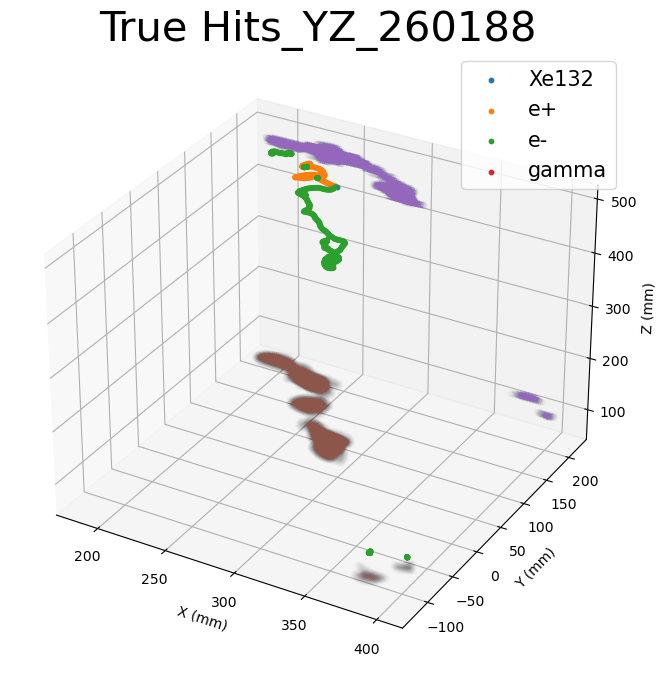

Track knowledge


,event,true_tracks,reco_tracks,reco-true
131,520376,4,3,-1


Event: 260200
Unique particles: ['Tl208' 'e-' 'anti_nu_e' 'Pb208[3197.711]' 'gamma' 'Pb208[2614.522]'
 'Xe129' 'e+' 'Pb208']


/tmp/ipykernel_25758/1644647825.py:99: RuntimeWarning: invalid value encountered in true_divide
  initial_momentum_xyz = initial_momentum_xyz / np.linalg.norm(initial_momentum_xyz)
/tmp/ipykernel_25758/1644647825.py:100: RuntimeWarning: invalid value encountered in true_divide
  final_momentum_xyz = final_momentum_xyz / np.linalg.norm(final_momentum_xyz)


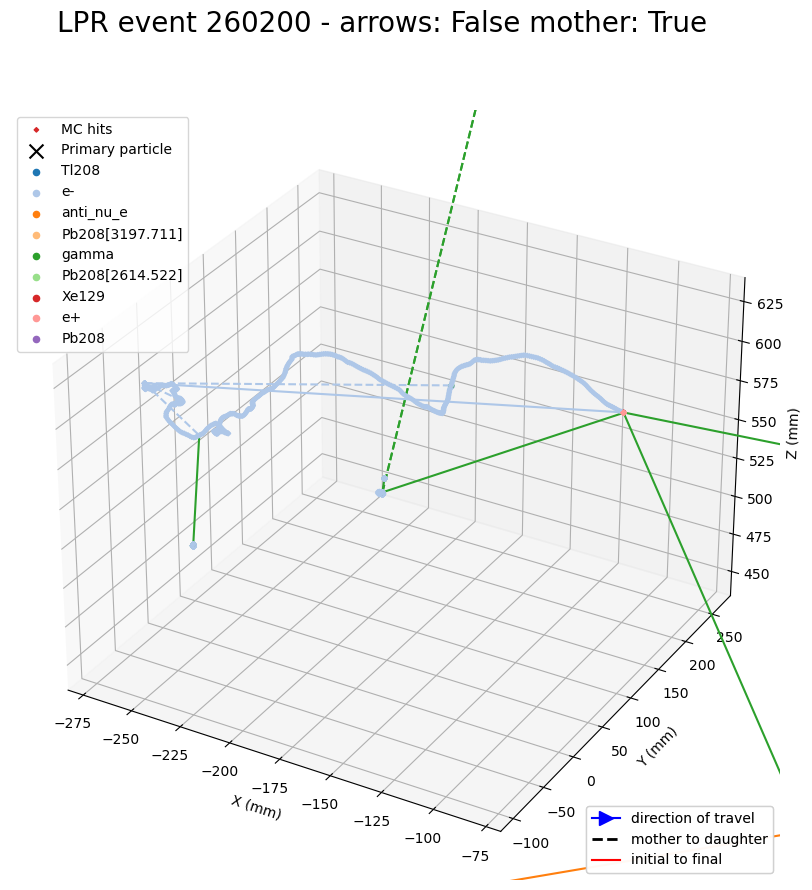

/tmp/ipykernel_25758/2268694555.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  true['particle_name'] = true['particle_id'].apply(return_id)


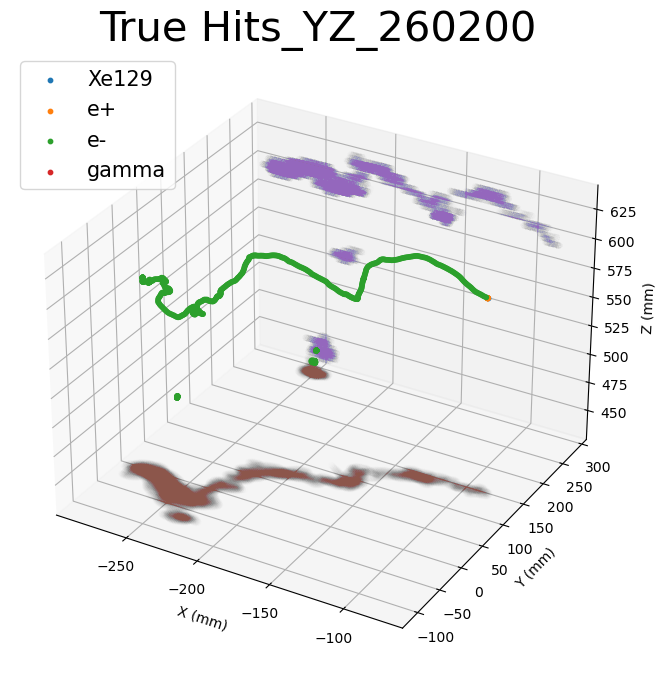

Track knowledge


,event,true_tracks,reco_tracks,reco-true
132,520400,3,3,0


Event: 260235
Unique particles: ['Tl208' 'e-' 'anti_nu_e' 'Pb208[3197.711]' 'gamma' 'Pb208[2614.522]'
 'Xe129' 'e+' 'Pb208']


/tmp/ipykernel_25758/1644647825.py:99: RuntimeWarning: invalid value encountered in true_divide
  initial_momentum_xyz = initial_momentum_xyz / np.linalg.norm(initial_momentum_xyz)
/tmp/ipykernel_25758/1644647825.py:100: RuntimeWarning: invalid value encountered in true_divide
  final_momentum_xyz = final_momentum_xyz / np.linalg.norm(final_momentum_xyz)


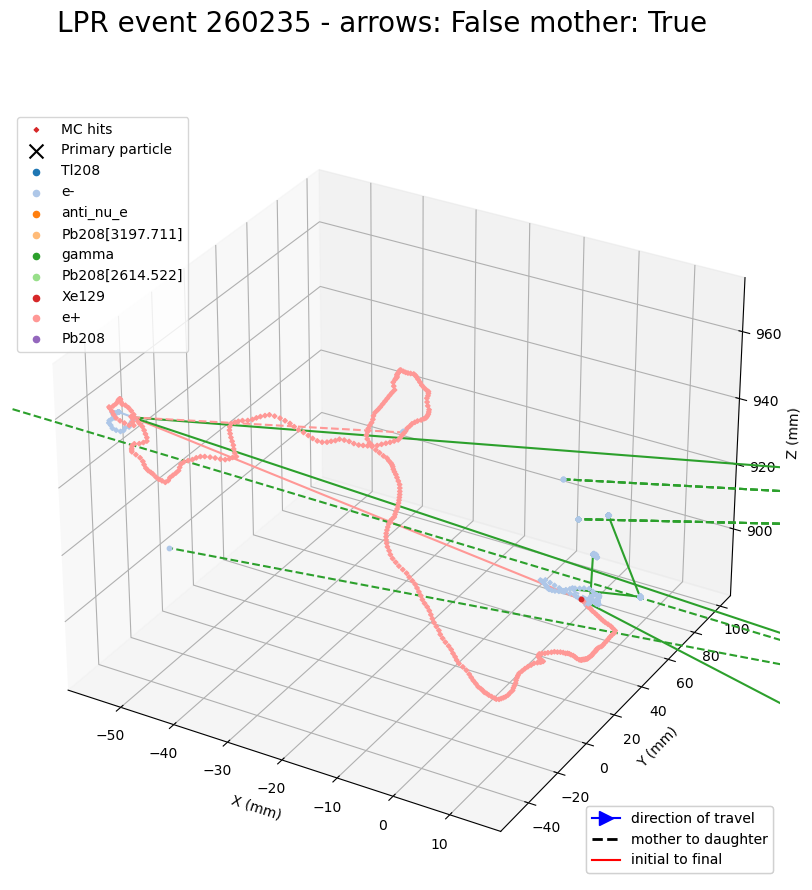

/tmp/ipykernel_25758/2268694555.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  true['particle_name'] = true['particle_id'].apply(return_id)


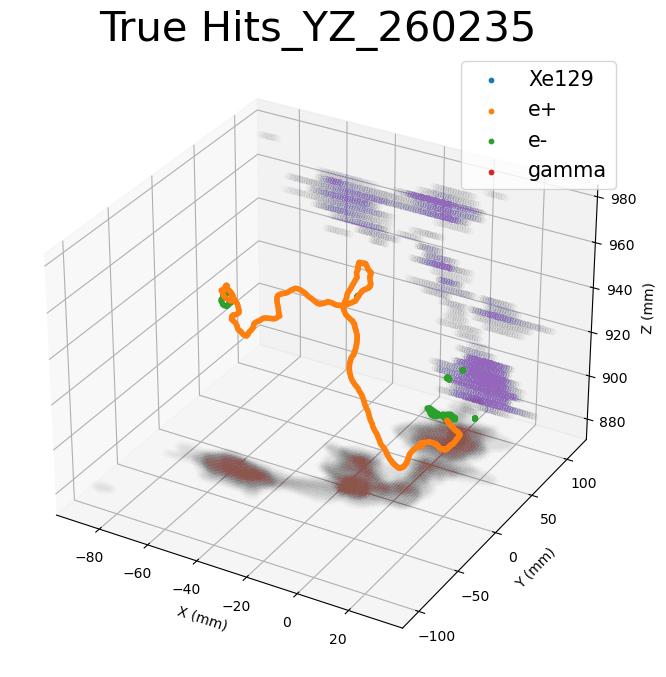

Track knowledge


,event,true_tracks,reco_tracks,reco-true
133,520470,3,2,-1


Event: 260302
Unique particles: ['Tl208' 'e-' 'anti_nu_e' 'Pb208[3708.451]' 'gamma' 'Pb208[3197.711]'
 'Pb208[2614.522]' 'Xe129' 'e+' 'Pb208']


/tmp/ipykernel_25758/1644647825.py:99: RuntimeWarning: invalid value encountered in true_divide
  initial_momentum_xyz = initial_momentum_xyz / np.linalg.norm(initial_momentum_xyz)
/tmp/ipykernel_25758/1644647825.py:100: RuntimeWarning: invalid value encountered in true_divide
  final_momentum_xyz = final_momentum_xyz / np.linalg.norm(final_momentum_xyz)


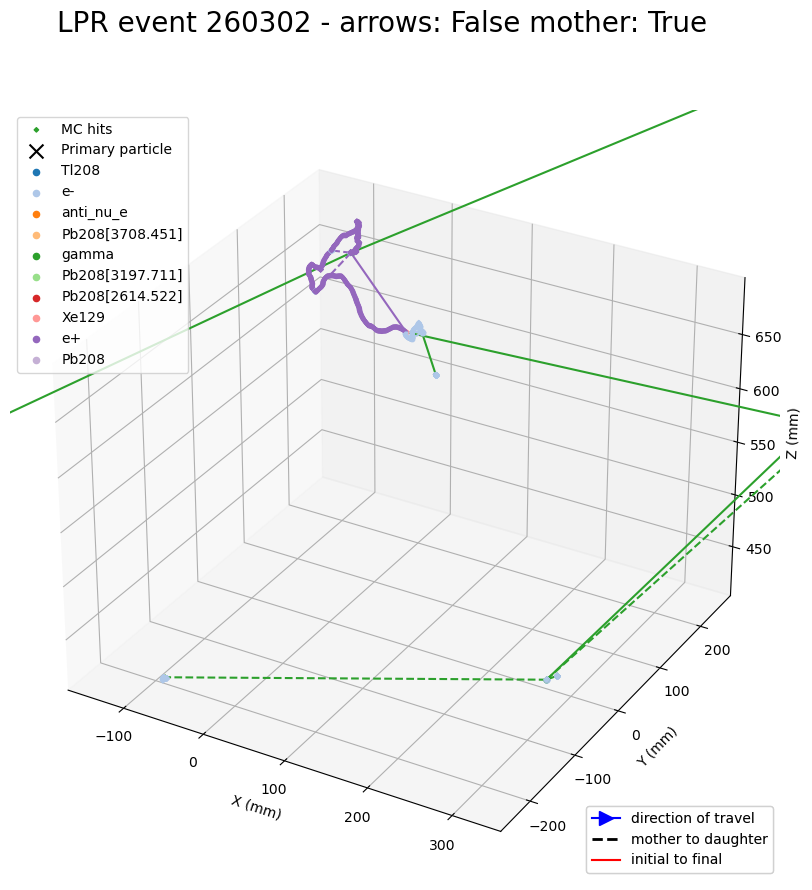

/tmp/ipykernel_25758/2268694555.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  true['particle_name'] = true['particle_id'].apply(return_id)


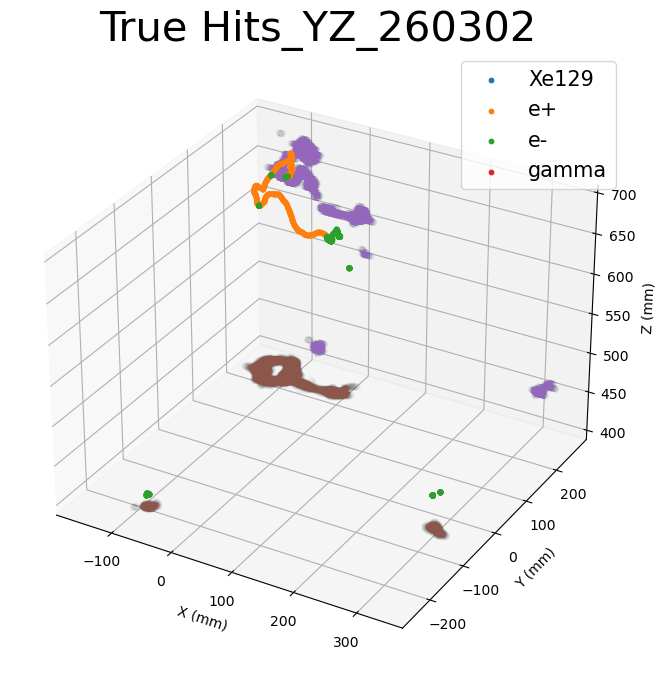

Track knowledge


,event,true_tracks,reco_tracks,reco-true
134,520604,4,5,1


Event: 160238
Unique particles: ['Tl208' 'e-' 'anti_nu_e' 'Pb208[3708.451]' 'gamma' 'Pb208[3197.711]'
 'Pb208[2614.522]' 'Xe132' 'e+' 'Pb208']


/tmp/ipykernel_25758/1644647825.py:99: RuntimeWarning: invalid value encountered in true_divide
  initial_momentum_xyz = initial_momentum_xyz / np.linalg.norm(initial_momentum_xyz)
/tmp/ipykernel_25758/1644647825.py:100: RuntimeWarning: invalid value encountered in true_divide
  final_momentum_xyz = final_momentum_xyz / np.linalg.norm(final_momentum_xyz)


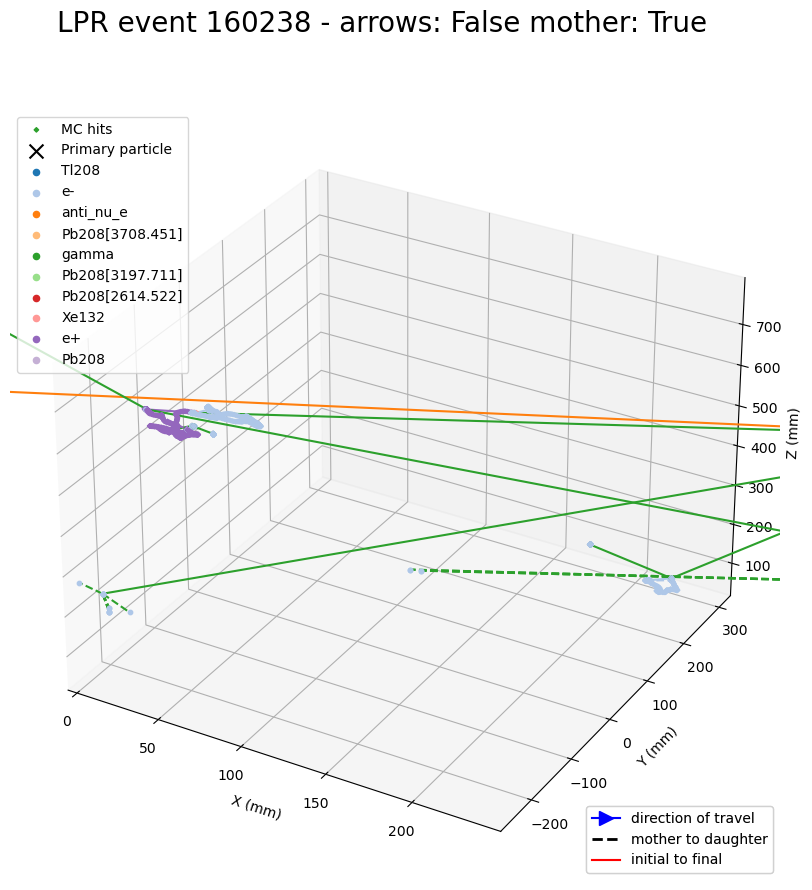

/tmp/ipykernel_25758/2268694555.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  true['particle_name'] = true['particle_id'].apply(return_id)


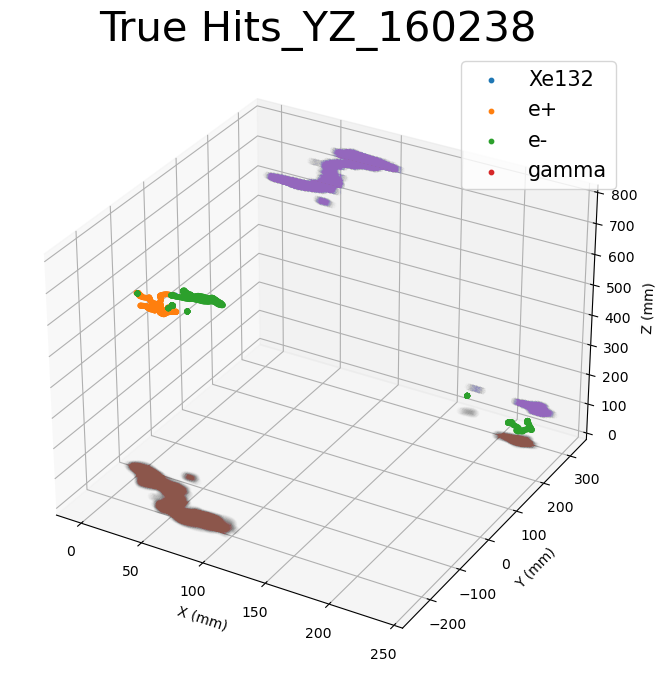

Track knowledge


,event,true_tracks,reco_tracks,reco-true
82,320476,4,4,0


Event: 160302
Unique particles: ['Tl208' 'e-' 'anti_nu_e' 'Pb208[3197.711]' 'gamma' 'Pb208[2614.522]'
 'Xe131' 'e+' 'Pb208']


/tmp/ipykernel_25758/1644647825.py:99: RuntimeWarning: invalid value encountered in true_divide
  initial_momentum_xyz = initial_momentum_xyz / np.linalg.norm(initial_momentum_xyz)
/tmp/ipykernel_25758/1644647825.py:100: RuntimeWarning: invalid value encountered in true_divide
  final_momentum_xyz = final_momentum_xyz / np.linalg.norm(final_momentum_xyz)


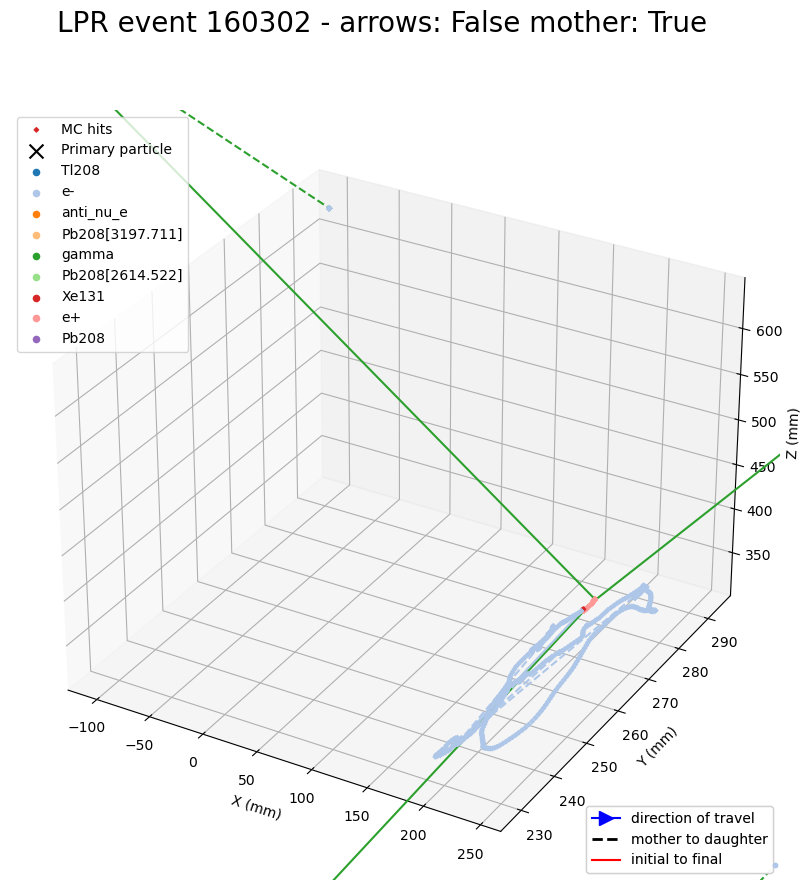

/tmp/ipykernel_25758/2268694555.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  true['particle_name'] = true['particle_id'].apply(return_id)


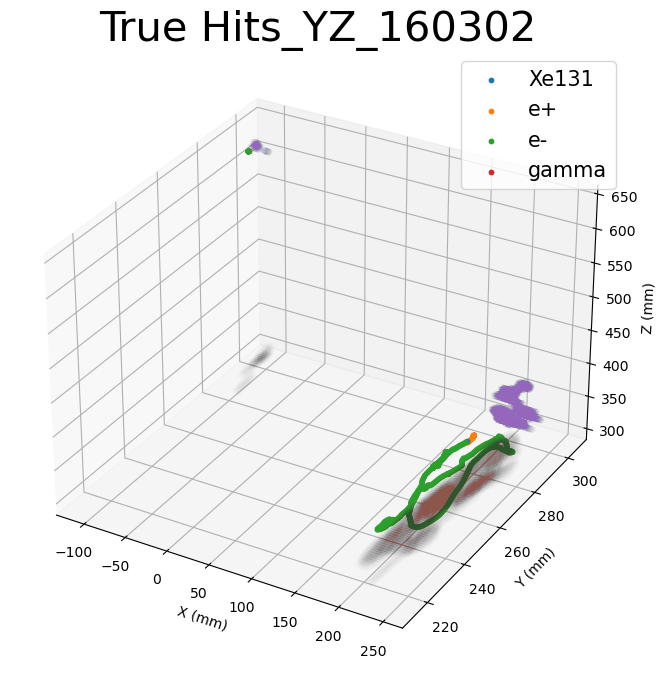

Track knowledge


,event,true_tracks,reco_tracks,reco-true
83,320604,2,2,0


Event: 160331
Unique particles: ['Tl208' 'e-' 'anti_nu_e' 'Pb208[3197.711]' 'gamma' 'Pb208[2614.522]'
 'Xe132' 'e+' 'Pb208']


/tmp/ipykernel_25758/1644647825.py:99: RuntimeWarning: invalid value encountered in true_divide
  initial_momentum_xyz = initial_momentum_xyz / np.linalg.norm(initial_momentum_xyz)
/tmp/ipykernel_25758/1644647825.py:100: RuntimeWarning: invalid value encountered in true_divide
  final_momentum_xyz = final_momentum_xyz / np.linalg.norm(final_momentum_xyz)


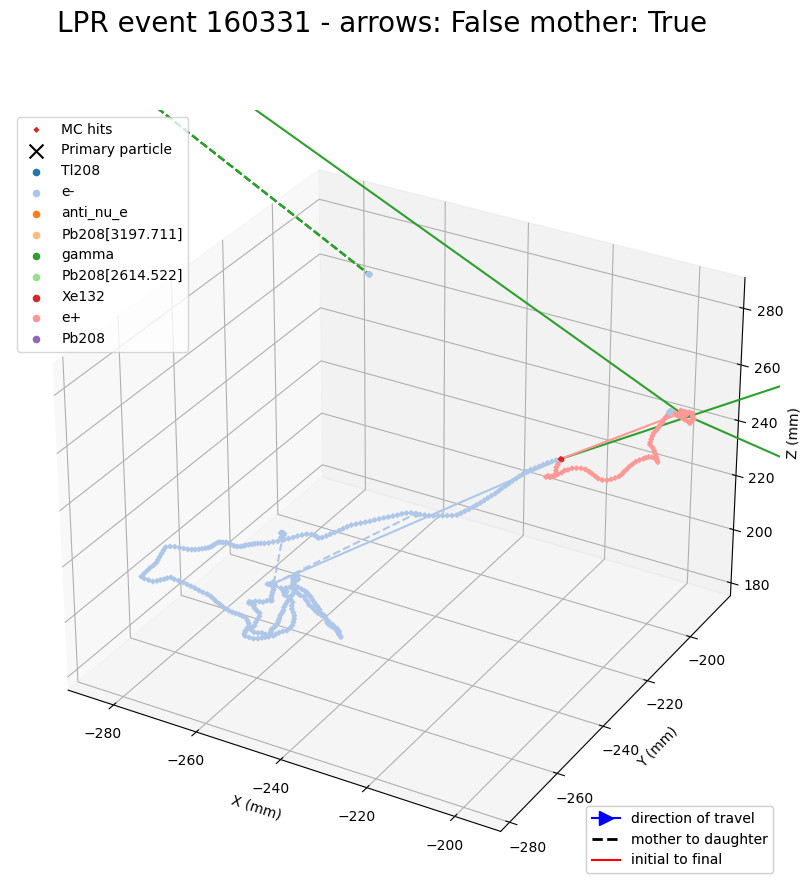

/tmp/ipykernel_25758/2268694555.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  true['particle_name'] = true['particle_id'].apply(return_id)


KeyboardInterrupt: 

In [150]:
# read in data

# only keep the events we care about
data = pd.read_pickle('true_reco_v9.h5')

data_events = np.unique(data.event.to_numpy()) //2
display(data_events)


folder_path = 'data/'

softblock = 10



file_names = [f for f in os.listdir(folder_path) if os.path.isfile(os.path.join(folder_path, f))]
for i, file in enumerate(file_names):

    dfMC = mcio.load_mchits_df(folder_path + file).reset_index()
    dfP = mcio.load_mcparticles_dfnew(folder_path + file).reset_index()
    
    eventsMC = np.unique(dfMC.event_id.to_numpy())

    deco = pd.read_hdf(folder_path + file, 'DECO/Events')

    # take the dodgy ones
    dfMC_dodgys = dfMC[dfMC.event_id.isin(data_events)]
    dfP_dodgys = dfP[dfP.event_id.isin(data_events)]
    
    # plot the dodgy events
    for q in np.unique(dfMC_dodgys.event_id.to_numpy()):
        plot_all_info(dfMC_dodgys, dfP_dodgys, data, q, deco)

    if i > softblock:
        break


